<a href="https://colab.research.google.com/github/siupong114/Bitcoin-Price-Prediction/blob/main/Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Import Packages

In [1]:
# Check if running in Colab
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:
    !pip install pandas_ta
    !pip install numpy==1.23.5
    !pip install pandas
    !pip install seaborn
    !pip install xgboost

    !git clone https://github.com/siupong114/Bitcoin-Price-Prediction.git

    %cd Bitcoin_prediction
    %pip install pandas_ta
else:
    print("Not running in Colab, skipping git clone and directory change")

Cloning into 'Bitcoin-Price-Prediction'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 6 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (6/6), 7.31 MiB | 14.10 MiB/s, done.
[Errno 2] No such file or directory: 'Bitcoin_prediction'
/content


In [ ]:
# General Libraries
import numpy as np
import pandas as pd
import pandas_ta as ta
import csv
import warnings
from tqdm import tqdm
from tqdm.auto import tqdm
from scipy import stats
from scipy.stats import zscore

# Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt
import pylab as py

# Data Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# General Model Selection and Metrics
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    TimeSeriesSplit,
    RepeatedKFold,
    cross_val_score,
    StratifiedKFold
)

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)

# Regression Models and Tools
from sklearn.linear_model import (
    LinearRegression,
    Ridge,
    Lasso,
    ElasticNet,
    RidgeCV,
    LassoCV,
    ElasticNetCV
)

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (
    BaggingRegressor,
    RandomForestRegressor,
    GradientBoostingRegressor,
    AdaBoostRegressor,
    StackingRegressor
)

# from xgboost import XGBRegressor

# Stats Models
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import (
    variance_inflation_factor,
    summary_table,
    OLSInfluence
)
from statsmodels.regression.linear_model import OLSResults
from statsmodels.stats.stattools import durbin_watson as dwtest
from statsmodels.sandbox.stats.runs import runstest_1samp
from statsmodels.stats.diagnostic import het_white
from statsmodels.compat import lzip

# Settings
warnings.filterwarnings("ignore")
pd.set_option("display.float_format", lambda x: "%.4f" % x)
pd.set_option("display.max_columns", None)


#Load dataset

In [ ]:
#Data preprocessing and cleaning
btc_data = pd.read_csv('Bitcoin Historical Data.csv', on_bad_lines='skip', lineterminator='\n')
# Check if 'Change %\r' exists and rename it to 'Change'
if 'Change %\r' in btc_data.columns:
    btc_data.rename(columns={'Change %\r': 'Change'}, inplace=True)
btc_data.tail(5)

,Date,Price,Open,High,Low,Vol. ('000),Change
4107,1/5/2014,1014.7000,924.7000,1029.9000,911.4000,21.37,9.74%\r
4108,1/4/2014,924.7000,884.3000,932.2000,848.3000,14.24,4.57%\r
4109,1/3/2014,884.3000,856.9000,888.2000,839.4000,9.71,3.19%\r
4110,1/2/2014,856.9000,815.9000,886.2000,810.5000,12.81,5.02%\r
4111,1/1/2014,815.9000,805.9000,829.9000,771.0000,10.76,1.24%


In [ ]:
# Convert the dictionary to a DataFrame
btc_data = pd.DataFrame(btc_data)

# Parse the "Date" column into datetime format
btc_data["Date"] = pd.to_datetime(btc_data["Date"], format="%m/%d/%Y")

# Sort the data by date in ascending order
btc_data.sort_values(by="Date", ascending=True, inplace=True)


In [ ]:
gold_price_data = pd.read_csv('gold_price_data.csv', on_bad_lines='skip', lineterminator='\n', sep=';')
# Check if 'Gold_Volume %\r' exists and rename it to 'Gold_Volume %'
if 'Gold_Volume\r' in gold_price_data.columns:
    gold_price_data.rename(columns={'Gold_Volume\r': 'Gold_Volume'}, inplace=True)
gold_price_data.tail(5)

,Date,Gold_Price,Gold_Volume
4047,2025-01-30,2794.0600,83835.0000
4048,2025-01-31,2799.2300,91164.0000
4049,2025-02-01,2799.2300,91164.0000
4050,2025-02-02,2799.2300,91164.0000
4051,2025-02-03,2794.4100,1631.0000


In [ ]:
risk_free_data = pd.read_csv('risk_free_data.csv', on_bad_lines='skip', lineterminator='\n', sep=',')
# rename the Yield_Spread\r to Yield_Spread
risk_free_data.rename(columns={'Yield_Spread\r': 'Yield_Spread'}, inplace=True)
risk_free_data.tail(5)

,Date,US_10Y,Yield_Spread
4126,2025-04-19,4.3400,0.5300
4127,2025-04-20,4.3400,0.5300
4128,2025-04-21,4.4200,0.6700
4129,2025-04-22,4.4100,0.6500
4130,2025-04-23,4.4000,0.5900


In [ ]:
spy_data = pd.read_csv('spy_data.csv', on_bad_lines='skip', lineterminator='\n', sep=',')
# Check if 'SPY_Volume\r' exists and rename it to 'SPY_Volume'
if 'SPY_Volume\r' in spy_data.columns:
    spy_data.rename(columns={'SPY_Volume\r': 'SPY_Volume'}, inplace=True)
spy_data.tail(5)

,Date,SPY_Price,SPY_Volume
4114,2025-04-07,504.3800,256611400.0000
4115,2025-04-08,496.4800,165816600.0000
4116,2025-04-09,548.6200,241867300.0000
4117,2025-04-10,524.5800,162331200.0000
4118,2025-04-11,533.9400,97741700.0000


In [ ]:
eth_data = pd.read_csv('eth_data.csv', on_bad_lines='skip', lineterminator='\n', sep=',')

# Remove the dollar sign and convert 'ETH_Price' to a numeric type
eth_data['ETH_Price'] = eth_data['ETH_Price'].replace('[\$,]', '', regex=True).astype(float)

# Check if 'ETH_Volume %\r' exists and rename it to 'ETH_Volume %'
if 'ETH_Volume\r' in eth_data.columns:
    eth_data.rename(columns={'ETH_Volume\r': 'ETH_Volume'}, inplace=True)

eth_data.tail(5)

,Date,ETH_Price,ETH_Volume
3545,2025-04-21,1579.0000,7152430.0000
3546,2025-04-22,1757.0000,11023237.0000
3547,2025-04-23,1795.0000,9128461.0000
3548,2025-04-24,1768.0000,6161937.0000
3549,2025-04-25,1787.0000,7136697.0000


In [ ]:
#Change the 'Date' to datetime format
gold_price_data['Date'] = pd.to_datetime(gold_price_data['Date'])
risk_free_data['Date'] = pd.to_datetime(risk_free_data['Date'])
spy_data['Date'] = pd.to_datetime(spy_data['Date'])
eth_data['Date'] = pd.to_datetime(eth_data['Date'])

#Data Preprocessing

In [ ]:
#Function to clean and convert volume data
def clean_volume(volume):
    if isinstance(volume, str):  # Check if the value is a string
        volume = volume.replace(',', '')  # Remove commas
        if 'B' in volume:  # If the value contains 'B' (billions)
            return float(volume.replace('B', '')) * 1_000_000_000
        elif 'M' in volume:  # If the value contains 'M' (millions)
            return float(volume.replace('M', '')) * 1_000_000
        elif 'K' in volume:  # If the value contains 'K' (thousands)
            return float(volume.replace('K', '')) * 1_000
        else:  # If no suffix is present, convert to float directly
            return float(volume)
    return np.nan  # Handle unexpected cases

# Apply the cleaning function to the volume column
btc_data["Volume"] = btc_data["Vol. ('000)"].apply(clean_volume)
btc_data = btc_data.drop("Vol. ('000)", axis=1)

# 4. Remove '%' from "Change %" and convert to numeric
btc_data.rename(columns={"Change %\r": "Change"}, inplace=True)
btc_data["Change"] = btc_data["Change"].str.replace("%", "").str.strip().astype(float)

In [ ]:
# Check for missing values in btc_data
missing_values = btc_data.isnull().sum()
print("Missing values in each column:")
print(missing_values[missing_values > 0])

# Ensure 'Date' is sorted
btc_data = btc_data.sort_values('Date')

# Calculate the difference between consecutive dates
btc_data['Date_Diff'] = btc_data['Date'].diff().dt.days

# Check if all differences are 1 day
if (btc_data['Date_Diff'].iloc[1:] == 1).all():
    print("All dates are consecutive.")
else:
    print("There are missing dates.")
    print(btc_data[btc_data['Date_Diff'] > 1])  # Display rows with missing dates

# Drop the 'Date_Diff' column after the check
btc_data.drop(columns=['Date_Diff'], inplace=True)

Missing values in each column:
Series([], dtype: int64)
There are missing dates.
         Date      Price       Open       High        Low  Change   Volume  \
82 2025-01-13 94534.3000 94540.5000 95906.9000 89664.8000 -0.0800 115.2000   

    Date_Diff  
82     2.0000  


In [ ]:
# Define the missing data as a dictionary
missing_data = {
    'Date': '01/12/2025',
    'Price': 94541.8,
    'Open': 94600.0,
    'High': 95384.3,
    'Low': 93711.2,
    'Volume': 17.60,  # Assuming 'Vol. (\'000)' is in thousands
    'Change': -0.07  # Assuming 'Change %' is already converted to a float
}

# Convert the dictionary to a DataFrame
missing_data_df = pd.DataFrame([missing_data])

# Ensure the 'Date' column is in datetime format
missing_data_df['Date'] = pd.to_datetime(missing_data_df['Date'])

# Append the missing data to btc_data
btc_data = pd.concat([btc_data, missing_data_df], ignore_index=True)

# Filter the data for the date range 01/10/2025 to 01/20/2025
filtered_data = btc_data[(btc_data['Date'] >= '2025-01-10') & (btc_data['Date'] <= '2025-01-20')]

# Display the filtered data
print(filtered_data)

           Date       Price        Open        High         Low  Change  \
4027 2025-01-10  94724.1000  92540.5000  95760.6000  92310.6000  2.3600   
4028 2025-01-11  94612.0000  94724.0000  94765.5000  93847.8000 -0.1200   
4029 2025-01-13  94534.3000  94540.5000  95906.9000  89664.8000 -0.0800   
4030 2025-01-14  96542.1000  94536.7000  97361.2000  94359.5000  2.1200   
4031 2025-01-15 100499.8000  96547.4000 100671.0000  96501.9000  4.1000   
4032 2025-01-16 100004.5000 100499.9000 100812.4000  97400.2000 -0.4900   
4033 2025-01-17 104084.9000  99991.9000 105843.8000  99956.2000  4.0800   
4034 2025-01-18 104536.9000 104084.7000 104953.1000 102297.0000  0.4300   
4035 2025-01-19 101319.5000 104536.8000 106338.2000  99742.7000 -3.0800   
4036 2025-01-20 102197.7000 101313.3000 109228.6000  99676.0000  0.8700   
4112 2025-01-12  94541.8000  94600.0000  95384.3000  93711.2000 -0.0700   

       Volume  
4027 125.4200  
4028  72.6600  
4029 115.2000  
4030  87.7900  
4031  95.3200  
403

In [ ]:
# Day of the week (0=Monday, 6=Sunday)
btc_data["Day_of_Week"] = btc_data["Date"].dt.dayofweek

# Week of the year
btc_data["Week_of_Year"] = btc_data["Date"].dt.isocalendar().week

# Month of the year
btc_data["Month"] = btc_data["Date"].dt.month

# Quarter of the year
btc_data["Quarter"] = btc_data["Date"].dt.quarter

# Year
btc_data["Year"] = btc_data["Date"].dt.year

## Signal Detection

In [ ]:
# Calculate RSI, EMA, SMA, and MACD
btc_data["RSI_6"] = ta.rsi(btc_data["Price"], length=6)  # Relative Strength Index
btc_data["RSI_12"] = ta.rsi(btc_data["Price"], length=12)  # Relative Strength Index
btc_data["EMA_14"] = ta.ema(btc_data["Price"], length=14)  # Exponential Moving Average
btc_data["SMA_14"] = ta.sma(btc_data["Price"], length=14)  # Simple Moving Average

# Add On-Balance Volume (OBV)
btc_data["OBV"] = ta.obv(btc_data["Price"], btc_data["Volume"])

# Calculate MACD --------------------------------------------------------------------------------------
macd = ta.macd(btc_data["Price"], fast=12, slow=26, signal=9)
btc_data["MACD"] = macd["MACD_12_26_9"]
btc_data["MACD_Signal"] = macd["MACDs_12_26_9"]

# Create MACD_buy: 1 if MACD crosses above MACD_Signal, otherwise 0
btc_data["MACD_buy"] = 0  # Default to 0 (no buy signal)
btc_data.loc[
    (btc_data["MACD"] > btc_data["MACD_Signal"]) &  # MACD is above Signal
    (btc_data["MACD"].shift(1) <= btc_data["MACD_Signal"].shift(1)),  # Previous MACD was below or equal to Signal
    "MACD_buy"] = 1  # Buy signal

# Create MACD_sell: 1 if MACD crosses below MACD_Signal, otherwise 0
btc_data["MACD_sell"] = 0  # Default to 0 (no sell signal)
btc_data.loc[
    (btc_data["MACD"] <= btc_data["MACD_Signal"]) &  # MACD is below or equal to Signal
    (btc_data["MACD"].shift(1) > btc_data["MACD_Signal"].shift(1)),  # Previous MACD was above Signal
    "MACD_sell"] = 1  # Sell signal

# New Variable: MACD_above_signal (1 if MACD > MACD_Signal, otherwise 0)
btc_data["MACD_above_signal"] = (btc_data["MACD"] > btc_data["MACD_Signal"]).astype(int)

# New Variable: MACD_below_signal (1 if MACD <= MACD_Signal, otherwise 0)
btc_data["MACD_below_signal"] = (btc_data["MACD"] <= btc_data["MACD_Signal"]).astype(int)

# Create MACD_cum_buy: Accumulate consecutive days where MACD_above_signal is 1
btc_data["MACD_cum_buy"] = (
    btc_data["MACD_above_signal"]
    .groupby((btc_data["MACD_above_signal"] == 0).cumsum())  # Group by resets when MACD_above_signal is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["MACD_above_signal"] == 0, "MACD_cum_buy"] = 0  # Reset to 0 where the condition is not met

# Create MACD_cum_sell: Accumulate consecutive days where MACD_below_signal is 1
btc_data["MACD_cum_sell"] = (
    btc_data["MACD_below_signal"]
    .groupby((btc_data["MACD_below_signal"] == 0).cumsum())  # Group by resets when MACD_below_signal is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["MACD_below_signal"] == 0, "MACD_cum_sell"] = 0  # Reset to 0


# Calculate Bollinger Bands --------------------------------------------------------------------------------------
bb = ta.bbands(btc_data["Price"], length=20, std=2)  # 20-period BB with 2 standard deviations
btc_data["BB_upper"] = bb.get("BBU_20_2.0")  # Upper Bollinger Band
btc_data["BB_lower"] = bb.get("BBL_20_2.0")  # Lower Bollinger Band

# Create BB_Buy: 1 if Price crosses below the Lower Band, otherwise 0
btc_data["BB_Buy"] = 0  # Default to 0 (no buy signal)
btc_data.loc[
    (btc_data["Price"] < btc_data["BB_lower"]) &  # Price is below the Lower Band
    (btc_data["Price"].shift(1) >= btc_data["BB_lower"].shift(1)),  # Previous Price was above or equal to Lower Band
    "BB_Buy"] = 1  # Buy signal

# Create BB_Sell: 1 if Price crosses above the Upper Band, otherwise 0
btc_data["BB_Sell"] = 0  # Default to 0 (no sell signal)
btc_data.loc[
    (btc_data["Price"] > btc_data["BB_upper"]) &  # Price is above the Upper Band
    (btc_data["Price"].shift(1) <= btc_data["BB_upper"].shift(1)),  # Previous Price was below or equal to Upper Band
    "BB_Sell"] = 1  # Sell signal

# New Variable: Price_above_lower_band (1 if Price > BB_lower, otherwise 0)
btc_data["Price_below_BB_lower"] = (btc_data["Price"] < btc_data["BB_lower"]).astype(int)

# New Variable: Price_below_upper_band (1 if Price < BB_upper, otherwise 0)
btc_data["Price_above_BB_upper"] = (btc_data["Price"] > btc_data["BB_upper"]).astype(int)

# Create BB_cum_Buy: Accumulate consecutive days where Price_below_BB_lower is 1
btc_data["BB_cum_Buy"] = (
    btc_data["Price_below_BB_lower"]
    .groupby((btc_data["Price_below_BB_lower"] == 0).cumsum())  # Group by resets when Price_below_BB_lower is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["Price_below_BB_lower"] == 0, "BB_cum_Buy"] = 0  # Reset to 0 where the condition is not met

# Create BB_cum_Sell: Accumulate consecutive days where Price_above_BB_upper is 1
btc_data["BB_cum_Sell"] = (
    btc_data["Price_above_BB_upper"]
    .groupby((btc_data["Price_above_BB_upper"] == 0).cumsum())  # Group by resets when Price_above_BB_upper is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["Price_above_BB_upper"] == 0, "BB_cum_Sell"] = 0  # Reset to 0 where the condition is not met

# Calculate ATR --------------------------------------------------------------------------------------
btc_data["ATR"] = ta.atr(btc_data["High"], btc_data["Low"], btc_data["Price"], length=14)

# Set Stop-Loss Levels (Example with Long Trade)
atr_multiplier = 2
btc_data["Stop_Loss_Long"] = btc_data["Price"] - (btc_data["ATR"] * atr_multiplier) #Stop-Loss for Buy (Long) Trade
btc_data["Stop_Loss_Short"] = btc_data["Price"] + (btc_data["ATR"] * atr_multiplier) #Stop-Loss for Sell (Short) Trade

# Calculate VWAP --------------------------------------------------------------------------------------
btc_data.set_index("Date", inplace=True) # Set the "Date" column as the index
btc_data["VWAP"] = ta.vwap(btc_data["High"], btc_data["Low"], btc_data["Price"], btc_data["Volume"])

# Create VWAP_Buy: 1 if Price crosses above VWAP, otherwise 0
btc_data["VWAP_Buy"] = 0  # Default to 0 (no buy signal)
btc_data.loc[
    (btc_data["Price"] > btc_data["VWAP"]) &  # Price is above VWAP
    (btc_data["Price"].shift(1) <= btc_data["VWAP"].shift(1)),  # Previous Price was below or equal to VWAP
    "VWAP_Buy"] = 1  # Buy signal

# Create VWAP_Sell: 1 if Price crosses below VWAP, otherwise 0
btc_data["VWAP_Sell"] = 0  # Default to 0 (no sell signal)
btc_data.loc[
    (btc_data["Price"] < btc_data["VWAP"]) &  # Price is below VWAP
    (btc_data["Price"].shift(1) >= btc_data["VWAP"].shift(1)),  # Previous Price was above or equal to VWAP
    "VWAP_Sell"] = 1  # Sell signal

# Fear and greed index
fear_and_greed_index = pd.read_csv('fear_and_greed_index.csv')
# rename the date column in fear_and_greed_index to Date
fear_and_greed_index.rename(columns={"date": "Date", "value": "Fear_and_Greed_Index"}, inplace=True)
# convert the date column to datetime
fear_and_greed_index["Date"] = pd.to_datetime(fear_and_greed_index["Date"], format="%Y-%m-%d")
# dropping the timestamp, value_classification, time_until_update columns
fear_and_greed_index.drop(columns=["timestamp", "value_classification", "time_until_update"], inplace=True)
fear_and_greed_index.head()

# Join the two dataframes on the "Date" column, dropping
btc_data = btc_data.merge(fear_and_greed_index, on="Date", how="left")
btc_data.head(20)

# Support and Resistance Levels
btc_data["Support"] = btc_data["Low"].rolling(window=20).min()  # Lowest low in the past 20 days
btc_data["Resistance"] = btc_data["High"].rolling(window=20).max()  # Highest high in the past 20 days

# Add two columns for extreme fear and extreme greed
btc_data["Extreme_Fear"] = np.where(btc_data["Fear_and_Greed_Index"] < 20, 1, 0)
btc_data["Extreme_Greed"] = np.where(btc_data["Fear_and_Greed_Index"] > 80, 1, 0)
btc_data.describe().T

# Use 70 in RSI to classify overbought and 30 to classify oversold
btc_data["RSI_12_Oversold"] = np.where(btc_data["RSI_12"] < 30, 1, 0)  # Create RSI_12_Oversold column
btc_data.loc[btc_data["RSI_12_Oversold"] == 0, "Consecutive_RSI_12_Oversold"] = 0  # Reset to 0 where the condition is not met
btc_data["RSI_12_Overbought"] = np.where(btc_data["RSI_12"] > 70, 1, 0)

# Adding RSI_6 greater than RSI_12 to show bullish divergence and conversely
btc_data["RSI_Divergence"] = np.where(btc_data["RSI_6"] > btc_data["RSI_12"], 1, 0)
btc_data.describe().T


# Count consecutive appearances of Extreme_Fear
btc_data["Consecutive_Extreme_Fear"] = (
    btc_data["Extreme_Fear"]
    .groupby((btc_data["Extreme_Fear"] == 0).cumsum())  # Group by resets when Extreme_Fear is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["Extreme_Fear"] == 0, "Consecutive_Extreme_Fear"] = 0  # Reset to 0 where the condition is not met

# Count consecutive appearances of Extreme_Greed
btc_data["Consecutive_Extreme_Greed"] = (
    btc_data["Extreme_Greed"]
    .groupby((btc_data["Extreme_Greed"] == 0).cumsum())  # Group by resets when Extreme_Greed is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["Extreme_Greed"] == 0, "Consecutive_Extreme_Greed"] = 0  # Reset to 0 where the condition is not met

# Forward fill the missing value in 'Fear_and_Greed_Index'
btc_data['Fear_and_Greed_Index'] = btc_data['Fear_and_Greed_Index'].fillna(method='ffill')

# Count consecutive appearances of RSI_12_Overbought
btc_data["Consecutive_RSI_12_Overbought"] = (
    btc_data["RSI_12_Overbought"]
    .groupby((btc_data["RSI_12_Overbought"] == 0).cumsum())  # Group by resets when RSI_12_Overbought is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["RSI_12_Overbought"] == 0, "Consecutive_RSI_12_Overbought"] = 0  # Reset to 0 where the condition is not met

# Count consecutive appearances of RSI_12_Oversold
btc_data["Consecutive_RSI_12_Oversold"] = (
    btc_data["RSI_12_Oversold"]
    .groupby((btc_data["RSI_12_Oversold"] == 0).cumsum())  # Group by resets when RSI_12_Oversold is 0
    .cumcount()  # Count consecutive days starting from 1
)

In [ ]:
#Add continous variables

#ATR ratio
btc_data['ATR_Ratio'] = (btc_data['ATR'] / btc_data['Price']) * 100

# Calculate 50-day and 200-day moving averages
btc_data['MA50'] = btc_data['Price'].rolling(window=50).mean()
btc_data['MA200'] = btc_data['Price'].rolling(window=200).mean()

# Calculate Price relative to 50-day MA (%)
btc_data['Price_vs_MA50'] = ((btc_data['Price'] - btc_data['MA50']) / btc_data['MA50']) * 100

# Calculate Price relative to 200-day MA (%)
btc_data['Price_vs_MA200'] = ((btc_data['Price'] - btc_data['MA200']) / btc_data['MA200']) * 100

# Calculate MA Distance Ratio (Ratio of MA50 to MA200 distance)
btc_data['MA_Distance_Ratio'] = ((btc_data['MA50'] - btc_data['MA200']) / btc_data['Price']) * 100

In [ ]:
from scipy.stats import linregress

# Ensure btc_data is sorted by Date
btc_data = btc_data.sort_values('Date')

# 1. Volume_Ratio: Current volume / 20-day avg volume
btc_data['Avg_Volume_20'] = btc_data['Volume'].rolling(window=20).mean()
btc_data['Volume_Ratio'] = btc_data['Volume'] / btc_data['Avg_Volume_20']

# 2. OBV_Slope: 5-day slope of On-Balance Volume (OBV)
# Calculate OBV
btc_data['OBV'] = (np.sign(btc_data['Price'].diff()) * btc_data['Volume']).fillna(0).cumsum()

# Calculate 5-day slope of OBV
def calculate_slope(series):
    x = np.arange(len(series))
    slope, _, _, _, _ = linregress(x, series)
    return slope

btc_data['OBV_Slope'] = btc_data['OBV'].rolling(window=5).apply(calculate_slope, raw=False)

In [ ]:
# Calculate the percentage price change over the next 7-day and 2-day (Target Variable for Regression)
btc_data["Pct_Change_7D"] = ((btc_data["Price"].shift(-7) - btc_data["Price"]) / btc_data["Price"]) * 100
btc_data["Pct_Change_2D"] = ((btc_data["Price"].shift(-2) - btc_data["Price"]) / btc_data["Price"]) * 100

# Create binary variables for 7-day and 2-day percentage changes
btc_data["Positive_7D"] = (btc_data["Pct_Change_7D"] > 0).astype(int)  # 1 if positive, 0 if negative
btc_data["Positive_2D"] = (btc_data["Pct_Change_2D"] > 0).astype(int)  # 1 if positive, 0 if negative

## Pattern Detection

In [ ]:
# Asending Triangle
# Sort data by Date
btc_data = btc_data.sort_values('Date')

# Calculate exponential moving average for Resistance_Level
btc_data['Resistance_Level'] = btc_data['High'].ewm(span=7, adjust=False).mean()

# Identify rising trendline (higher lows)
btc_data['Low_Shifted'] = btc_data['Low'].shift(1)
btc_data['Higher_Low'] = (btc_data['Low'] > btc_data['Low_Shifted']).astype(int)

# Detect breakout using rolling mean of Volume
btc_data['Breakout'] = btc_data['Price'] > btc_data['Resistance_Level']

# Add ascending triangle detection signal
btc_data['Ascending_Triangle_Breakout'] = btc_data['Breakout']

# Ensure Breakout is binary (1 or 0)
btc_data['Breakout'] = btc_data['Breakout'].astype(int)

# Ensure Ascending_Triangle_Breakout is binary (1 or 0)
btc_data['Ascending_Triangle_Breakout'] = btc_data['Ascending_Triangle_Breakout'].astype(int)

# Calculate the rolling mean of Volume over 7 days
btc_data['Avg_Volume'] = btc_data['Volume'].rolling(window=7).mean()

# Detect breakout with volume confirmation
btc_data['Breakout_With_Volume'] = ((btc_data['High'] > btc_data['Resistance_Level']) &
                                    (btc_data['Volume'] > btc_data['Avg_Volume'])).astype(int)

# Add ascending triangle detection signal with volume
btc_data['Ascending_Triangle_Breakout_With_Volume'] = btc_data['Breakout_With_Volume']

In [ ]:
# Count the number of breakouts
breakout_count = btc_data['Ascending_Triangle_Breakout_With_Volume'].sum()
print(f"Number of breakouts: {breakout_count}")

Number of breakouts: 1069


In [ ]:
btc_data['Triangle_Completion'] = btc_data['Higher_Low'].rolling(window=7).mean()  # Simulate completion as a rolling mean of Higher_Low
btc_data['Triangle_Height'] = ((btc_data['High'] - btc_data['Low']) / btc_data['Price']).rolling(window=7).mean()  # Height as % of price
btc_data['Triangle_Duration'] = btc_data['Higher_Low'].rolling(window=7).sum()  # Duration as the sum of Higher_Low over 7 days
btc_data['Breakout_Strength'] = ((btc_data['High'] - btc_data['Resistance_Level']) * btc_data['Volume']).rolling(window=7).mean()  # Volume-adjusted breakout strength

In [ ]:
#ADX Pattern (Show the strength of the trend, please only use ADX_Buy_Signal)
!pip install ta
import ta
# Calculate ADX, +DI, and -DI using the ta library
btc_data['ADX'] = ta.trend.adx(btc_data['High'], btc_data['Low'], btc_data['Price'], window=14)
btc_data['Positive_DI'] = ta.trend.adx_pos(btc_data['High'], btc_data['Low'], btc_data['Price'], window=14)
btc_data['Negative_DI'] = ta.trend.adx_neg(btc_data['High'], btc_data['Low'], btc_data['Price'], window=14)

# Define the ADX threshold for a strong trend
adx_threshold = 25

# Generate trade signals
btc_data['ADX_Buy_Signal'] = ((btc_data['ADX'] > adx_threshold) & (btc_data['Positive_DI'] > btc_data['Negative_DI'])).astype(int)
btc_data['ADX_Sell_Signal'] = ((btc_data['ADX'] > adx_threshold) & (btc_data['Negative_DI'] > btc_data['Positive_DI'])).astype(int)

  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29412 sha256=eeb2774a773a4ef33b0d661e4d2000e8f17bef690fec4c23a66ccb6d4700196a
  Stored in directory: /root/.cache/pip/wheels/a1/d7/29/7781cc5eb9a3659d032d7d15bdd0f49d07d2b24fec29f44bc4
Successfully built ta


In [ ]:
# Create columns for consecutive ADX Buy and Sell signals
btc_data['Consecutive_ADX_Buy'] = (
    btc_data['ADX_Buy_Signal']
    .groupby((btc_data['ADX_Buy_Signal'] == 0).cumsum())
    .cumcount()
)
btc_data.loc[btc_data['ADX_Buy_Signal'] == 0, 'Consecutive_ADX_Buy'] = 0

btc_data['Consecutive_ADX_Sell'] = (
    btc_data['ADX_Sell_Signal']
    .groupby((btc_data['ADX_Sell_Signal'] == 0).cumsum())
    .cumcount()
)
btc_data.loc[btc_data['ADX_Sell_Signal'] == 0, 'Consecutive_ADX_Sell'] = 0

In [ ]:
# Count the number of breakout signals
breakout_count = btc_data['ADX_Buy_Signal'].sum()
print(f"Number of breakout signals: {breakout_count}")

Number of breakout signals: 1377


In [ ]:
# Add continuous features
# ADX_Strength: How far ADX is above the threshold (ADX - 25, 0 if below)
btc_data['ADX_Strength'] = (btc_data['ADX'] - adx_threshold).clip(lower=0)

# ADX_Trend_Duration: Number of consecutive days ADX > 25
btc_data['ADX_Trend_Duration'] = (btc_data['ADX'] > adx_threshold).astype(int).groupby((btc_data['ADX'] <= adx_threshold).astype(int).cumsum()).cumsum()

# ADX_Trend_Direction: +DI minus -DI (positive for uptrend, negative for downtrend)
btc_data['ADX_Trend_Direction'] = btc_data['Positive_DI'] - btc_data['Negative_DI']

In [ ]:
# Calculate Stochastic Oscillator (%K and %D)
btc_data['Stochastic_perK'] = ta.momentum.stoch(
    btc_data['High'], btc_data['Low'], btc_data['Price'], window=14, smooth_window=3
)
btc_data['Stochastic_perD'] = ta.momentum.stoch_signal(
    btc_data['High'], btc_data['Low'], btc_data['Price'], window=14, smooth_window=3
)

# Define Stochastic Buy and Sell Signals
btc_data['Stochastic_Buy_Signal'] = np.where(
    (btc_data['Stochastic_perK'] < 20) & (btc_data['Stochastic_perK'] > btc_data['Stochastic_perD']),
    1,  # Buy Signal
    0   # No Signal
)

btc_data['Stochastic_Sell_Signal'] = np.where(
    (btc_data['Stochastic_perK'] > 80) & (btc_data['Stochastic_perK'] < btc_data['Stochastic_perD']),
    1,  # Sell Signal
    0   # No Signal
)

In [ ]:
# Add consecutive features for Stochastic signals
btc_data['Consecutive_Stochastic_Buy'] = (
    btc_data['Stochastic_Buy_Signal']
    .groupby((btc_data['Stochastic_Buy_Signal'] == 0).cumsum())
    .cumcount()
)

btc_data['Consecutive_Stochastic_Sell'] = (
    btc_data['Stochastic_Sell_Signal']
    .groupby((btc_data['Stochastic_Sell_Signal'] == 0).cumsum())
    .cumcount()
)

In [ ]:
#Bullish and Bearish Engulfing
def detect_bullish_engulfing(data):
    return (
        (data['Price'] > data['Open']) &  # Current candle is bullish
        (data['Price'].shift(1) < data['Open'].shift(1)) &  # Previous candle is bearish
        (data['Open'] < data['Price'].shift(1)) &  # Current open is below previous close
        (data['Price'] > data['Open'].shift(1))    # Current close is above previous open
    )

def detect_bearish_engulfing(data):
    return (
        (data['Price'] < data['Open']) &  # Current candle is bearish
        (data['Price'].shift(1) > data['Open'].shift(1)) &  # Previous candle is bullish
        (data['Open'] > data['Price'].shift(1)) &  # Current open is above previous close
        (data['Price'] < data['Open'].shift(1))    # Current close is below previous open
    )

# Apply the detection functions to btc_data
btc_data['Bullish_Engulfing'] = detect_bullish_engulfing(btc_data).astype(int)
btc_data['Bearish_Engulfing'] = detect_bearish_engulfing(btc_data).astype(int)

# Display the rows where patterns are detected
bullish_patterns = btc_data[btc_data['Bullish_Engulfing'] == 1]
bearish_patterns = btc_data[btc_data['Bearish_Engulfing'] == 1]

In [ ]:
breakout_count = btc_data['Bullish_Engulfing'].sum()
print(f"Number of breakout signals: {breakout_count}")

Number of breakout signals: 145


In [ ]:
breakout_count = btc_data['Bearish_Engulfing'].sum()
print(f"Number of breakout signals: {breakout_count}")

Number of breakout signals: 130


In [ ]:
def detect_hammer(data):
    """
    Detects hammer candlestick patterns.
    A hammer has:
    1. A small body at the top
    2. A long lower shadow (at least 2x the body)
    3. Little or no upper shadow
    """

    # Calculate body and shadows
    data['Body'] = data['Price'] - data['Open']
    data['Upper_Shadow'] = data['High'] - data[['Open', 'Price']].max(axis=1)
    data['Lower_Shadow'] = data[['Open', 'Price']].min(axis=1) - data['Low']

    # Define hammer criteria
    data['Hammer'] = (
        # Body is small (using 0.3 times high-low range as threshold)
        (abs(data['Body']) <= 0.3 * (data['High'] - data['Low'])) &
        # Lower shadow is at least 2x the body length
        (data['Lower_Shadow'] >= 2 * abs(data['Body'])) &
        # Upper shadow is relatively small
        (data['Upper_Shadow'] <= 0.1 * (data['High'] - data['Low']))
    ).astype(int)

    # Clean up temporary columns
    data.drop(['Body', 'Upper_Shadow', 'Lower_Shadow'], axis=1, inplace=True)

    # Count consecutive hammers
    data['Consecutive_Hammer'] = (
        data['Hammer']
        .groupby((data['Hammer'] == 0).cumsum())
        .cumcount()
    )
    data.loc[data['Hammer'] == 0, 'Consecutive_Hammer'] = 0

    return data

# Apply hammer detection to the data
btc_data = detect_hammer(btc_data)

In [ ]:
hammer_count = btc_data['Hammer'].sum()
print(f"Total number of hammer patterns detected: {hammer_count}")

# Also get the number of cases where we had consecutive hammers
consecutive_hammers = btc_data[btc_data['Consecutive_Hammer'] > 0]
print(f"Number of cases with consecutive hammers: {len(consecutive_hammers)}")
print(f"Maximum number of consecutive hammers: {btc_data['Consecutive_Hammer'].max()}")

Total number of hammer patterns detected: 94
Number of cases with consecutive hammers: 94
Maximum number of consecutive hammers: 2


In [ ]:
def detect_three_white_soldiers(data, min_body_ratio=0.5):
    # Create candle body and shadow lengths
    data['Body'] = data['Price'] - data['Open']
    data['Upper_Shadow'] = data['High'] - data[['Price', 'Open']].max(axis=1)
    data['Lower_Shadow'] = data[['Price', 'Open']].min(axis=1) - data['Low']

    # Initialize Three White Soldiers pattern array
    three_white_soldiers = np.zeros(len(data))

    for i in range(2, len(data)):
        # Check if we have 3 consecutive bullish candles
        bullish_candles = (data['Body'].iloc[i] > 0 and
                          data['Body'].iloc[i-1] > 0 and
                          data['Body'].iloc[i-2] > 0)

        if bullish_candles:
            # Calculate total candle lengths
            candle_lengths = [
                data['High'].iloc[i] - data['Low'].iloc[i],
                data['High'].iloc[i-1] - data['Low'].iloc[i-1],
                data['High'].iloc[i-2] - data['Low'].iloc[i-2]
            ]

            # Calculate body ratios
            body_ratios = [
                data['Body'].iloc[i] / candle_lengths[0],
                data['Body'].iloc[i-1] / candle_lengths[1],
                data['Body'].iloc[i-2] / candle_lengths[2]
            ]

            # Check if each candle has a sufficient body ratio
            strong_bodies = all(ratio >= min_body_ratio for ratio in body_ratios)

            # Check if each candle opens within previous candle's body
            progressive_opens = (
                data['Open'].iloc[i] > data['Open'].iloc[i-1] and
                data['Open'].iloc[i-1] > data['Open'].iloc[i-2]
            )

            # Check if each candle closes higher than previous candle
            progressive_closes = (
                data['Price'].iloc[i] > data['Price'].iloc[i-1] and
                data['Price'].iloc[i-1] > data['Price'].iloc[i-2]
            )

            # If all conditions are met, mark as Three White Soldiers
            if strong_bodies and progressive_opens and progressive_closes:
                three_white_soldiers[i] = 1

    # Add the pattern to the dataframe
    data['Three_White_Soldiers'] = three_white_soldiers

    # Count the occurrences
    pattern_count = int(three_white_soldiers.sum())

    return pattern_count, data['Three_White_Soldiers']

# Apply the detection
pattern_count, three_white_soldiers = detect_three_white_soldiers(btc_data)
print(f"Number of Three White Soldiers patterns detected: {pattern_count}")

Number of Three White Soldiers patterns detected: 50


In [ ]:
def detect_three_black_crows(data, min_body_ratio=0.5):
    # Create candle body and shadow lengths
    data['Body'] = data['Price'] - data['Open']
    data['Upper_Shadow'] = data['High'] - data[['Price', 'Open']].max(axis=1)
    data['Lower_Shadow'] = data[['Price', 'Open']].min(axis=1) - data['Low']

    # Initialize Three Black Crows pattern array
    three_black_crows = np.zeros(len(data))

    for i in range(2, len(data)):
        # Check if we have 3 consecutive bearish candles
        bearish_candles = (data['Body'].iloc[i] < 0 and
                          data['Body'].iloc[i-1] < 0 and
                          data['Body'].iloc[i-2] < 0)

        if bearish_candles:
            # Calculate total candle lengths
            candle_lengths = [
                data['High'].iloc[i] - data['Low'].iloc[i],
                data['High'].iloc[i-1] - data['Low'].iloc[i-1],
                data['High'].iloc[i-2] - data['Low'].iloc[i-2]
            ]

            # Calculate body ratios
            body_ratios = [
                abs(data['Body'].iloc[i]) / candle_lengths[0],
                abs(data['Body'].iloc[i-1]) / candle_lengths[1],
                abs(data['Body'].iloc[i-2]) / candle_lengths[2]
            ]

            # Check if each candle has a sufficient body ratio
            strong_bodies = all(ratio >= min_body_ratio for ratio in body_ratios)

            # Check if each candle opens within previous candle's body
            progressive_opens = (
                data['Open'].iloc[i] < data['Open'].iloc[i-1] and
                data['Open'].iloc[i-1] < data['Open'].iloc[i-2]
            )

            # Check if each candle closes lower than previous candle
            progressive_closes = (
                data['Price'].iloc[i] < data['Price'].iloc[i-1] and
                data['Price'].iloc[i-1] < data['Price'].iloc[i-2]
            )

            # If all conditions are met, mark as Three Black Crows
            if strong_bodies and progressive_opens and progressive_closes:
                three_black_crows[i] = 1

    # Add the pattern to the dataframe
    data['Three_Black_Crows'] = three_black_crows

    # Count the occurrences
    pattern_count = int(three_black_crows.sum())

    return pattern_count, data['Three_Black_Crows']

# Apply the detection
pattern_count, three_black_crows = detect_three_black_crows(btc_data)
print(f"Number of Three Black Crows patterns detected: {pattern_count}")

Number of Three Black Crows patterns detected: 28


##Join External Data Source

In [ ]:
#Left join gold_price_data, risk_free_data, spy500 to btc_data
btc_data = pd.merge(btc_data, gold_price_data, on='Date', how='left') #till 2025-02-03
btc_data = pd.merge(btc_data, risk_free_data, on='Date', how='left')
btc_data = pd.merge(btc_data, spy_data, on='Date', how='left') #till 2025-04-11
btc_data = pd.merge(btc_data, eth_data, on='Date', how='left') #from 2015-08-07
#As other external data have market closeure, all na filled by previous day close data

In [ ]:
btc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4113 entries, 0 to 4112
Columns: 109 entries, Date to ETH_Volume
dtypes: UInt32(1), datetime64[ns](1), float64(60), int32(4), int64(43)
memory usage: 3.3 MB


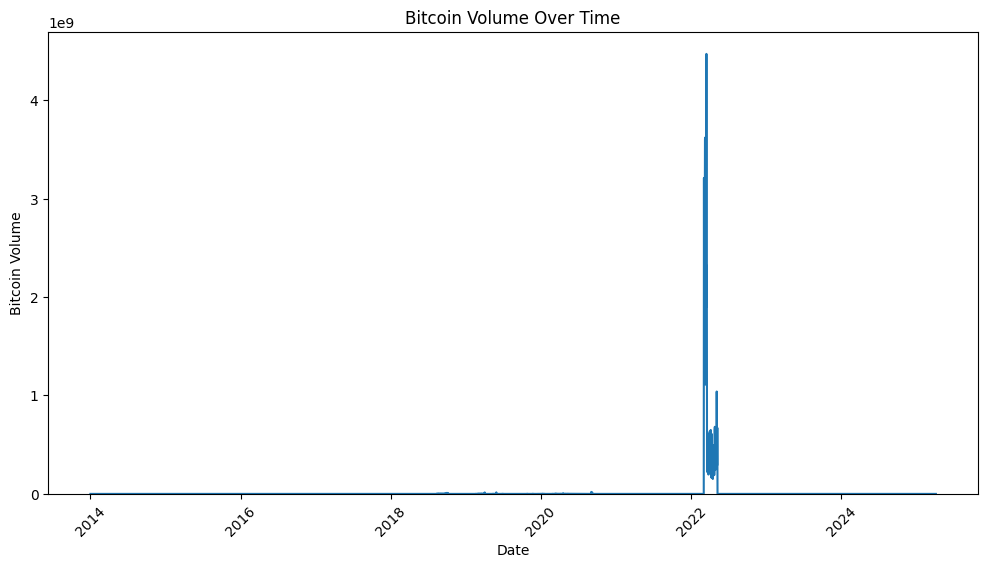

In [ ]:
# Plot Bitcoin Volume over date
plt.figure(figsize=(12, 6))
plt.plot(btc_data['Date'], btc_data['Volume'])
plt.xlabel('Date')
plt.ylabel('Bitcoin Volume')
plt.ylim(bottom=-2)  # Set the lower limit to 0
plt.title('Bitcoin Volume Over Time')
plt.xticks(rotation=45)
plt.show()

In [ ]:
btc_data['Volume'].describe()

,Volume
count,4113.0000
mean,14862610.4592
std,170659881.1592
min,0.2600
25%,46.5600
50%,91.5400
75%,248.4400
max,4470000000.0000


Since we can observe the spikes happened from 2018 to mid-2022, we try to fit the model avoiding the spikes here.

In [ ]:
# Print the min and max date with volume greater than 0.5e9
print("Min date with volume > 0.5e9:", btc_data[btc_data['Volume'] > 0.5e9]['Date'].min())
print("Max date with volume > 0.5e9:", btc_data[btc_data['Volume'] > 0.5e9]['Date'].max())


Min date with volume > 0.5e9: 2022-03-04 00:00:00
Max date with volume > 0.5e9: 2022-05-08 00:00:00


In [ ]:
# Drop the rows with date before 2022-05-09
btc_data = btc_data[btc_data['Date'] >= '2022-05-09']

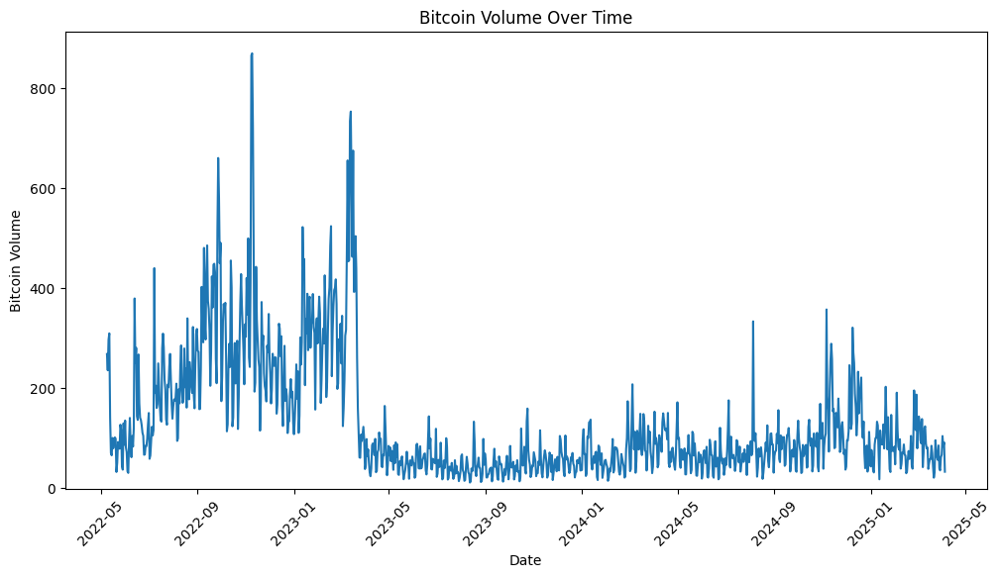

In [ ]:
# Plot Bitcoin Volume over date
plt.figure(figsize=(12, 6))
plt.plot(btc_data['Date'], btc_data['Volume'])
plt.xlabel('Date')
plt.ylabel('Bitcoin Volume')
plt.ylim(bottom=-2)  # Set the lower limit to 0
plt.title('Bitcoin Volume Over Time')
plt.xticks(rotation=45)
plt.show()

## **Re-scale and Transformation**

**Yeo-Johnson Transformation** for Price, Change, Pct_Change

In [ ]:
# For Price, Change, 7D_Pct_Change, 2D_Pct_Change (use yeo-johnson)
from sklearn.preprocessing import PowerTransformer
import pandas as pd

# Initialize PowerTransformer for each column
power_transformer_price = PowerTransformer(method='yeo-johnson', standardize=False)  # Disable standardization
power_transformer_change = PowerTransformer(method='yeo-johnson', standardize=False)
power_transformer_7d_pct_change = PowerTransformer(method='yeo-johnson', standardize=False)
power_transformer_2d_pct_change = PowerTransformer(method='yeo-johnson', standardize=False)

# Apply the Yeo-Johnson transformation to each column
btc_data['YeoJohnson_Price'] = power_transformer_price.fit_transform(btc_data[['Price']])
btc_data['YeoJohnson_Change'] = power_transformer_change.fit_transform(btc_data[['Change']])
btc_data['YeoJohnson_7D_Pct_Change'] = power_transformer_7d_pct_change.fit_transform(btc_data[['Pct_Change_7D']])
btc_data['YeoJohnson_2D_Pct_Change'] = power_transformer_2d_pct_change.fit_transform(btc_data[['Pct_Change_2D']])

# Store lambda values for each column
lambdas = {
    'Price_lambda': power_transformer_price.lambdas_[0],
    'Change_lambda': power_transformer_change.lambdas_[0],
    'Pct_Change_lambda_7D': power_transformer_7d_pct_change.lambdas_[0],
    'Pct_Change_lambda_2D': power_transformer_2d_pct_change.lambdas_[0]
}

# Calculate mean and standard deviation for each transformed column
transformed_means = {
    'Price_mean': btc_data['YeoJohnson_Price'].mean(),
    'Change_mean': btc_data['YeoJohnson_Change'].mean(),
    'Pct_Change_mean_7D': btc_data['YeoJohnson_7D_Pct_Change'].mean(),
    'Pct_Change_mean_2D': btc_data['YeoJohnson_2D_Pct_Change'].mean()
}

transformed_stds = {
    'Price_std': btc_data['YeoJohnson_Price'].std(),
    'Change_std': btc_data['YeoJohnson_Change'].std(),
    'Pct_Change_std_7D': btc_data['YeoJohnson_7D_Pct_Change'].std(),
    'Pct_Change_std_2D': btc_data['YeoJohnson_2D_Pct_Change'].std()
}

# Print the collected lambdas, means, and standard deviations
print(f"Lambdas: {lambdas}")
print(f"Means: {transformed_means}")
print(f"Standard Deviations: {transformed_stds}")

### Step 2: Back-Transformation ###
# Recreate PowerTransformers with stored lambdas for back-transformation
power_transformer_price.lambdas_ = [lambdas['Price_lambda']]
power_transformer_change.lambdas_ = [lambdas['Change_lambda']]
power_transformer_7d_pct_change.lambdas_ = [lambdas['Pct_Change_lambda_7D']]
power_transformer_2d_pct_change.lambdas_ = [lambdas['Pct_Change_lambda_2D']]

Lambdas: {'Price_lambda': -0.25856407543626825, 'Change_lambda': 0.9883632386260071, 'Pct_Change_lambda_7D': 0.9694157613313893, 'Pct_Change_lambda_2D': 0.9889327709948691}
Means: {'Price_mean': 3.613538576299676, 'Change_mean': 0.10246122324828746, 'Pct_Change_mean_7D': 0.707173658338029, 'Pct_Change_mean_2D': 0.23068683594838912}
Standard Deviations: {'Price_std': 0.03614464554551531, 'Change_std': 2.7643084416385797, 'Pct_Change_std_7D': 7.266554726919817, 'Pct_Change_std_2D': 3.806592926445063}


In [ ]:
binary_variables = [
    "MACD_buy",  # 1 if MACD crosses above MACD_Signal, otherwise 0
    "MACD_sell",  # 1 if MACD crosses below MACD_Signal, otherwise 0
    "MACD_above_signal",  # 1 if MACD > MACD_Signal, otherwise 0
    "MACD_below_signal",  # 1 if MACD <= MACD_Signal, otherwise 0
    "BB_Buy",  # 1 if Price crosses below the Lower Bollinger Band, otherwise 0
    "BB_Sell",  # 1 if Price crosses above the Upper Bollinger Band, otherwise 0
    "Price_below_BB_lower",  # 1 if Price < BB_lower, otherwise 0
    "Price_above_BB_upper",  # 1 if Price > BB_upper, otherwise 0
    "VWAP_Buy",  # 1 if Price crosses above VWAP, otherwise 0
    "VWAP_Sell",  # 1 if Price crosses below VWAP, otherwise 0
    "RSI_12_Oversold",  # 1 if RSI_12 < 30, otherwise 0
    "RSI_12_Overbought",  # 1 if RSI_12 > 70, otherwise 0
    "RSI_Divergence",  # 1 if RSI_6 > RSI_12, otherwise 0
    "Positive_7D",  # 1 if Pct_Change_7D > 0, otherwise 0
    "Positive_2D",  # 1 if Pct_Change_2D > 0, otherwise 0
    "Higher_Low",  # 1 if current low > previous low, otherwise 0
    "Breakout",  # 1 if Price > Resistance_Level, otherwise 0
    "Ascending_Triangle_Breakout",  # Same as Breakout
    "Breakout_With_Volume",  # 1 if breakout with volume confirmation, otherwise 0
    "Ascending_Triangle_Breakout_With_Volume",  # Same as Breakout_With_Volume
    "ADX_Buy_Signal",  # 1 if ADX > 25 and Positive_DI > Negative_DI, otherwise 0
    "ADX_Sell_Signal",  # 1 if ADX > 25 and Negative_DI > Positive_DI, otherwise 0
    "Stochastic_Buy_Signal",  # 1 if Stochastic %K < 20 and %K > %D, otherwise 0
    "Stochastic_Sell_Signal",  # 1 if Stochastic %K > 80 and %K < %D, otherwise 0
    "Bullish_Engulfing",  # 1 if Bullish Engulfing pattern is detected, otherwise 0
    "Bearish_Engulfing",  # 1 if Bearish Engulfing pattern is detected, otherwise 0
    "Hammer",  # 1 if Hammer candlestick pattern is detected, otherwise 0
    "Three_White_Soldiers",  # 1 if Three White Soldiers pattern is detected, otherwise 0
    "Three_Black_Crows", # 1 if Three Black Crows pattern is detected, otherwise 0
    'Extreme_Fear', 'Extreme_Greed'
]

In [ ]:
continuous_variables = [
    'Price', 'Open', 'High', 'Low', 'Change',
    "RSI_6",  # Relative Strength Index with a 6-period length
    "RSI_12",  # Relative Strength Index with a 12-period length
    "EMA_14",  # Exponential Moving Average with a 14-period length
    "SMA_14",  # Simple Moving Average with a 14-period length
    "OBV",  # On-Balance Volume
    "MACD",  # Moving Average Convergence Divergence
    "MACD_Signal",  # Signal line of MACD
    "MACD_cum_buy",  # Cumulative count of consecutive days where MACD_above_signal is 1
    "MACD_cum_sell",  # Cumulative count of consecutive days where MACD_below_signal is 1
    "BB_upper",  # Upper Bollinger Band
    "BB_lower",  # Lower Bollinger Band
    "BB_cum_Buy",  # Cumulative count of consecutive days where Price_below_BB_lower is 1
    "BB_cum_Sell",  # Cumulative count of consecutive days where Price_above_BB_upper is 1
    "ATR",  # Average True Range
    "ATR_Ratio",  # ATR as a percentage of Price
    "Stop_Loss_Long",  # Stop-loss level for long trades
    "Stop_Loss_Short",  # Stop-loss level for short trades
    "VWAP",  # Volume Weighted Average Price
    "Support",  # Lowest low in the past 20 days
    "Resistance",  # Highest high in the past 20 days
    "Consecutive_RSI_12_Overbought",  # Cumulative count of consecutive days where RSI_12_Overbought is 1
    "Consecutive_RSI_12_Oversold",  # Cumulative count of consecutive days where RSI_12_Oversold is 1
    "Pct_Change_7D",  # Percentage price change over the next 7 days
    "Pct_Change_2D",  # Percentage price change over the next 2 days
    "MA50",  # 50-day moving average
    "MA200",  # 200-day moving average
    "Price_vs_MA50",  # Price relative to 50-day MA (%)
    "Price_vs_MA200",  # Price relative to 200-day MA (%)
    "MA_Distance_Ratio",  # Ratio of MA50 to MA200 distance
    "Avg_Volume_20",  # 20-day average volume
    "Volume_Ratio",  # Current volume / 20-day avg volume
    "OBV_Slope",  # 5-day slope of OBV
    "Resistance_Level",  # Exponential moving average of high price
    "Avg_Volume",  # 7-day rolling average of volume
    "Triangle_Completion",  # Rolling mean of Higher_Low
    "Triangle_Height",  # Height of the triangle as % of price
    "Triangle_Duration",  # Sum of Higher_Low over 7 days
    "Breakout_Strength",  # Volume-adjusted breakout strength
    "ADX",  # Average Directional Index
    "Positive_DI",  # Positive Directional Index
    "Negative_DI",  # Negative Directional Index
    "Consecutive_ADX_Buy",  # Consecutive days of ADX_Buy_Signal
    "Consecutive_ADX_Sell",  # Consecutive days of ADX_Sell_Signal
    "ADX_Strength",  # How far ADX is above the threshold
    "ADX_Trend_Duration",  # Consecutive days where ADX > 25
    "ADX_Trend_Direction",  # Difference between Positive_DI and Negative_DI
    "Stochastic_perK",  # %K line of the Stochastic Oscillator
    "Stochastic_perD",  # %D line of the Stochastic Oscillator
    "Consecutive_Stochastic_Buy",  # Consecutive days of Stochastic_Buy_Signal
    "Consecutive_Stochastic_Sell",  # Consecutive days of Stochastic_Sell_Signal
    "Consecutive_Hammer",  # Consecutive hammer patterns
    "SPY_Price",  # Price of SPY (S&P 500 ETF)
    "SPY_Volume",  # Trading volume of SPY
    "ETH_Price",  # Price of Ethereum (ETH)
    "ETH_Volume",  # Trading volume of Ethereum (ETH)
    "Gold_Price",  # Price of gold
    "Gold_Volume",  # Trading volume of gold
    "US_10Y",  # Yield of the US 10-year Treasury bond
    "Yield_Spread",  # Spread between different bond yields
    "YeoJohnson_Price",  # Yeo-Johnson transformed Price
    "YeoJohnson_Change",  # Yeo-Johnson transformed Change
    "YeoJohnson_7D_Pct_Change",  # Yeo-Johnson transformed Pct_Change_7D
    "YeoJohnson_2D_Pct_Change", # Yeo-Johnson transformed Pct_Change_2D
    'Fear_and_Greed_Index', 'Consecutive_Extreme_Fear', 'Consecutive_Extreme_Greed'
]

In [ ]:
# Set binary variables to int64
btc_data[binary_variables] = btc_data[binary_variables].astype("int64")

# Set continuous variables to float64
btc_data[continuous_variables] = btc_data[continuous_variables].astype("float64")

# Verify the data types
for column in btc_data.columns:
    print(f"{column}: {btc_data[column].dtype}")

Date: datetime64[ns]
Price: float64
Open: float64
High: float64
Low: float64
Change: float64
Volume: float64
Day_of_Week: int32
Week_of_Year: UInt32
Month: int32
Quarter: int32
Year: int32
RSI_6: float64
RSI_12: float64
EMA_14: float64
SMA_14: float64
OBV: float64
MACD: float64
MACD_Signal: float64
MACD_buy: int64
MACD_sell: int64
MACD_above_signal: int64
MACD_below_signal: int64
MACD_cum_buy: float64
MACD_cum_sell: float64
BB_upper: float64
BB_lower: float64
BB_Buy: int64
BB_Sell: int64
Price_below_BB_lower: int64
Price_above_BB_upper: int64
BB_cum_Buy: float64
BB_cum_Sell: float64
ATR: float64
Stop_Loss_Long: float64
Stop_Loss_Short: float64
VWAP: float64
VWAP_Buy: int64
VWAP_Sell: int64
Fear_and_Greed_Index: float64
Support: float64
Resistance: float64
Extreme_Fear: int64
Extreme_Greed: int64
RSI_12_Oversold: int64
Consecutive_RSI_12_Oversold: float64
RSI_12_Overbought: int64
RSI_Divergence: int64
Consecutive_Extreme_Fear: float64
Consecutive_Extreme_Greed: float64
Consecutive_RSI_1

In [ ]:
numerical_variable = btc_data.select_dtypes(include=['number'])
btc_data.columns

Index(['Date', 'Price', 'Open', 'High', 'Low', 'Change', 'Volume',
       'Day_of_Week', 'Week_of_Year', 'Month',
       ...
       'US_10Y', 'Yield_Spread', 'SPY_Price', 'SPY_Volume', 'ETH_Price',
       'ETH_Volume', 'YeoJohnson_Price', 'YeoJohnson_Change',
       'YeoJohnson_7D_Pct_Change', 'YeoJohnson_2D_Pct_Change'],
      dtype='object', length=113)

**Standardize all numeric variable**

store to scaled_btc_data

In [ ]:
# Define count columns
count_columns = [ 'MACD_Signal', 'MACD_buy', 'MACD_sell', 'MACD_above_signal', 'MACD_cum_buy', 'MACD_cum_sell', 'MACD_below_signal', 'BB_Buy', 'BB_Sell', 'Price_below_BB_lower', 'Price_above_BB_upper',
                 'BB_cum_Buy', 'BB_cum_Sell', 'VWAP_Buy', 'VWAP_Sell', 'Price_above_VWAP', 'Price_below_VWAP', 'VWAP_cum_Buy', 'VWAP_cum_Sell', 'RSI12_Oversold' ,'Consecutive_RSI_12_Oversold',
                 'RSI_12_Overbought', 'RSI_Divergence', 'Consecutive_RSI_12_Overbought', 'Ascending_Triangle_Breakout', 'Ascending_Triangle_Breakout_With_Volume', 'ADX_Buy_Signal', 'ADX_Sell_Signal', 'Consecutive_ADX_Buy',
                 'Consecutive_ADX_Sell', 'Stochastic_Buy_Signal', 'Stochastic_Sell_Signal', 'Consecutive_Stochastic_Buy', 'Consecutive_Stochastic_Sell', 'Bullish_Engulfing', 'Bearish_Engulfing', 'Hammer', 'Consecutive_Hammer',
                 'Three_white_soldiers', 'Three_Black_Crows', 'Fear_and_Greed_Index', 'Extreme_Fear', 'Extreme_Greed', 'Consecutive_Extreme_Fear', 'Consecutive_Extreme_Greed'
                 ]

In [ ]:
#Standardize all numeric variable
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Initialize the MinMaxScaler and StandardScaler
min_max_scaler = MinMaxScaler()
standard_scaler = StandardScaler()

# Apply log transformation to 'Volume' to reduce the range
btc_data['Volume'] = np.log1p(btc_data['Volume'])  # log1p handles log(0) safely

# Apply Scaler
btc_data['Volume'] = min_max_scaler.fit_transform(btc_data[['Volume']])
btc_data['Volume'] = standard_scaler.fit_transform(btc_data[['Volume']])

# List of features for scaling
numeric_features = continuous_variables

# Fit and transform only the numeric features
scaled_features = standard_scaler.fit_transform(btc_data[numeric_features])

# Create a new DataFrame for scaled data
scaled_btc_data = btc_data.copy()  # Copy original DataFrame

# Replace numeric columns in the new DataFrame with scaled values
scaled_btc_data[numeric_features] = scaled_features

scaled_btc_data.tail()

,Date,Price,Open,High,Low,Change,Volume,Day_of_Week,Week_of_Year,Month,Quarter,Year,RSI_6,RSI_12,EMA_14,SMA_14,OBV,MACD,MACD_Signal,MACD_buy,MACD_sell,MACD_above_signal,MACD_below_signal,MACD_cum_buy,MACD_cum_sell,BB_upper,BB_lower,BB_Buy,BB_Sell,Price_below_BB_lower,Price_above_BB_upper,BB_cum_Buy,BB_cum_Sell,ATR,Stop_Loss_Long,Stop_Loss_Short,VWAP,VWAP_Buy,VWAP_Sell,Fear_and_Greed_Index,Support,Resistance,Extreme_Fear,Extreme_Greed,RSI_12_Oversold,Consecutive_RSI_12_Oversold,RSI_12_Overbought,RSI_Divergence,Consecutive_Extreme_Fear,Consecutive_Extreme_Greed,Consecutive_RSI_12_Overbought,ATR_Ratio,MA50,MA200,Price_vs_MA50,Price_vs_MA200,MA_Distance_Ratio,Avg_Volume_20,Volume_Ratio,OBV_Slope,Pct_Change_7D,Pct_Change_2D,Positive_7D,Positive_2D,Resistance_Level,Low_Shifted,Higher_Low,Breakout,Ascending_Triangle_Breakout,Avg_Volume,Breakout_With_Volume,Ascending_Triangle_Breakout_With_Volume,Triangle_Completion,Triangle_Height,Triangle_Duration,Breakout_Strength,ADX,Positive_DI,Negative_DI,ADX_Buy_Signal,ADX_Sell_Signal,Consecutive_ADX_Buy,Consecutive_ADX_Sell,ADX_Strength,ADX_Trend_Duration,ADX_Trend_Direction,Stochastic_perK,Stochastic_perD,Stochastic_Buy_Signal,Stochastic_Sell_Signal,Consecutive_Stochastic_Buy,Consecutive_Stochastic_Sell,Bullish_Engulfing,Bearish_Engulfing,Hammer,Consecutive_Hammer,Body,Upper_Shadow,Lower_Shadow,Three_White_Soldiers,Three_Black_Crows,Gold_Price,Gold_Volume,US_10Y,Yield_Spread,SPY_Price,SPY_Volume,ETH_Price,ETH_Volume,YeoJohnson_Price,YeoJohnson_Change,YeoJohnson_7D_Pct_Change,YeoJohnson_2D_Pct_Change
4108,2025-04-01,1.5308,1.4326,1.4827,1.4951,1.1022,-0.3546,1,14,4,2,2025,0.1378,-0.1890,1.5391,1.5550,0.3414,-0.7926,-0.9221,0,0,1,0,1.4675,-0.6499,1.4279,1.6659,0,0,0,0,-0.1738,-0.2330,1.2461,1.5454,1.5166,1.5032,1,0,-0.7820,1.6968,1.4280,0,0,0,-0.1697,0,1,-0.2146,-0.1475,-0.2824,-0.0603,1.7627,2.3210,-0.4651,-0.3735,0.0854,-0.1210,0.2391,0.0485,NaN,-0.6870,0,0,1.4924,81300.1000,1,0,0,-0.0663,1,1,-2.2623,-0.4144,-2.2623,0.0722,-0.6162,-0.5419,0.0990,0,0,-0.4831,-0.4000,-0.7047,-0.7475,-0.3543,-0.0710,-0.9429,0,0,-0.2031,-0.2633,0,0,0,-0.1658,2615.6000,342.0000,112.8000,0,0,NaN,NaN,0.4292,1.6695,1.2220,-0.7373,-0.4147,0.1628,1.3440,1.0986,NaN,-0.6843
4109,2025-04-02,1.4285,1.5341,1.5918,1.4920,-1.1656,0.1752,2,14,4,2,2025,-0.6881,-0.6511,1.5282,1.5429,0.2608,-0.8472,-0.9151,0,0,1,0,1.5859,-0.6499,1.4227,1.6779,0,0,0,0,-0.1738,-0.2330,1.4224,1.4171,1.4366,1.5052,0,1,-0.2967,1.7350,1.4280,0,0,0,-0.1697,0,0,-0.2146,-0.1475,-0.2824,0.2369,1.7521,2.3267,-0.6882,-0.4890,0.0689,-0.1210,1.3860,0.0485,NaN,0.3578,0,1,1.5206,82435.8000,0,0,0,-0.0663,1,1,-2.2623,0.0040,-2.2623,0.0722,-0.7034,-0.1241,-0.2399,0,0,-0.4831,-0.4000,-0.7047,-0.7475,0.0472,-1.3049,-0.9354,0,0,-0.2031,-0.2633,0,1,0,-0.1658,-2641.0000,3211.3000,166.1000,0,0,NaN,NaN,0.4886,1.6420,1.2667,0.0477,-0.5562,0.8199,1.2975,-1.1704,NaN,0.3640
4110,2025-04-03,1.4531,1.4316,1.4220,1.4506,0.2341,-0.0925,3,14,4,2,2025,-0.4465,-0.5177,1.5221,1.5400,0.3252,-0.8509,-0.9102,0,0,1,0,1.7043,-0.6499,1.4229,1.6743,0,0,0,0,-0.1738,-0.2330,1.3725,1.4487,1.4552,1.4421,1,0,-1.2189,1.7496,1.4280,0,0,0,-0.1697,0,0,-0.2146,-0.1475,-0.2824,0.1554,1.7402,2.3327,-0.6027,-0.4671,0.0463,-0.1210,0.7149,0.0485,NaN,0.0549,0,1,1.4990,82358.9000,0,0,0,-0.0663,0,0,-2.2623,0.0905,-2.2623,0.0722,-0.8200,-0.2541,-0.0871,0,0,-0.4831,-0.4000,-0.7047,-0.7475,-0.1009,-1.0083,-0.8510,0,0,-0.2031,-0.2633,0,0,0,-0.1658,636.8000,749.5000,1208.8000,0,0,NaN,NaN,0.2114,1.8071,0.9164,1.8801,-0.5303,0.3526,1.3088,0.2406,NaN,0.0632
4111,2025-04-04,1.4805,1.4563,1.4522,1.4656,0.2631,0.0222,4,14,4,2,2025,-0.1749,-0.3672,1.5205,1.5394,0.3962,-0.8110,-0.8979,0,0,1,0,1.8227,-0.6499,1.4224,1.6728,0,0,0,0,-0.1738,-0.2330,1.3523,1.4805,1.4789,1.4664,0,0,-1.0733,1.7496,1.4280,0,0,0,-0.1697,0,1,-0.2146,-0.1475,-0.2824,0.1053,1.7299,2.3391,-0.5133,-0.4424,0.0255,-0.1210,0.8604,0.0485,NaN,NaN,0,0,1.4904,81313.8000,1,0,0,-0.0663,0,0,-1.5115,-0.0058,-1.5115,0.0722,-0.9026,-0.2101,-0.2488,0,0,-0.4831,-0.4

In [ ]:
#numeric_features = [
  #'Price', 'Open', 'High', 'Low', 'Change', 'RSI_6', 'RSI_12', 'EMA_14',
  #'SMA_14', 'OBV', 'MACD', 'MACD_Signal','MACD_above_signal', 'MACD_below_signal','MACD_cum_buy', 'MACD_cum_sell',
  #'BB_lower', 'BB_upper','Price_below_BB_lower', 'Price_above_BB_upper', 'BB_cum_Buy', 'BB_cum_Sell',
  #'ATR', 'Stop_Loss_Long', 'Stop_Loss_Short', 'VWAP','Support', 'Resistance', 'YeoJohnson_Price',
  #'YeoJohnson_Change','YeoJohnson_7D_Pct_Change', 'YeoJohnson_2D_Pct_Change', 'Gold_Price', 'Gold_Volume',
  #'US_10Y', 'Yield_Spread','Triangle_Completion', 'Triangle_Height', 'Breakout_Strength',
  #'ADX_Strength', 'ATR_Ratio', 'Price_vs_MA50', 'Price_vs_MA200', 'MA_Distance_Ratio', 'OBV_Slope',
  #'Stochastic_perK', 'Stochastic_perD', 'SPY_Price', 'SPY_Volume', 'ETH_Price', 'ETH_Volume',
  #'Fear_and_Greed_Index', 'Extreme_Fear', 'Extreme_Greed', 'Consecutive_Extreme_Fear', 'Consecutive_Extreme_Greed']

In [ ]:
scaled_btc_data.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,1063,2023-10-22 00:00:00,2022-05-09 00:00:00,2023-01-29 12:00:00,2023-10-22 00:00:00,2024-07-13 12:00:00,2025-04-05 00:00:00,NaN
Price,1063.0000,0.0000,-1.1578,-0.8278,-0.5371,0.7501,2.3442,1.0005
Open,1063.0000,0.0000,-1.1570,-0.8267,-0.5359,0.7505,2.3482,1.0005
High,1063.0000,0.0000,-1.1489,-0.8197,-0.4665,0.7575,2.3844,1.0005
Low,1063.0000,-0.0000,-1.1580,-0.8316,-0.5573,0.7402,2.4034,1.0005
...,...,...,...,...,...,...,...,...
ETH_Volume,1063.0000,-0.0000,-1.2890,-0.6300,-0.2484,0.2922,9.1043,1.0005
YeoJohnson_Price,1063.0000,-0.0000,-1.7630,-0.8344,-0.3058,0.9329,1.6589,1.0005
YeoJohnson_Change,1063.0000,0.0000,-5.8267,-0.4463,-0.0479,0.4613,4.1961,1.0005
YeoJohnson_7D_Pct_Change,1056.0000,0.0000,-5.0470,-0.5034,-0.0510,0.4716,4.4531,1.0005


# **Please use scaled_btc_data for analysis**

In [ ]:
scaled_btc_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1063 entries, 3050 to 4112
Columns: 113 entries, Date to YeoJohnson_2D_Pct_Change
dtypes: UInt32(1), datetime64[ns](1), float64(76), int32(4), int64(31)
memory usage: 927.0 KB


**Drop NA before Analysis**

In [ ]:
# Drop rows with NaN values in scaled_btc_data
scaled_btc_data = scaled_btc_data.dropna()

# Optionally, reset the index after dropping rows
scaled_btc_data = scaled_btc_data.reset_index(drop=True)

In [ ]:
scaled_btc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1002 entries, 0 to 1001
Columns: 113 entries, Date to YeoJohnson_2D_Pct_Change
dtypes: UInt32(1), datetime64[ns](1), float64(76), int32(4), int64(31)
memory usage: 866.1 KB


In [ ]:
#Check data are consecutive
# Ensure 'Date' is sorted
scaled_btc_data = scaled_btc_data.sort_values('Date')

# Calculate the difference between consecutive dates
scaled_btc_data['Date_Diff'] = scaled_btc_data['Date'].diff().dt.days

# Check if all differences are 1 day
if (scaled_btc_data['Date_Diff'].iloc[1:] == 1).all():
    print("All dates are consecutive.")
else:
    print("There are missing dates.")
    print(scaled_btc_data[scaled_btc_data['Date_Diff'] > 1])  # Display rows with missing dates

# Drop the 'Date_Diff' column after the check
scaled_btc_data.drop(columns=['Date_Diff'], inplace=True)

All dates are consecutive.


In [ ]:
# Check the start and end dates
start_date = scaled_btc_data['Date'].min()
end_date = scaled_btc_data['Date'].max()

print(f"Data starts from: {start_date}")
print(f"Data ends at: {end_date}")

Data starts from: 2022-05-09 00:00:00
Data ends at: 2025-02-03 00:00:00


#Exploratory Data Analysis

In [ ]:
#Print the name of the columns
print(scaled_btc_data.columns)

Index(['Date', 'Price', 'Open', 'High', 'Low', 'Change', 'Volume',
       'Day_of_Week', 'Week_of_Year', 'Month',
       ...
       'US_10Y', 'Yield_Spread', 'SPY_Price', 'SPY_Volume', 'ETH_Price',
       'ETH_Volume', 'YeoJohnson_Price', 'YeoJohnson_Change',
       'YeoJohnson_7D_Pct_Change', 'YeoJohnson_2D_Pct_Change'],
      dtype='object', length=113)


In [ ]:
# Moving date to index
scaled_btc_data.set_index('Date', inplace=True)

target = 'YeoJohnson_7D_Pct_Change'
# target_binary = 'Positive_2D'
target_binary = 'Positive_7D'

exclude_list = ['Price', 'Open', 'High', 'Low', 'Change', 'Day_of_Week', 'Week_of_Year', 'Month','Quarter','Year',
                'VWAP', 'VWAP_Buy', 'VWAP_Sell', 'Resistance_Level', 'Low_Shifted', 'Higher_Low',
                'Breakout', 'Ascending_Triangle_Breakout', 'Avg_Volume', 'Breakout_With_Volume', 'Avg_Volume_20','Pct_Change_7D', 'Pct_Change_2D','Positive_2D','YeoJohnson_Price','YeoJohnson_Change','YeoJohnson_2D_Pct_Change']
# Select binary columns
binary_variables = scaled_btc_data.drop(columns=exclude_list+[target,target_binary]).select_dtypes(include=['int64']).columns.tolist()

# Identify 2-dimensional columns
for column in binary_variables:
    if len(scaled_btc_data[column].shape) != 1:  # Check if the column is not 1D
        print(f"Column '{column}' is 2-dimensional with shape {scaled_btc_data[column].shape}")

# Filter out 2D columns and remove target from predictors
binary_variables = [col for col in binary_variables if len(scaled_btc_data[col].shape) == 1 and col != target]


# Define predictors, all columns except the 7D_Pct_Change or YeoJohnson_7D_Pct_Change or 2D_Pct_Change or YeoJohnson_2D_Pct_Change
predictors = scaled_btc_data.drop(columns=[target, target_binary] + exclude_list + binary_variables, axis=1).columns.tolist()

# Display the first few rows of the DataFrame
scaled_btc_data.head()

,Price,Open,High,Low,Change,Volume,Day_of_Week,Week_of_Year,Month,Quarter,Year,RSI_6,RSI_12,EMA_14,SMA_14,OBV,MACD,MACD_Signal,MACD_buy,MACD_sell,MACD_above_signal,MACD_below_signal,MACD_cum_buy,MACD_cum_sell,BB_upper,BB_lower,BB_Buy,BB_Sell,Price_below_BB_lower,Price_above_BB_upper,BB_cum_Buy,BB_cum_Sell,ATR,Stop_Loss_Long,Stop_Loss_Short,VWAP,VWAP_Buy,VWAP_Sell,Fear_and_Greed_Index,Support,Resistance,Extreme_Fear,Extreme_Greed,RSI_12_Oversold,Consecutive_RSI_12_Oversold,RSI_12_Overbought,RSI_Divergence,Consecutive_Extreme_Fear,Consecutive_Extreme_Greed,Consecutive_RSI_12_Overbought,ATR_Ratio,MA50,MA200,Price_vs_MA50,Price_vs_MA200,MA_Distance_Ratio,Avg_Volume_20,Volume_Ratio,OBV_Slope,Pct_Change_7D,Pct_Change_2D,Positive_7D,Positive_2D,Resistance_Level,Low_Shifted,Higher_Low,Breakout,Ascending_Triangle_Breakout,Avg_Volume,Breakout_With_Volume,Ascending_Triangle_Breakout_With_Volume,Triangle_Completion,Triangle_Height,Triangle_Duration,Breakout_Strength,ADX,Positive_DI,Negative_DI,ADX_Buy_Signal,ADX_Sell_Signal,Consecutive_ADX_Buy,Consecutive_ADX_Sell,ADX_Strength,ADX_Trend_Duration,ADX_Trend_Direction,Stochastic_perK,Stochastic_perD,Stochastic_Buy_Signal,Stochastic_Sell_Signal,Consecutive_Stochastic_Buy,Consecutive_Stochastic_Sell,Bullish_Engulfing,Bearish_Engulfing,Hammer,Consecutive_Hammer,Body,Upper_Shadow,Lower_Shadow,Three_White_Soldiers,Three_Black_Crows,Gold_Price,Gold_Volume,US_10Y,Yield_Spread,SPY_Price,SPY_Volume,ETH_Price,ETH_Volume,YeoJohnson_Price,YeoJohnson_Change,YeoJohnson_7D_Pct_Change,YeoJohnson_2D_Pct_Change
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-05-09,-0.6030,-0.4487,-0.4665,-0.5796,-4.2545,1.3104,0,19,5,2,2022,-2.0564,-2.0838,-0.3461,-0.3220,3.2337,-1.4288,-1.0703,0,0,0,1,-0.6636,-0.1125,-0.2178,-0.3559,0,0,1,0,7.7233,-0.2330,0.1165,-0.6674,-0.5476,-0.5491,0,0,-1.8984,-0.4675,-0.2318,1,0,1,0.7846,0,0,0.0249,-0.1475,-0.2824,2.0272,-0.1360,0.2646,-2.4021,-1.6013,-0.7667,11.6897,-1.9344,-27.1277,-0.2409,-0.9647,0,0,-0.3702,33727.0000,0,0,0,20.0647,0,0,-2.2623,1.7376,-2.2623,-14.8437,0.1850,-1.4023,2.2937,0,1,-0.4831,1.3130,-0.0351,0.0630,-1.9131,-1.8776,-1.8088,0,0,-0.2031,-0.2633,0,0,0,-0.1658,-3946.0000,186.0000,0.0000,0,0,-0.7365,0.1025,-1.7886,2.0549,-1.0428,2.9655,0.0317,3.7185,-0.4107,-4.3369,-0.2110,-0.9665
2022-05-10,-0.5676,-0.6016,-0.5275,-0.5901,1.0516,1.1552,1,19,5,2,2022,-1.5909,-1.7568,-0.3750,-0.3419,3.4163,-1.5928,-1.1899,0,0,0,1,-0.6636,-0.0051,-0.2144,-0.4037,0,0,1,0,9.3027,-0.2330,0.1721,-0.6343,-0.5104,-0.5615,0,0,-1.9469,-0.4790,-0.2318,1,0,1,1.7388,0,0,0.1446,-0.1475,-0.2824,2.0433,-0.1441,0.2569,-2.1896,-1.5219,-0.7525,11.2075,-1.9344,-16.0070,-0.3803,-1.7890,0,0,-0.4090,30095.0000,0,0,0,18.1252,0,0,-2.2623,2.2923,-2.2623,-13.7300,0.3574,-1.5102,1.9204,0,1,-0.4831,1.4448,0.1758,0.1253,-1.7914,-1.4898,-1.8142,1,0,2.7148,-0.2633,0,0,0,-0.1658,909.3000,1613.7000,267.2000,0,0,-0.7865,0.0310,-1.9074,1.8622,-1.0317,2.1189,0.1511,3.4689,-0.3535,1.0487,-0.3552,-1.8081
2022-05-11,-0.6427,-0.5663,-0.5468,-0.6692,-2.3049,1.4332,2,19,5,2,2022,-1.8380,-1.9914,-0.4102,-0.3703,3.1862,-1.8019,-1.3293,0,0,0,1,-0.6636,0.1024,-0.2019,-0.4664,0,0,1,0,10.8821,-0.2330,0.3165,-0.7300,-0.5679,-0.6189,0,0,-1.8498,-0.5656,-0.3107,1,0,1,2.6931,0,0,0.2644,-0.1475,-0.2824,2.8514,-0.1549,0.2486,-2.5408,-1.6664,-0.8166,10.5865,-1.9344,-8.2685,-0.3099,0.1262,0,1,-0.4428,29831.0000,0,0,0,14.4729,0,0,-3.0130,3.1040,-3.0130,-15.5428,0.5525,-1.6472,2.1208,0,1,-0.4831,1.5765,0.4145,0.1877,-1.9667,-1.5359,-1.7509,1,0,5.6327,-0.2633,0,1,0,-0.1658,-1939.8000,1105.6000,1232.7000,0,0,-0.7423,-0.0298,-2.0658,1.5319,-1.1081,2.4806,0.1511,3.4689,-0.4778,-2.3336,-0.2822,0.1342
2022-05-12,-0.6463,-0.6413,-0.6220,-0.7221,-0.1601,1.4831,3,19,5,2,2022,-1.8490,-2.0020,-0.4412,-0.4004,2.9464,-1.9519,-1.4722,0,0,0,1,-0.6636,0.2099,-0.1953,-0.5196,0,0,1,0,12.4616,-0.2330,0.4106,-0.7430,-0.5635,-0.6629,1,0,-1.8498,-0.6236,-0.3115,1,0,1,3.6473,0,0,0.3841,-0.

In [ ]:
# Check the predictors
predictors

['Volume',
 'RSI_6',
 'RSI_12',
 'EMA_14',
 'SMA_14',
 'OBV',
 'MACD',
 'MACD_Signal',
 'MACD_cum_buy',
 'MACD_cum_sell',
 'BB_upper',
 'BB_lower',
 'BB_cum_Buy',
 'BB_cum_Sell',
 'ATR',
 'Stop_Loss_Long',
 'Stop_Loss_Short',
 'Fear_and_Greed_Index',
 'Support',
 'Resistance',
 'Consecutive_RSI_12_Oversold',
 'Consecutive_Extreme_Fear',
 'Consecutive_Extreme_Greed',
 'Consecutive_RSI_12_Overbought',
 'ATR_Ratio',
 'MA50',
 'MA200',
 'Price_vs_MA50',
 'Price_vs_MA200',
 'MA_Distance_Ratio',
 'Volume_Ratio',
 'OBV_Slope',
 'Triangle_Completion',
 'Triangle_Height',
 'Triangle_Duration',
 'Breakout_Strength',
 'ADX',
 'Positive_DI',
 'Negative_DI',
 'Consecutive_ADX_Buy',
 'Consecutive_ADX_Sell',
 'ADX_Strength',
 'ADX_Trend_Duration',
 'ADX_Trend_Direction',
 'Stochastic_perK',
 'Stochastic_perD',
 'Consecutive_Stochastic_Buy',
 'Consecutive_Stochastic_Sell',
 'Consecutive_Hammer',
 'Body',
 'Upper_Shadow',
 'Lower_Shadow',
 'Gold_Price',
 'Gold_Volume',
 'US_10Y',
 'Yield_Spread',
 'SPY

##Univariate Analysis

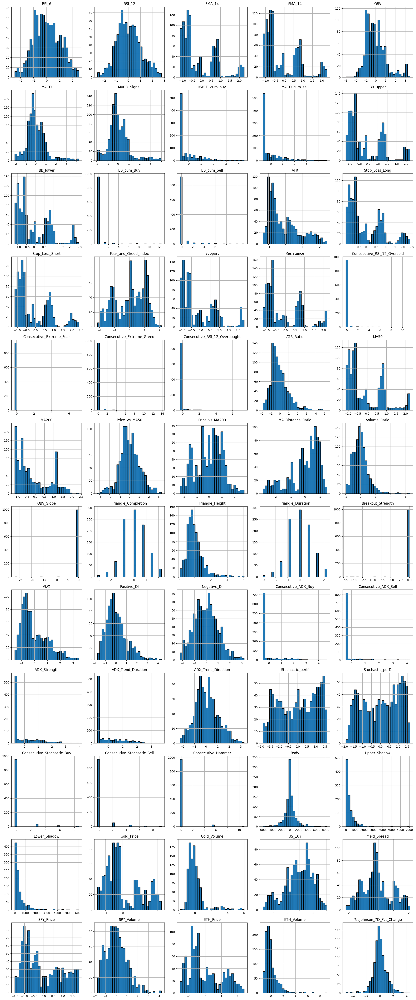

In [ ]:
import math

cols = predictors[1:] + [target]
ncols = 5
nrows = math.ceil(len(cols) / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 4 * nrows))
axes = axes.flatten()

for ax, col in zip(axes, cols):
    scaled_btc_data[col].hist(
        bins=30,
        ax=ax,
        edgecolor='black'
    )
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('')

# turn off any unused subplots
for ax in axes[len(cols):]:
    fig.delaxes(ax)

plt.tight_layout()
plt.show()

##Bivariate Analysis

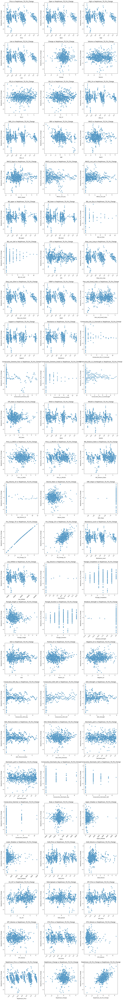

In [ ]:
# Select numeric columns
numeric_variables = scaled_btc_data.select_dtypes(include=['float64']).columns.tolist()

# Identify 2-dimensional columns
for column in numeric_variables:
    if len(scaled_btc_data[column].shape) != 1:  # Check if the column is not 1D
        print(f"Column '{column}' is 2-dimensional with shape {scaled_btc_data[column].shape}")

# Filter out 2D columns and remove target from predictors
numeric_variables = [col for col in numeric_variables if len(scaled_btc_data[col].shape) == 1 and col != target]

# Drop rows with missing values
data_numeric = scaled_btc_data[numeric_variables + [target]].dropna()

# Define number of rows and columns for the subplot grid
n_cols = 3
n_rows = (len(numeric_variables) + n_cols - 1) // n_cols  # Ceiling division

# Create figure with subplots
fig = plt.figure(figsize=(15, 5 * n_rows))

# Create scatter plots
for i, column in enumerate(numeric_variables, 1):
    ax = plt.subplot(n_rows, n_cols, i)
    sns.scatterplot(data=data_numeric, x=column, y=target, ax=ax)
    ax.set_title(f"{column} vs {target}")
    ax.set_xlabel(column)
    ax.set_ylabel(target)

    # Rotate x-axis labels if they're too long
    plt.xticks(rotation=45)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

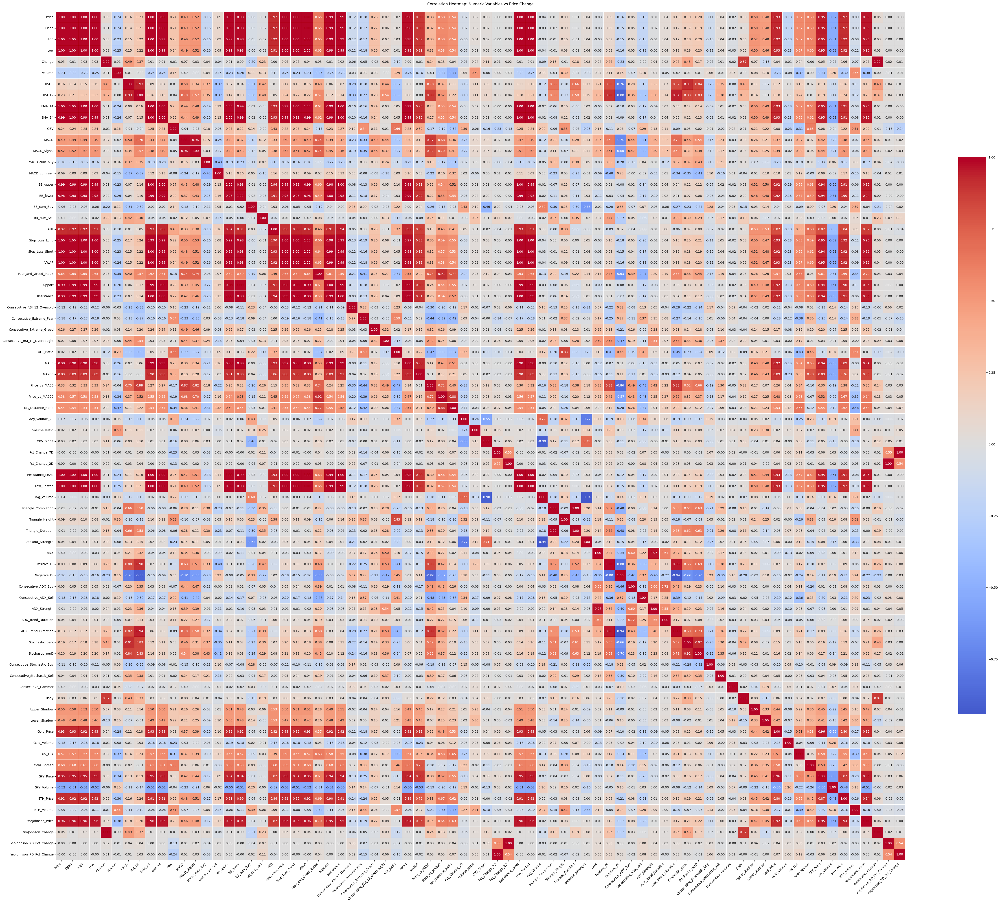

In [ ]:
# Create correlation matrix
correlation_matrix = data_numeric.corr()

plt.figure(figsize=(50, 50))

# Create heatmap with annotations
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            square=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap: Numeric Variables vs Price Change', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()

plt.show()

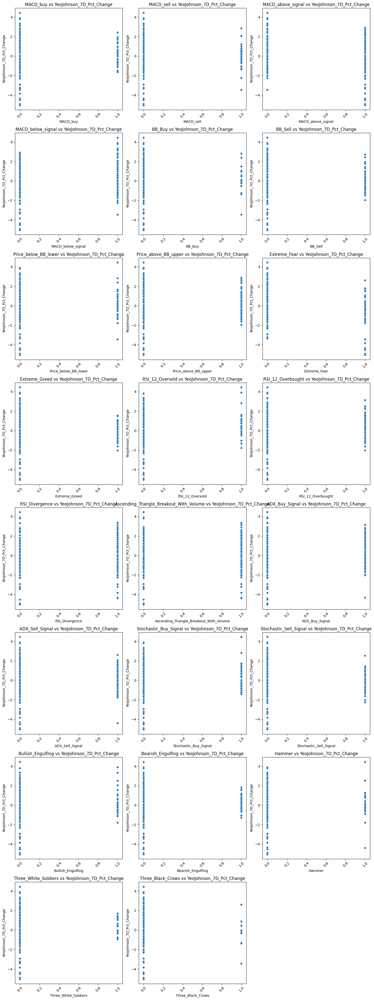

In [ ]:
# Drop rows with missing values
data_binary = scaled_btc_data[binary_variables + [target]].dropna()

# Define number of rows and columns for the subplot grid
n_cols = 3
n_rows = (len(binary_variables) + n_cols - 1) // n_cols  # Ceiling division

# Create figure with subplots
fig = plt.figure(figsize=(15, 5 * n_rows))

# Create scatter plots
for i, column in enumerate(binary_variables, 1):
    ax = plt.subplot(n_rows, n_cols, i)
    sns.scatterplot(data=data_binary, x=column, y=target, ax=ax)
    ax.set_title(f"{column} vs {target}")
    ax.set_xlabel(column)
    ax.set_ylabel(target)

    # Rotate x-axis labels if they're too long
    plt.xticks(rotation=45)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

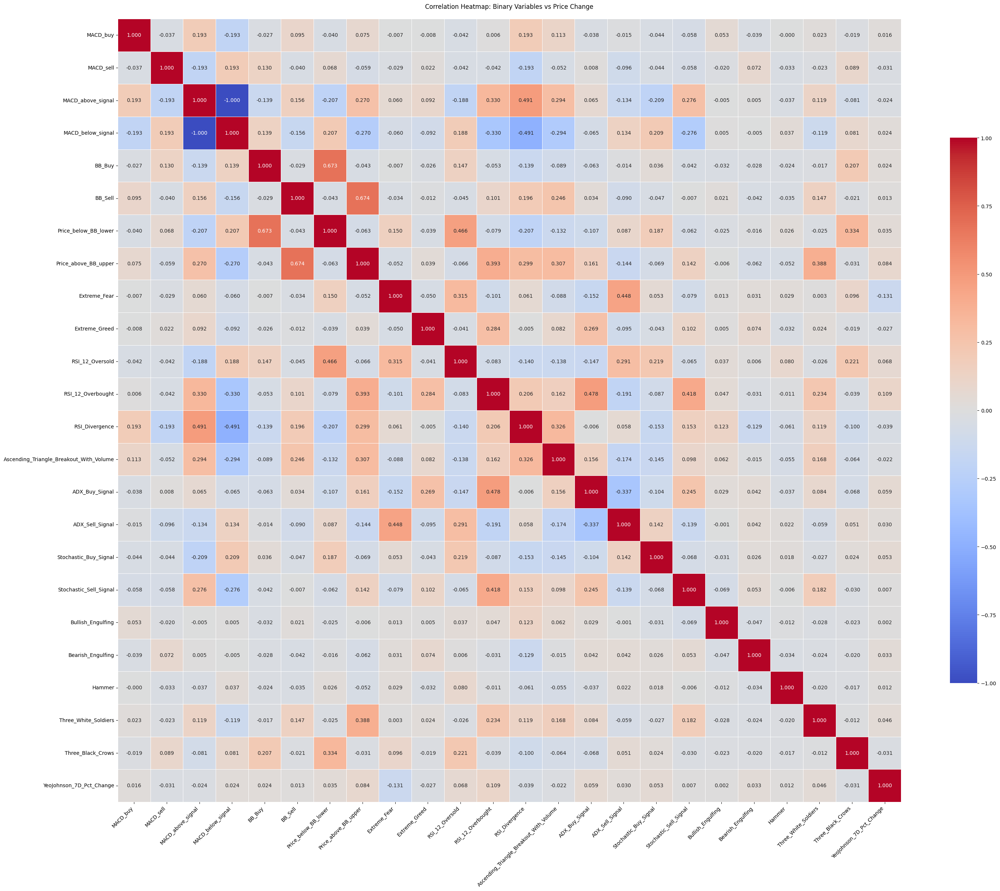

In [ ]:
# Create correlation matrix
correlation_matrix = data_binary.corr()

plt.figure(figsize=(30, 30))

# Create heatmap with annotations
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            square=True,
            fmt='.3f',
            linewidths=0.5,
            cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap: Binary Variables vs Price Change', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()

plt.show()

# Model Building

- Time-Based Splitting
- Selecting predictors
- Interaction terms

In [ ]:
from itertools import chain, combinations

def gen_combinations(input):
    return sum([list(map(list, combinations(input, i))) for i in range(1,len(input) + 1)], [])

def gen_interactions(X,de,pname):
    s = gen_combinations(range(len(pname)))
    VX = []
    VarX = []
    for i in range(len(s)):
        if len(s[i]) <= de:
            VX.append(np.prod(X[:,s[i]],axis=1))
            VarX.append(list([pname[x] for x in s[i]]))
    VarX2 = []
    for x in VarX:
        if len(x) > 1:
            VarX2.append('_'.join(x))
        else:
            VarX2.append(x[0])
    VX = pd.DataFrame(np.array(VX).T,columns=VarX2)
    return VX, VarX2



In [ ]:
import pandas as pd
import itertools

# Define feature groups
feature_groups = {
    'Group 1': [
        'Negative_DI', 'Positive_DI', 'ADX_Buy_Signal', 'ADX_Sell_Signal', 'ADX_Strength',
        'ADX_Trend_Direction', 'ADX_Trend_Duration', 'ADX'
    ],
    'Group 2': [
        'Ascending_Triangle_Breakout_With_Volume', 'Triangle_Completion', 'Triangle_Duration', 'Triangle_Height'
    ],
    'Group 3': [
        'ATR_Ratio', 'ATR'
    ],
    'Group 4': [
        'BB_Buy', 'BB_cum_Buy', 'BB_cum_Sell', 'BB_lower', 'BB_Sell', 'BB_upper',
        'Price_above_BB_upper', 'Price_below_BB_lower'
    ],
    'Group 7': [
        'Consecutive_RSI_12_Overbought', 'Consecutive_RSI_12_Oversold', 'RSI_12_Overbought',
        'RSI_12_Oversold', 'RSI_12', 'RSI_6', 'RSI_Divergence'
    ],
    'Group 8': [
        'Consecutive_Stochastic_Buy', 'Consecutive_Stochastic_Sell', 'Stochastic_perD',
        'Stochastic_perK', 'Stochastic_Buy_Signal', 'Stochastic_Sell_Signal'
    ],
    'Group 11': [
        'MA_Distance_Ratio', 'MA200', 'MA50', 'MACD_above_signal', 'MACD_below_signal',
        'MACD_buy', 'MACD_cum_buy', 'MACD_cum_sell', 'MACD_sell', 'MACD_Signal',
        'MACD', 'Price_vs_MA200', 'Price_vs_MA50'
    ],
    'Group 12': [
        'OBV_Slope', 'OBV', 'Resistance', 'Support', 'Volume_Ratio', 'Volume'
    ],
    'Group 13': [
        'SPY_Price', 'SPY_Volume'
    ],
    'Group 14': [
        'US_10Y', 'Yield_Spread','Fear_and_Greed_Index', 'Extreme_Fear', 'Extreme_Greed', 'Consecutive_Extreme_Fear', 'Consecutive_Extreme_Greed'
    ],
    'Group 15': [
        'Gold_Price', 'Gold_Volume'
    ],
    'Group 16': [
        'ETH_Price', 'ETH_Volume'
    ]
}

# Define interaction rules (between groups)
interaction_rules = [
    ('Group 1', 'Group 2'),  # ADX x Triangle Patterns
    ('Group 3', 'Group 4'),  # ATR x Bollinger Bands
    ('Group 7', 'Group 8'),  # RSI x Stochastic Oscillator
    ('Group 11', 'Group 12'),  # MACD x Volume and Support/Resistance
    ('Group 14', 'Group 13'),  # Macro Indicators x SPY
    ('Group 15', 'Group 16')  # Gold x ETH
]

# Initialize an empty DataFrame for interaction terms
interaction_terms = pd.DataFrame(index=scaled_btc_data.index)

# Generate between-group interaction terms
for group_a, group_b in interaction_rules:
    print(f"Generating interactions between {group_a} and {group_b}...")
    features_a = feature_groups[group_a]
    features_b = feature_groups[group_b]
    for feature_a, feature_b in itertools.product(features_a, features_b):  # All combinations between groups
        interaction_name = f"{feature_a}_x_{feature_b}"
        interaction_terms[interaction_name] = scaled_btc_data[feature_a] * scaled_btc_data[feature_b]


interaction_list = interaction_terms.columns.tolist()
# Add interaction terms to the original DataFrame
scaled_btc_data_with_interactions = scaled_btc_data.join(interaction_terms)

scaled_btc_data_with_interactions

Generating interactions between Group 1 and Group 2...
Generating interactions between Group 3 and Group 4...
Generating interactions between Group 7 and Group 8...
Generating interactions between Group 11 and Group 12...
Generating interactions between Group 14 and Group 13...
Generating interactions between Group 15 and Group 16...


,Price,Open,High,Low,Change,Volume,Day_of_Week,Week_of_Year,Month,Quarter,Year,RSI_6,RSI_12,EMA_14,SMA_14,OBV,MACD,MACD_Signal,MACD_buy,MACD_sell,MACD_above_signal,MACD_below_signal,MACD_cum_buy,MACD_cum_sell,BB_upper,BB_lower,BB_Buy,BB_Sell,Price_below_BB_lower,Price_above_BB_upper,BB_cum_Buy,BB_cum_Sell,ATR,Stop_Loss_Long,Stop_Loss_Short,VWAP,VWAP_Buy,VWAP_Sell,Fear_and_Greed_Index,Support,Resistance,Extreme_Fear,Extreme_Greed,RSI_12_Oversold,Consecutive_RSI_12_Oversold,RSI_12_Overbought,RSI_Divergence,Consecutive_Extreme_Fear,Consecutive_Extreme_Greed,Consecutive_RSI_12_Overbought,ATR_Ratio,MA50,MA200,Price_vs_MA50,Price_vs_MA200,MA_Distance_Ratio,Avg_Volume_20,Volume_Ratio,OBV_Slope,Pct_Change_7D,Pct_Change_2D,Positive_7D,Positive_2D,Resistance_Level,Low_Shifted,Higher_Low,Breakout,Ascending_Triangle_Breakout,Avg_Volume,Breakout_With_Volume,Ascending_Triangle_Breakout_With_Volume,Triangle_Completion,Triangle_Height,Triangle_Duration,Breakout_Strength,ADX,Positive_DI,Negative_DI,ADX_Buy_Signal,ADX_Sell_Signal,Consecutive_ADX_Buy,Consecutive_ADX_Sell,ADX_Strength,ADX_Trend_Duration,ADX_Trend_Direction,Stochastic_perK,Stochastic_perD,Stochastic_Buy_Signal,Stochastic_Sell_Signal,Consecutive_Stochastic_Buy,Consecutive_Stochastic_Sell,Bullish_Engulfing,Bearish_Engulfing,Hammer,Consecutive_Hammer,Body,Upper_Shadow,Lower_Shadow,Three_White_Soldiers,Three_Black_Crows,Gold_Price,Gold_Volume,US_10Y,Yield_Spread,SPY_Price,SPY_Volume,ETH_Price,ETH_Volume,YeoJohnson_Price,YeoJohnson_Change,YeoJohnson_7D_Pct_Change,YeoJohnson_2D_Pct_Change,Negative_DI_x_Ascending_Triangle_Breakout_With_Volume,Negative_DI_x_Triangle_Completion,Negative_DI_x_Triangle_Duration,Negative_DI_x_Triangle_Height,Positive_DI_x_Ascending_Triangle_Breakout_With_Volume,Positive_DI_x_Triangle_Completion,Positive_DI_x_Triangle_Duration,Positive_DI_x_Triangle_Height,ADX_Buy_Signal_x_Ascending_Triangle_Breakout_With_Volume,ADX_Buy_Signal_x_Triangle_Completion,ADX_Buy_Signal_x_Triangle_Duration,ADX_Buy_Signal_x_Triangle_Height,ADX_Sell_Signal_x_Ascending_Triangle_Breakout_With_Volume,ADX_Sell_Signal_x_Triangle_Completion,ADX_Sell_Signal_x_Triangle_Duration,ADX_Sell_Signal_x_Triangle_Height,ADX_Strength_x_Ascending_Triangle_Breakout_With_Volume,ADX_Strength_x_Triangle_Completion,ADX_Strength_x_Triangle_Duration,ADX_Strength_x_Triangle_Height,ADX_Trend_Direction_x_Ascending_Triangle_Breakout_With_Volume,ADX_Trend_Direction_x_Triangle_Completion,ADX_Trend_Direction_x_Triangle_Duration,ADX_Trend_Direction_x_Triangle_Height,ADX_Trend_Duration_x_Ascending_Triangle_Breakout_With_Volume,ADX_Trend_Duration_x_Triangle_Completion,ADX_Trend_Duration_x_Triangle_Duration,ADX_Trend_Duration_x_Triangle_Height,ADX_x_Ascending_Triangle_Breakout_With_Volume,ADX_x_Triangle_Completion,ADX_x_Triangle_Duration,ADX_x_Triangle_Height,ATR_Ratio_x_BB_Buy,ATR_Ratio_x_BB_cum_Buy,ATR_Ratio_x_BB_cum_Sell,ATR_Ratio_x_BB_lower,ATR_Ratio_x_BB_Sell,ATR_Ratio_x_BB_upper,ATR_Ratio_x_Price_above_BB_upper,ATR_Ratio_x_Price_below_BB_lower,ATR_x_BB_Buy,ATR_x_BB_cum_Buy,ATR_x_BB_cum_Sell,ATR_x_BB_lower,ATR_x_BB_Sell,ATR_x_BB_upper,ATR_x_Price_above_BB_upper,ATR_x_Price_below_BB_lower,Consecutive_RSI_12_Overbought_x_Consecutive_Stochastic_Buy,Consecutive_RSI_12_Overbought_x_Consecutive_Stochastic_Sell,Consecutive_RSI_12_Overbought_x_Stochastic_perD,Consecutive_RSI_12_Overbought_x_Stochastic_perK,Consecutive_RSI_12_Overbought_x_Stochastic_Buy_Signal,Consecutive_RSI_12_Overbought_x_Stochastic_Sell_Signal,Consecutive_RSI_12_Oversold_x_Consecutive_Stochastic_Buy,Consecutive_RSI_12_Oversold_x_Consecutive_Stochastic_Sell,Consecutive_RSI_12_Oversold_x_Stochastic_perD,Consecutive_RSI_12_Oversold_x_Stochastic_perK,Consecutive_RSI_12_Oversold_x_Stochastic_Buy_Signal,Consecutive_RSI_12_Oversold_x_Stochastic_Sell_Signal,RSI_12_Overbought_x_Consecutive_Stochastic_Buy,RSI_12_Overbought_x_Consecutive_Stochastic_Sell,RSI_12_Overbought_x_Stochastic_perD,RSI_12_Overbought_x_Stochastic_perK,RSI_12_Overbought_x_Stochastic_Buy_Signal,

In [ ]:
'''
# Generate within-group interaction terms
for group_name, features in feature_groups.items():
    print(f"Generating within-group interactions for {group_name}...")
    for feature_a, feature_b in itertools.combinations(features, 2):  # All unique pairs within the group
        interaction_name = f"{feature_a}_x_{feature_b}"
        interaction_terms[interaction_name] = scaled_btc_data[feature_a] * scaled_btc_data[feature_b]
'''

'\n# Generate within-group interaction terms\nfor group_name, features in feature_groups.items():\n    print(f"Generating within-group interactions for {group_name}...")\n    for feature_a, feature_b in itertools.combinations(features, 2):  # All unique pairs within the group\n        interaction_name = f"{feature_a}_x_{feature_b}"\n        interaction_terms[interaction_name] = scaled_btc_data[feature_a] * scaled_btc_data[feature_b]\n'

In [ ]:
"""
# 1) Select and clean your base predictors '''
relevant_predictors = [
    'VWAP_Buy', 'MACD_buy', 'BB_Buy',
    'RSI_12_Oversold', 'RSI_Divergence',
    'VWAP', 'MACD', 'RSI_6', 'RSI_12', 'ATR'
]
df_base = scaled_btc_data[relevant_predictors].dropna()

# 2) Generate all up-to-2-way interactions
X       = df_base.values
pnames  = df_base.columns.tolist()
inter_df, inter_names = gen_interactions(X, de=2, pname=pnames)

# 3) Build a set for quick membership tests
excluded = { tuple(sorted(pair)) for pair in [
    ('VWAP_Buy', 'VWAP_Sell'),
    ('MACD_buy','MACD_sell'),
    ('BB_Buy','BB_Sell'),
]}

# 4) Keep only the interactions we want
keep_mask = [
    not (len(name.split('_')) == 2
         and tuple(sorted(name.split('_'))) in excluded)
    for name in inter_names
]
valid_names = [name for name, keep in zip(inter_names, keep_mask) if keep]

# 5) Subset and align with the original index
inter_df = inter_df.loc[:, valid_names]
inter_df.index = df_base.index

# 6) Add a suffix to interaction columns to avoid overlap
inter_df = inter_df.add_suffix('_interaction')

# Join back onto your full DataFrame
scaled_btc_data_with_interactions = scaled_btc_data.join(inter_df)
scaled_btc_data_with_interactions
"""

"\n# 1) Select and clean your base predictors '''\nrelevant_predictors = [\n    'VWAP_Buy', 'MACD_buy', 'BB_Buy',\n    'RSI_12_Oversold', 'RSI_Divergence',\n    'VWAP', 'MACD', 'RSI_6', 'RSI_12', 'ATR'\n]\ndf_base = scaled_btc_data[relevant_predictors].dropna()\n\n# 2) Generate all up-to-2-way interactions\nX       = df_base.values\npnames  = df_base.columns.tolist()\ninter_df, inter_names = gen_interactions(X, de=2, pname=pnames)\n\n# 3) Build a set for quick membership tests\nexcluded = { tuple(sorted(pair)) for pair in [\n    ('VWAP_Buy', 'VWAP_Sell'),\n    ('MACD_buy','MACD_sell'),\n    ('BB_Buy','BB_Sell'),\n]}\n\n# 4) Keep only the interactions we want\nkeep_mask = [\n    not (len(name.split('_')) == 2\n         and tuple(sorted(name.split('_'))) in excluded)\n    for name in inter_names\n]\nvalid_names = [name for name, keep in zip(inter_names, keep_mask) if keep]\n\n# 5) Subset and align with the original index\ninter_df = inter_df.loc[:, valid_names]\ninter_df.index = df_base.

## Splitting the data into training, testing and validation datasets

In [ ]:
final_df = scaled_btc_data_with_interactions.copy()
X = final_df[predictors + interaction_list + binary_variables]  # Define predictors
y = final_df[target]  # Define target variable


X = X.apply(pd.to_numeric, errors='coerce')
y = pd.to_numeric(y, errors='coerce')

In [ ]:
# Splitting data (70% train, 15% validation, 15% test)
train_size = int(len(final_df) * 0.7)
val_size = int(len(final_df) * 0.15)

# Time-based splits
X_train = X.iloc[:train_size]
y_train = y.iloc[:train_size]

X_val = X.iloc[train_size : train_size + val_size]
y_val = y.iloc[train_size : train_size + val_size]

X_test = X.iloc[train_size + val_size :]
y_test = y.iloc[train_size + val_size :]

## Defining functions for model performance evaluation

In [ ]:
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
#def mape_score(targets, predictions):
#    return np.mean(np.abs(targets - predictions) / targets) * 100

# New function to compute MAPE
def mape_score(targets, predictions):
    # Add a small epsilon to avoid division by zero
    epsilon = 1e-10

    # Take absolute value of targets to handle negative values
    return np.mean(np.abs(targets - predictions) / (np.abs(targets) + epsilon)) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    #adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            #"Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

# RMSE
def rmse(predictions, targets):
    return np.sqrt(((targets - predictions) ** 2).mean())


# MAPE
def mape(predictions, targets):
    return np.mean(np.abs((targets - predictions)) / targets) * 100


# MAE
def mae(predictions, targets):
    return np.mean(np.abs((targets - predictions)))

# To see the feature importance of variables in the final model
def feature_importances(model, feature_names, n=10):
    if isinstance(model,LinearRegression):
        importances = model.coef_
    else:
        importances = model.feature_importances_
    zipped = sorted(zip(feature_names, importances), key=lambda x: -x[1])
    for i, f in enumerate(zipped[:n]):
        print("%d: Feature: %s, %.3f" % (i+1, f[0], f[1]))


# Model Performance on test and train data
def model_pref(olsmodel, x_train, x_test, y_train,y_test):

    # Insample Prediction
    y_pred_train = olsmodel.predict(x_train)
    y_observed_train = y_train

    # Prediction on test data
    y_pred_test = olsmodel.predict(x_test)
    y_observed_test = y_test

    print(
        pd.DataFrame(
            {
                "Data": ["Train", "Test"],
                "RMSE": [
                    rmse(y_pred_train, y_observed_train),
                    rmse(y_pred_test, y_observed_test),
                ],
                "MAE": [
                    mae(y_pred_train, y_observed_train),
                    mae(y_pred_test, y_observed_test),
                ],
                "MAPE": [
                    mape(y_pred_train, y_observed_train),
                    mape(y_pred_test, y_observed_test),
                ],
            }
        )
    )

##Model 1: Linear Regression

In [ ]:

def gen_regstring(varlist,Y):
    st = Y+' ~ '
    if len(varlist) > 0:
        st = st+' + '.join(varlist)
    else:
        st = st + '1'
    return st

def gen_reg(varlist, depvar, data):
    lm = smf.ols(formula= gen_regstring(varlist,depvar), data = data).fit()
    return lm


In [ ]:
model = gen_reg(X_train.columns.tolist(),target,final_df)
print(model.summary())

                               OLS Regression Results                               
Dep. Variable:     YeoJohnson_7D_Pct_Change   R-squared:                       0.651
Model:                                  OLS   Adj. R-squared:                  0.541
Method:                       Least Squares   F-statistic:                     5.906
Date:                      Wed, 30 Apr 2025   Prob (F-statistic):           6.21e-79
Time:                              14:20:22   Log-Likelihood:                -903.48
No. Observations:                      1002   AIC:                             2289.
Df Residuals:                           761   BIC:                             3472.
Df Model:                               240                                         
Covariance Type:                  nonrobust                                         
                                                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------

In [ ]:
model_performance_regression(model, X_train, y_train)

,RMSE,MAE,R-squared,MAPE
0,0.6058,0.4648,0.6660,1584.0180


In [ ]:
model_performance_regression(model, X_test, y_test)

,RMSE,MAE,R-squared,MAPE
0,0.5653,0.4367,0.5791,355.3042


### Checking Model Assumptions

Model assumption 1: Mean of residuals should be 0

In [ ]:
residuals = model.resid
mean_residual = residuals.mean()
print(f"Mean of residuals: {mean_residual:.6f}")

Mean of residuals: 0.000000


Model assumption 2: No Heteroscedasticity

In [ ]:
from statsmodels.stats.diagnostic import het_breuschpagan
residuals = model.resid
exog = model.model.exog  # predictors including intercept

# Breusch-Pagan test
bp_test = het_breuschpagan(residuals, exog)

# Results
names = ['Lagrange multiplier statistic', 'p-value',
         'f-value', 'f p-value']
print(dict(zip(names, bp_test)))

{'Lagrange multiplier statistic': 324.196361378754, 'p-value': 0.011840033156925514, 'f-value': 1.5166230610626141, 'f p-value': 1.806829764882218e-05}


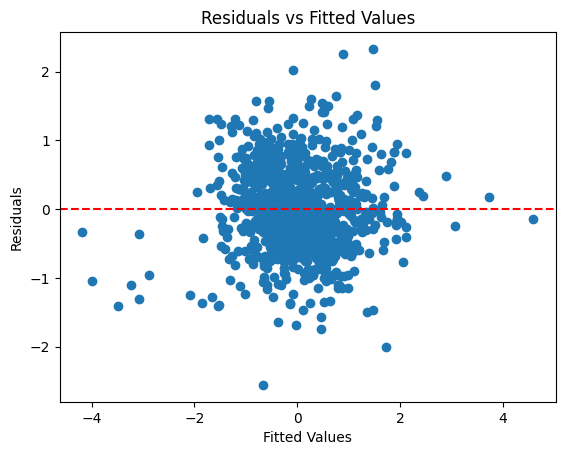

In [ ]:
plt.scatter(model.fittedvalues, model.resid)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted Values')
plt.show()

Model assumption 3: Linearity

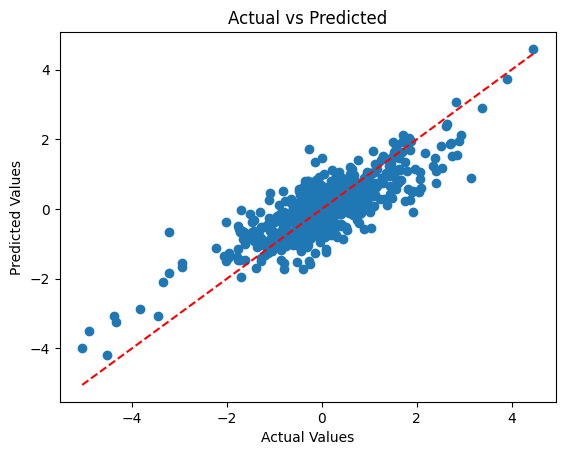

In [ ]:
y_pred = model.predict(sm.add_constant(X_train))

# Plot
plt.scatter(y_train, y_pred)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], color='red', linestyle='--')  # 45-degree line
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted')
plt.show()

Model assumption 4: Normality of the residuals

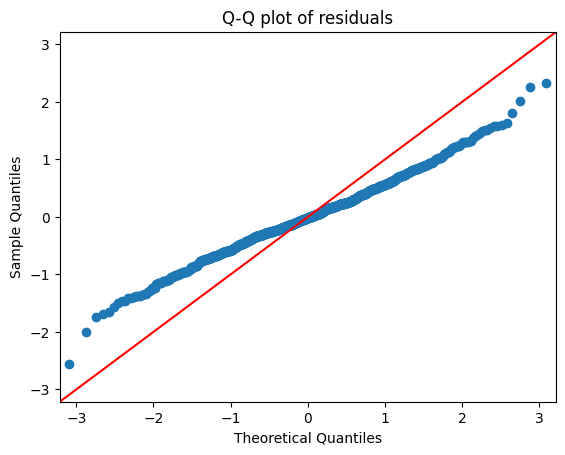

In [ ]:
sm.qqplot(model.resid, line='45')
plt.title('Q-Q plot of residuals')
plt.show()

###Checking for Autocorrelation

In [ ]:
from statsmodels.stats.stattools import durbin_watson
dw = durbin_watson(model.resid)
print(f"Durbin-Watson statistic: {dw:.4f}")

Durbin-Watson statistic: 0.8587


###Checking for Multicollinearity

In [ ]:
vif_data = pd.DataFrame()
vif_data["Variable"] = X_train.columns
vif_data["VIF"] = [variance_inflation_factor(X_train.values, i)
                   for i in range(X_train.shape[1])]

# 3. Print
sorted_vif = vif_data.sort_values("VIF", ascending=False)
sorted_vif

,Variable,VIF
0,Volume,inf
60,Negative_DI_x_Ascending_Triangle_Breakout_With...,inf
69,ADX_Buy_Signal_x_Triangle_Completion,inf
170,MACD_above_signal_x_Resistance,inf
67,Positive_DI_x_Triangle_Height,inf
...,...,...
267,Three_White_Soldiers,3.2681
264,Bullish_Engulfing,1.8298
265,Bearish_Engulfing,1.5961
124,RSI_12_Overbought_x_Stochastic_Buy_Signal,NaN


Drop VIF>10

In [ ]:
# count the number of variables is infinite
# Drop rows where the "VIF" column is infinite

inf_feats = sorted_vif[sorted_vif["VIF"].apply(np.isinf)]["Variable"].tolist()
X_reduce_inf = X_train.drop(columns=inf_feats)

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def drop_high_vif(X: pd.DataFrame,
                  thresh: float = 10.0,
                  bulk_thresh: float = 1e7):
    X_current = X.copy()
    while True:
        # compute VIF for each column
        vif = pd.Series(
            [variance_inflation_factor(X_current.values, i)
             for i in range(X_current.shape[1])],
            index=X_current.columns
        )

        # 1) bulk-drop any with VIF > bulk_thresh
        bulk_feats = vif[vif > bulk_thresh].index.tolist()
        if bulk_feats:
            for feat in bulk_feats:
                print(f"Dropping '{feat}' (VIF={vif[feat]:.0f} > {bulk_thresh:.0f})")
            X_current = X_current.drop(columns=bulk_feats)
            continue

        # 2) drop highest VIF > thresh one at a time
        max_vif = vif.max()
        if max_vif <= thresh:
            break

        drop_feat = vif.idxmax()
        print(f"Dropping '{drop_feat}' (VIF={max_vif:.2f})")
        X_current = X_current.drop(columns=[drop_feat])

    return X_current

In [ ]:
vifLess10_df = drop_high_vif(X_reduce_inf)
vifLess10_list= vifLess10_df.columns.tolist()

Dropping 'MACD' (VIF=3398009624 > 10000000)
Dropping 'MACD_Signal' (VIF=5901101415 > 10000000)
Dropping 'MACD_cum_buy' (VIF=213791912 > 10000000)
Dropping 'MACD_cum_sell' (VIF=672531074 > 10000000)
Dropping 'MA50' (VIF=18216565958 > 10000000)
Dropping 'MA200' (VIF=11056295707 > 10000000)
Dropping 'Price_vs_MA50' (VIF=1051387178 > 10000000)
Dropping 'Price_vs_MA200' (VIF=9448094589 > 10000000)
Dropping 'MA_Distance_Ratio' (VIF=1972526978 > 10000000)
Dropping 'MA_Distance_Ratio_x_OBV_Slope' (VIF=587400499201 > 10000000)
Dropping 'MA200_x_OBV_Slope' (VIF=892685753691 > 10000000)
Dropping 'MA50_x_OBV_Slope' (VIF=424948068255 > 10000000)
Dropping 'MACD_buy_x_OBV_Slope' (VIF=131527993 > 10000000)
Dropping 'MACD_cum_buy_x_OBV_Slope' (VIF=48245788588 > 10000000)
Dropping 'MACD_cum_sell_x_OBV_Slope' (VIF=6079758877 > 10000000)
Dropping 'MACD_sell_x_OBV_Slope' (VIF=143864964 > 10000000)
Dropping 'MACD_Signal_x_OBV_Slope' (VIF=7305108884624 > 10000000)
Dropping 'MACD_x_OBV_Slope' (VIF=76591830397

In [ ]:
model_reduce_vif = gen_reg(vifLess10_list,target,final_df)
print(model_reduce_vif.summary())

                               OLS Regression Results                               
Dep. Variable:     YeoJohnson_7D_Pct_Change   R-squared:                       0.264
Model:                                  OLS   Adj. R-squared:                  0.192
Method:                       Least Squares   F-statistic:                     3.680
Date:                      Wed, 30 Apr 2025   Prob (F-statistic):           1.51e-23
Time:                              14:29:20   Log-Likelihood:                -1276.7
No. Observations:                      1002   AIC:                             2733.
Df Residuals:                           912   BIC:                             3175.
Df Model:                                89                                         
Covariance Type:                  nonrobust                                         
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------

Back Elimination

In [ ]:
import statsmodels.formula.api as smf

def backward_elimination(
    data,
    response: str,
    predictors: list[str],
    sl: float = 0.05,
    verbose: bool = True
) -> list[str]:
    selected = predictors.copy()
    while True:
        # Build formula like "y ~ x1 + x2 + x3"
        formula = f"{response} ~ {' + '.join(selected)}"
        model   = smf.ols(formula, data=data).fit()
        # Drop the intercept from consideration
        pvals   = model.pvalues.drop('Intercept', errors='ignore')
        max_p   = pvals.max()

        if max_p > sl:
            worst = pvals.idxmax()
            selected.remove(worst)
            if verbose:
                print(f"Dropping '{worst}' (p = {max_p:.3f})")
        else:
            break

    return selected


In [ ]:
beSelected = backward_elimination(final_df, target, vifLess10_list, sl=0.05)

Dropping 'Upper_Shadow' (p = 0.997)
Dropping 'MACD_sell_x_OBV' (p = 0.969)
Dropping 'Extreme_Greed_x_SPY_Price' (p = 0.953)
Dropping 'BB_Sell' (p = 0.941)
Dropping 'Lower_Shadow' (p = 0.919)
Dropping 'SPY_Volume' (p = 0.892)
Dropping 'RSI_Divergence_x_Stochastic_perD' (p = 0.888)
Dropping 'Stochastic_perD' (p = 0.865)
Dropping 'ADX_Trend_Duration_x_Triangle_Height' (p = 0.865)
Dropping 'ETH_Volume' (p = 0.845)
Dropping 'RSI_12_Oversold_x_Stochastic_Sell_Signal' (p = 0.877)
Dropping 'RSI_6_x_Stochastic_perK' (p = 0.837)
Dropping 'MACD_buy_x_Support' (p = 0.832)
Dropping 'MACD_buy_x_Volume_Ratio' (p = 0.879)
Dropping 'RSI_12_Overbought_x_Stochastic_Buy_Signal' (p = 0.936)
Dropping 'MACD_cum_buy_x_OBV' (p = 0.734)
Dropping 'ADX_Trend_Duration' (p = 0.712)
Dropping 'ATR_Ratio_x_BB_Buy' (p = 0.706)
Dropping 'MACD_sell_x_Volume' (p = 0.697)
Dropping 'Gold_Volume_x_ETH_Price' (p = 0.670)
Dropping 'Price_vs_MA50_x_Resistance' (p = 0.707)
Dropping 'MA200_x_OBV' (p = 0.760)
Dropping 'ATR_Ratio_x

In [ ]:
model_reduce =gen_reg(beSelected,target,final_df)
print(model_reduce.summary())

                               OLS Regression Results                               
Dep. Variable:     YeoJohnson_7D_Pct_Change   R-squared:                       0.212
Model:                                  OLS   Adj. R-squared:                  0.195
Method:                       Least Squares   F-statistic:                     12.53
Date:                      Wed, 30 Apr 2025   Prob (F-statistic):           3.64e-38
Time:                              14:29:31   Log-Likelihood:                -1311.3
No. Observations:                      1002   AIC:                             2667.
Df Residuals:                           980   BIC:                             2775.
Df Model:                                21                                         
Covariance Type:                  nonrobust                                         
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------

In [ ]:
model_performance_regression(model_reduce,X_train[beSelected] , y_train)

,RMSE,MAE,R-squared,MAPE
0,0.9279,0.6830,0.2165,1756.8956


In [ ]:
model_performance_regression(model_reduce, X_test[beSelected], y_test)

,RMSE,MAE,R-squared,MAPE
0,0.8499,0.6532,0.0489,204.3612


In [ ]:
#Model assumption 1: Mean of residuals should be 0
residuals = model_reduce.resid
mean_residual = residuals.mean()
print(f"Mean of residuals: {mean_residual:.6f}")

Mean of residuals: -0.000000


In [ ]:
#Model assumption 2: No Heteroscedasticity
residuals = model_reduce.resid
exog = model_reduce.model.exog  # predictors including intercept

# Breusch-Pagan test
bp_test = het_breuschpagan(residuals, exog)

# Results
names = ['Lagrange multiplier statistic', 'p-value',
         'f-value', 'f p-value']
print(dict(zip(names, bp_test)))

{'Lagrange multiplier statistic': 82.85905761003214, 'p-value': 2.6722028498477285e-09, 'f-value': 4.206923925885713, 'f p-value': 9.912139077565714e-10}


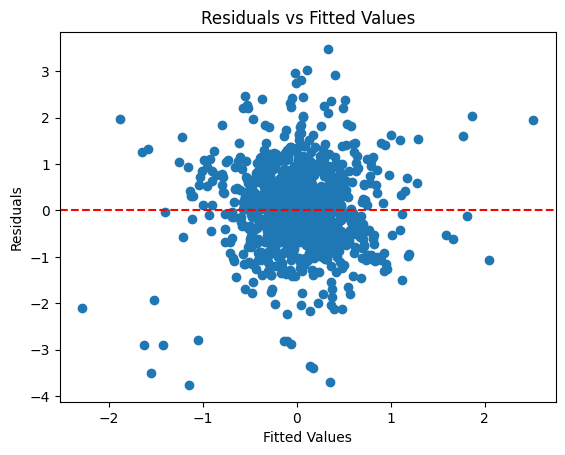

In [ ]:
plt.scatter(model_reduce.fittedvalues, model_reduce.resid)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted Values')
plt.show()

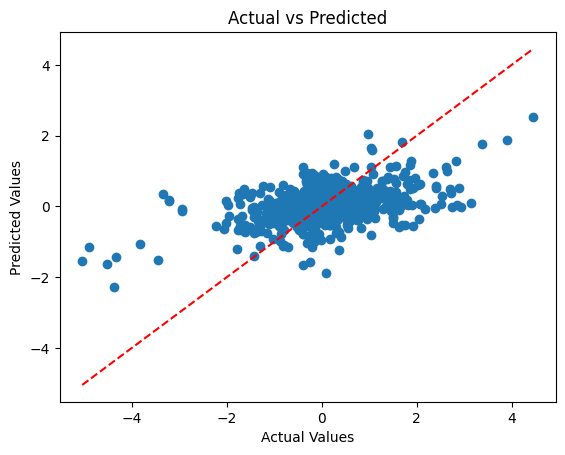

In [ ]:
#Model assumption 3: Linearity
y_pred = model_reduce.predict(sm.add_constant(X_train[beSelected]))

# Plot
plt.scatter(y_train, y_pred)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], color='red', linestyle='--')  # 45-degree line
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted')
plt.show()

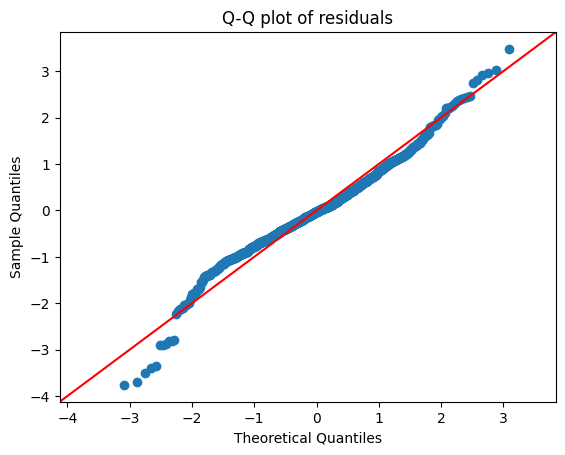

In [ ]:
#Model assumption 4: Normality of the residuals
sm.qqplot(model_reduce.resid, line='45')
plt.title('Q-Q plot of residuals')
plt.show()

stepwise selection

In [ ]:
import statsmodels.formula.api as smf

def stepwise_selection(
    data,
    response: str,
    predictors: list[str],
    p_enter: float = 0.05,
    p_remove: float = 0.05,
    verbose: bool = True
) -> list[str]:
    selected = []
    remaining = predictors.copy()
    step = 0

    while True:
        step += 1
        changed = False

        # --- Forward step
        best_pval = None
        best_candidate = None
        for cand in remaining:
            formula = f"{response} ~ " + " + ".join(selected + [cand])
            model = smf.ols(formula, data=data).fit()
            pval = model.pvalues.get(cand, None)
            if pval is not None and (best_pval is None or pval < best_pval):
                best_pval, best_candidate = pval, cand

        if best_candidate and best_pval <= p_enter:
            selected.append(best_candidate)
            remaining.remove(best_candidate)
            changed = True
            if verbose:
                print(f"Step {step}: Add    '{best_candidate}' (p = {best_pval:.4f})")

        # --- Backward step
        if selected:
            formula = f"{response} ~ " + " + ".join(selected)
            model = smf.ols(formula, data=data).fit()
            # drop the intercept from consideration
            pvals = model.pvalues.drop("Intercept", errors="ignore")
            worst_var = pvals.idxmax()
            worst_p  = pvals.max()
            if worst_p > p_remove:
                selected.remove(worst_var)
                remaining.append(worst_var)
                changed = True
                if verbose:
                    print(f"Step {step}: Drop   '{worst_var}' (p = {worst_p:.4f})")

        if not changed:
            break

    return selected


In [ ]:
steplist = stepwise_selection(final_df, target, vifLess10_list)
steplist

Step 1: Add    'Consecutive_Extreme_Fear' (p = 0.0000)
Step 2: Add    'ATR_Ratio_x_BB_cum_Sell' (p = 0.0000)
Step 3: Add    'Consecutive_ADX_Sell' (p = 0.0000)
Step 4: Add    'Yield_Spread_x_SPY_Volume' (p = 0.0000)
Step 5: Add    'MACD_cum_sell_x_Volume' (p = 0.0000)
Step 6: Add    'MACD_cum_sell_x_Support' (p = 0.0004)
Step 7: Add    'US_10Y' (p = 0.0009)
Step 8: Add    'ETH_Price' (p = 0.0000)
Step 9: Add    'RSI_Divergence' (p = 0.0019)
Step 10: Add    'ADX_Trend_Duration_x_Ascending_Triangle_Breakout_With_Volume' (p = 0.0012)
Step 11: Add    'RSI_12_Overbought_x_Stochastic_perK' (p = 0.0058)
Step 12: Add    'ADX_Strength_x_Triangle_Height' (p = 0.0093)
Step 13: Add    'MACD_cum_buy_x_Volume_Ratio' (p = 0.0114)
Step 14: Add    'MACD_cum_buy_x_Volume' (p = 0.0083)
Step 15: Add    'Consecutive_Extreme_Greed' (p = 0.0258)
Step 16: Add    'ADX_Strength' (p = 0.0187)
Step 16: Drop   'RSI_12_Overbought_x_Stochastic_perK' (p = 0.0695)
Step 17: Add    'ADX_Buy_Signal_x_Ascending_Triangle_B

['Consecutive_Extreme_Fear',
 'ATR_Ratio_x_BB_cum_Sell',
 'Consecutive_ADX_Sell',
 'Yield_Spread_x_SPY_Volume',
 'MACD_cum_sell_x_Volume',
 'US_10Y',
 'ETH_Price',
 'RSI_Divergence',
 'ADX_Trend_Duration_x_Ascending_Triangle_Breakout_With_Volume',
 'ADX_Strength_x_Triangle_Height',
 'MACD_cum_buy_x_Volume_Ratio',
 'MACD_cum_buy_x_Volume',
 'Consecutive_Extreme_Greed',
 'ADX_Strength',
 'ADX_Buy_Signal_x_Ascending_Triangle_Breakout_With_Volume',
 'MACD_cum_sell_x_OBV',
 'RSI_12_Oversold_x_Stochastic_perK',
 'MACD_buy_x_OBV',
 'ATR_x_BB_cum_Buy']

In [ ]:
model_step = gen_reg(steplist,target,final_df)
print(model_step.summary())


                               OLS Regression Results                               
Dep. Variable:     YeoJohnson_7D_Pct_Change   R-squared:                       0.205
Model:                                  OLS   Adj. R-squared:                  0.190
Method:                       Least Squares   F-statistic:                     13.37
Date:                      Wed, 30 Apr 2025   Prob (F-statistic):           9.41e-38
Time:                              14:30:26   Log-Likelihood:                -1315.2
No. Observations:                      1002   AIC:                             2670.
Df Residuals:                           982   BIC:                             2769.
Df Model:                                19                                         
Covariance Type:                  nonrobust                                         
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------

PCA

In [ ]:
from sklearn.decomposition import PCA

def gen_pcscore(X, n_components=5):
# X: your (n_samples × n_features) DataFrame or ndarray
    pca = PCA(n_components)      # how many PCs you want (None → all)
    scores = pca.fit_transform(X)  # shape = (n_samples, n_components)

    # Scores are like princomp’s “scores”
    # You can wrap them back into a DataFrame if you like:
    import pandas as pd
    pc_scores = pd.DataFrame(scores,
                            index=X.index,
                            columns=[f'PC{i+1}' for i in range(scores.shape[1])])

    # Loadings (eigenvectors) are in pca.components_
    # Note: sklearn’s components_ has shape (n_components, n_features),
    # so you’ll often transpose it to match R’s loadings layout:
    loadings = pd.DataFrame(pca.components_.T,
                            index=X.columns,
                            columns=[f'PC{i+1}' for i in range(pca.n_components_)])
    return pc_scores, loadings

In [ ]:
X_train_pca = X_train.drop(columns=interaction_list)
pcscore_train, loadings_train = gen_pcscore(X_train_pca, 20)
pcscore_train

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
Date,,,,,,,,,,,,,,,,,,,,
2022-05-09,-3964.6518,-490.9008,363.3493,-8.4856,-0.6724,10.3239,-22.1589,-12.9821,-4.1718,-2.1841,-5.1236,-4.0216,-4.1598,-0.6338,3.1727,-2.8653,0.4929,-0.2109,-1.3932,-0.8487
2022-05-10,917.2490,633.0429,1129.7607,-14.2759,2.0667,7.0072,-17.3077,-7.0718,-0.6056,-3.5697,-2.7009,-0.6662,-1.6065,0.3822,1.3581,-0.8041,0.2679,-0.3347,-0.9229,-0.0500
2022-05-11,-2018.7075,1119.7871,458.2238,-12.5743,0.9264,5.9485,-15.9051,-5.2540,0.9573,-1.9712,-1.4327,1.5808,1.4074,0.0459,-0.7001,0.8603,0.2162,-0.7102,0.1724,0.0673
2022-05-12,-281.9377,2287.4392,-290.7749,-15.8869,0.2746,3.9179,-15.0289,-1.8087,2.6539,-1.2896,-0.4380,4.2622,4.1826,0.0825,-2.9856,2.0664,-0.8054,0.0833,0.3850,-0.9288
2022-05-13,307.6745,627.5826,1283.0805,-11.8345,0.8910,4.0684,-2.2650,-0.7318,1.9393,-1.4069,0.5255,-0.7375,-1.0753,-0.2353,0.2703,2.2018,0.0223,-1.9443,3.5707,-0.5070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-04,2441.6505,842.2588,-44.2271,-1.5469,4.4002,-0.4302,1.2640,-1.9293,-1.2657,0.0608,0.5328,-1.1246,0.5356,-0.8719,1.2937,-0.3239,0.2339,-0.0556,-1.0845,0.1501
2024-04-05,-839.5542,1267.0790,-711.0803,1.5165,3.0588,-1.5398,1.2830,-2.2822,-0.6336,0.5849,0.5410,-1.3277,-1.3152,2.5233,2.1385,-0.0447,2.5565,-1.1261,-0.8851,-0.2073
2024-04-06,1018.9681,322.3192,301.5086,0.4397,4.2762,0.6085,1.9322,-3.2251,-1.2302,0.3184,0.9548,-1.0862,0.7735,-0.2695,1.2641,-0.0314,0.8073,-0.2950,-0.6401,-0.1785


In [ ]:
X_test_pca = X_test.drop(columns=interaction_list)
pcscore_test, loadings_test = gen_pcscore(X_test_pca, 20)
pcscore_test

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
Date,,,,,,,,,,,,,,,,,,,,
2024-09-06,-2538.0801,195.7466,-106.2899,-5.3663,-1.8774,3.5675,-0.1856,1.8793,1.7435,-0.5608,0.0083,-0.7943,-1.2449,-0.8345,0.0309,-0.2526,-1.0382,-0.3211,0.0164,0.3179
2024-09-07,-56.0065,-669.9085,243.8181,-5.8954,-0.1588,4.1080,0.5748,-0.4162,1.5077,-1.4066,0.4614,-0.8855,-0.7110,-1.2861,0.9509,1.3834,0.9271,0.2155,0.0020,0.1304
2024-09-08,420.7764,-512.0603,-149.6041,-5.6575,-0.1838,4.2558,0.6740,-1.0165,1.7943,-2.0929,0.4575,-1.1285,-0.0988,-1.2933,1.2601,3.4143,2.6141,0.7521,0.1305,-0.1825
2024-09-09,1927.7866,-375.7177,289.4548,-4.9288,-1.1794,2.7223,0.2385,0.5084,1.0846,-1.3514,-0.3552,-0.2590,-0.5814,-0.7436,-0.7391,-0.2060,-0.8887,-0.4617,0.6154,0.0058
2024-09-10,300.7142,-450.7761,-242.2814,-3.9975,-1.6983,1.9216,0.1708,0.0036,0.3469,-1.3601,-0.7090,-0.2272,-0.2347,-1.2592,-0.6280,-0.1330,-0.9784,0.0574,0.4252,0.0893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-30,766.6898,37.3749,977.0717,-1.4723,2.2636,-1.7777,1.6921,-0.3897,-0.8204,0.3083,0.1526,-0.1243,-0.6231,-1.0352,-0.3063,-0.6041,0.2851,-0.1685,-0.0080,-0.5084
2025-01-31,-2581.5603,-6.8465,458.8708,-1.2023,2.1171,-1.6413,1.2738,0.5620,-0.2380,0.8750,0.3382,-0.2711,-0.5590,-0.4953,0.0598,-0.3669,0.3889,0.3232,0.0389,-0.1513
2025-02-01,-2032.5789,-828.9199,26.8306,-1.5552,3.5914,-0.9117,1.3148,0.0502,-0.2180,1.3499,0.5051,-0.3932,-0.5102,-0.6699,0.5846,-0.3282,-0.0188,0.4002,-0.1195,-0.2320


In [ ]:
# Ensure y_train is aligned with pcscore_train
# Convert pcscore_train and target to float64 to avoid complex numbers
pclist = pcscore_train.columns.tolist()

# pcscore_train = pcscore_train.astype('float64')

pcscore_train['target'] = final_df[target].astype('float64')

# Generate the regression model
model_pca = gen_reg(pclist, 'target', pcscore_train)
print(model_pca.summary())

                            OLS Regression Results                            
Dep. Variable:                 target   R-squared:                       0.112
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     4.305
Date:                Wed, 30 Apr 2025   Prob (F-statistic):           1.70e-09
Time:                        14:30:27   Log-Likelihood:                -985.94
No. Observations:                 701   AIC:                             2014.
Df Residuals:                     680   BIC:                             2109.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0197      0.038      0.520      0.6

Lasso/ Ridge?

##Model 2: ANN

In [ ]:
import numpy as np
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error

def ann_lin(x_train, y_train, x_test, y_test,
            size, max_iter=10000, trace=False, n_try=5):
    best_train_mse = np.inf
    best_test_mse  = np.inf
    best_train_model = None
    best_test_model  = None

    for i in range(n_try):
        # create a regressor with one hidden layer of 'size' units
        model = MLPRegressor(hidden_layer_sizes=(size,),
                             activation='relu',
                             solver='adam',
                             max_iter=max_iter,
                             random_state=i)

        model.fit(x_train, y_train)

        # compute train MSE
        y_train_pred = model.predict(x_train)
        train_mse = mean_squared_error(y_train, y_train_pred)

        # compute test MSE
        y_test_pred = model.predict(x_test)
        test_mse = mean_squared_error(y_test, y_test_pred)

        if trace:
            print(f"Run {i+1}/{n_try} → train MSE: {train_mse:.4f}, test MSE: {test_mse:.4f}")

        # update best-by-train
        if train_mse < best_train_mse:
            best_train_mse = train_mse
            best_train_model = model

        # update best-by-test
        if test_mse < best_test_mse:
            best_test_mse = test_mse
            best_test_model = model

    return {
        'best_train_mse': best_train_mse,
        'best_test_mse':  best_test_mse,
        'best_train_model': best_train_model,
        'best_test_model':  best_test_model
    }


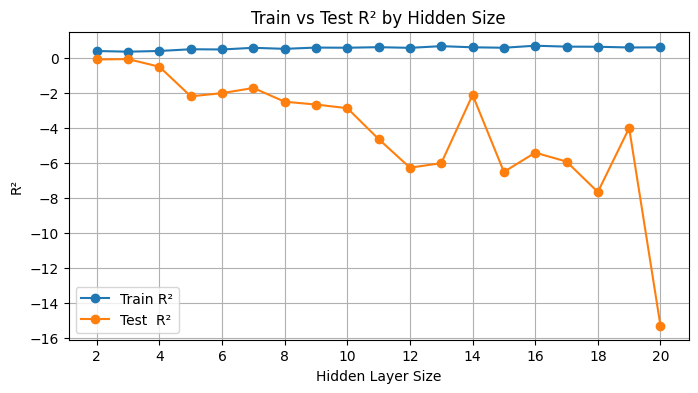

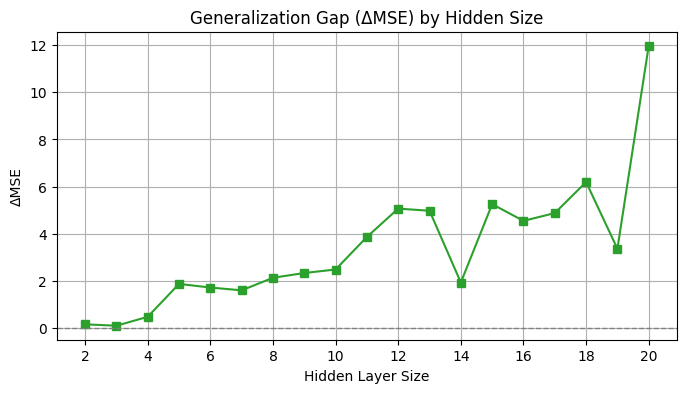

In [ ]:
hidden_sizes = range(2, 21)
train_r2 = []
test_r2  = []
delta_mse = []

for size in hidden_sizes:
    results = ann_lin(
        X_train, y_train,
        X_test,  y_test,
        size=size,
        max_iter=10000,
        trace=False,
        n_try=5
    )
    # best models
    m_train = results['best_train_model']
    m_test  = results['best_test_model']

    # predictions
    y_train_pred = m_train.predict(X_train)
    y_test_pred  = m_test .predict(X_test)

    # compute R²
    train_r2.append(r2_score(y_train, y_train_pred))
    test_r2 .append(r2_score(y_test,  y_test_pred))

    # compute ΔMSE
    delta_mse.append(results['best_test_mse'] - results['best_train_mse'])

# --- Plot R² curves ---
plt.figure(figsize=(8, 4))
plt.plot(hidden_sizes, train_r2, label='Train R²', marker='o')
plt.plot(hidden_sizes, test_r2,  label='Test  R²', marker='o')
plt.xlabel('Hidden Layer Size')
plt.ylabel('R²')
plt.title('Train vs Test R² by Hidden Size')
plt.xticks(np.arange(2, 21, 2))
plt.legend()
plt.grid(True)
plt.show()

# --- Plot ΔMSE ---
plt.figure(figsize=(8, 4))
plt.plot(hidden_sizes, delta_mse, label='Test MSE – Train MSE', marker='s', color='C2')
plt.xlabel('Hidden Layer Size')
plt.ylabel('ΔMSE')
plt.title('Generalization Gap (ΔMSE) by Hidden Size')
plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.xticks(np.arange(2, 21, 2))
plt.grid(True)
plt.show()


In [ ]:
model_ann = ann_lin(X_train, y_train, X_test, y_test,
            3, max_iter=10000, trace=False, n_try=5)

In [ ]:
model_ann

{'best_train_mse': 0.6878185669978992,
 'best_test_mse': 0.7980874754646278,
 'best_train_model': MLPRegressor(hidden_layer_sizes=(3,), max_iter=10000, random_state=3),
 'best_test_model': MLPRegressor(hidden_layer_sizes=(3,), max_iter=10000, random_state=2)}

In [ ]:
model_performance_regression(model_ann['best_train_model'], X_train, y_train)

,RMSE,MAE,R-squared,MAPE
0,0.8293,0.5876,0.3741,343.8267


In [ ]:
model_performance_regression(model_ann['best_test_model'], X_test, y_test)

,RMSE,MAE,R-squared,MAPE
0,0.8934,0.6778,-0.0509,201.5402


##Model 3: Random Forest (5102)

In [ ]:
# Build random forest model
regressor = RandomForestRegressor(
    n_estimators=200,
    max_depth=10,
    min_samples_leaf=100,
    max_features='log2',
    min_samples_split=100,
    bootstrap=True,
    oob_score=True,
    random_state=42,
    n_jobs=-1
)

# Fit on training data
regressor.fit(X_train, y_train)

RandomForestRegressor(max_depth=10, max_features='log2', min_samples_leaf=100,
                      min_samples_split=100, n_estimators=200, n_jobs=-1,
                      oob_score=True, random_state=42)

In [ ]:
# Train set performance
train_performance = model_performance_regression(regressor, X_train, y_train)
print("Training performance:", train_performance)

Training performance:     RMSE    MAE  R-squared     MAPE
0 0.9982 0.6951     0.0933 248.5905


In [ ]:
# Evaluate on validation set
val_performance = model_performance_regression(regressor, X_val, y_val)
print("Validation performance:", val_performance)

Validation performance:     RMSE    MAE  R-squared     MAPE
0 0.9348 0.7391    -0.1082 125.6275


In [ ]:
# Final evaluation on test set
final_test_performance_regressor = model_performance_regression(regressor, X_test, y_test)
print("\nFinal test performance:", final_test_performance_regressor)


Final test performance:     RMSE    MAE  R-squared     MAPE
0 0.8943 0.6746    -0.0531 135.6446


###Feature Selection

In [ ]:
from sklearn.inspection import permutation_importance
# Calculate permutation importance on validation set
perm_result = permutation_importance(
    regressor, X_val, y_val,
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

# Get importance scores and sort them
importances = perm_result.importances_mean
indices = np.argsort(importances)[::-1]  # Sort in descending order

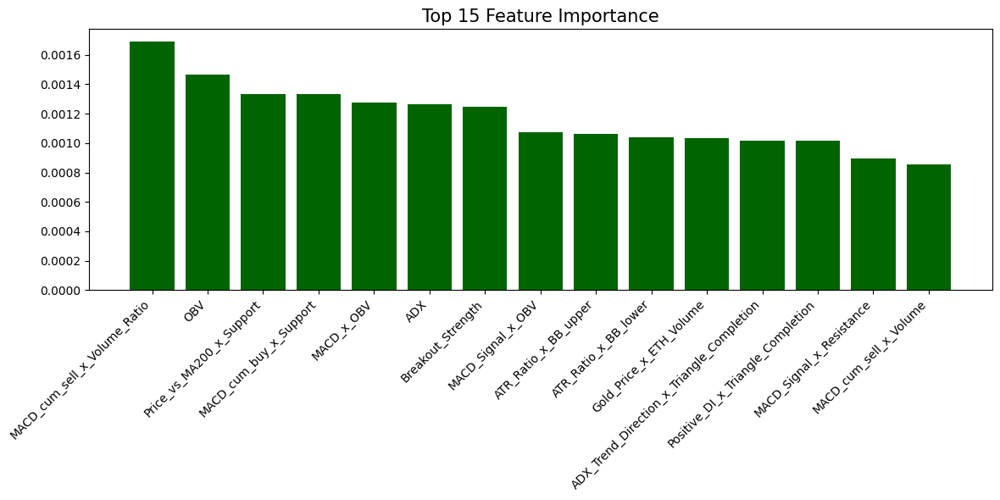


Top 15 features:
MACD_cum_sell_x_Volume_Ratio: 0.0017
OBV: 0.0015
Price_vs_MA200_x_Support: 0.0013
MACD_cum_buy_x_Support: 0.0013
MACD_x_OBV: 0.0013
ADX: 0.0013
Breakout_Strength: 0.0012
MACD_Signal_x_OBV: 0.0011
ATR_Ratio_x_BB_upper: 0.0011
ATR_Ratio_x_BB_lower: 0.0010
Gold_Price_x_ETH_Volume: 0.0010
ADX_Trend_Direction_x_Triangle_Completion: 0.0010
Positive_DI_x_Triangle_Completion: 0.0010
MACD_Signal_x_Resistance: 0.0009
MACD_cum_sell_x_Volume: 0.0009


In [ ]:
# Plot top 15 feature importances
n_top = min(15, len(indices))
plt.figure(figsize=(12, 6))
plt.title('Top 15 Feature Importance', fontsize=15)
plt.bar(range(n_top), importances[indices[:n_top]], color='darkgreen')
plt.xticks(range(n_top), [X_train.columns[i] for i in indices[:n_top]], rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Print top features
print("\nTop 15 features:")
for i in range(n_top):
    print(f"{X_train.columns[indices[i]]}: {importances[indices[i]]:.4f}")

In [ ]:
# Select features with positive importance
threshold = 0  # Only include features that improve predictions
selected_features = [X_train.columns[i] for i in indices if importances[i] > threshold]
print(f"Selected {len(selected_features)} out of {X_train.shape[1]} features")
print("Selected features:", selected_features)

Selected 189 out of 269 features
Selected features: ['MACD_cum_sell_x_Volume_Ratio', 'OBV', 'Price_vs_MA200_x_Support', 'MACD_cum_buy_x_Support', 'MACD_x_OBV', 'ADX', 'Breakout_Strength', 'MACD_Signal_x_OBV', 'ATR_Ratio_x_BB_upper', 'ATR_Ratio_x_BB_lower', 'Gold_Price_x_ETH_Volume', 'ADX_Trend_Direction_x_Triangle_Completion', 'Positive_DI_x_Triangle_Completion', 'MACD_Signal_x_Resistance', 'MACD_cum_sell_x_Volume', 'MACD_x_Support', 'Positive_DI_x_Triangle_Duration', 'ADX_Trend_Direction_x_Triangle_Duration', 'Price_vs_MA50_x_Support', 'ADX_Strength', 'MA200_x_Volume', 'MACD_cum_buy', 'MACD_cum_sell_x_Resistance', 'MACD_cum_buy_x_OBV_Slope', 'MA50_x_Volume', 'ATR_x_BB_cum_Buy', 'Gold_Volume_x_ETH_Price', 'Consecutive_RSI_12_Overbought_x_Stochastic_perD', 'Yield_Spread_x_SPY_Volume', 'RSI_12_x_Stochastic_perD', 'US_10Y', 'Negative_DI_x_Triangle_Completion', 'ADX_Strength_x_Triangle_Height', 'RSI_6_x_Stochastic_perK', 'RSI_12_x_Stochastic_perK', 'MACD', 'Gold_Volume_x_ETH_Volume', 'MACD

In [ ]:
# Create datasets with only selected features
X_train_selected = X_train[selected_features]
X_val_selected = X_val[selected_features]
X_test_selected = X_test[selected_features]

###Model Validation and Hyperparameter Tuning

Process time around 80 mins

In [ ]:
from tqdm.auto import tqdm

# Hyperparameter tuning
rf_tuned = RandomForestRegressor(random_state=42)

# Grid of parameters to choose from

parameters = {
'n_estimators': [100, 300],
'max_depth': [None, 10, 20],
'max_features': ['sqrt', 'log2', 0.7],
'min_samples_split': [2, 5],
'min_samples_leaf': [1, 2, 4],
'bootstrap': [True],
'criterion': ['squared_error'],
'random_state': [42],
'n_jobs': [-1],
'max_samples': [0.8],
}

# Use time series cross-validation
tscv = TimeSeriesSplit(n_splits=3)

# Calculate total parameter combinations for progress tracking
total_combinations = (
    len(parameters['n_estimators']) *
    len(parameters['max_depth']) *
    len(parameters['max_features']) *
    len(parameters['min_samples_split']) *
    len(parameters['min_samples_leaf']) *
    len(parameters['bootstrap']) *
    len(parameters['criterion']) *
    len(parameters['random_state']) *
    len(parameters['n_jobs']) *
    len(parameters['max_samples'])
)

print(f"Running grid search with {total_combinations} parameter combinations and {tscv.n_splits} CV splits")
print(f"Total model fits to perform: {total_combinations * tscv.n_splits}")

# Custom verbose callback to show progress
class TqdmCallback:
    def __init__(self, total):
        self.pbar = tqdm(total=total, desc="GridSearchCV Progress")
        self.count = 0

    def __call__(self, *args, **kwargs):
        self.count += 1
        self.pbar.update(1)

    def close(self):
        self.pbar.close()

progress_callback = TqdmCallback(total_combinations * tscv.n_splits)

# Run the grid search with custom verbose callback
with tqdm(total=1, desc="Overall Progress") as pbar:
    grid_obj = GridSearchCV(
        rf_tuned,
        parameters,
        scoring='r2',
        cv=tscv,
        n_jobs=-1,
        verbose=2
    )

    # Fit model with progress tracking
    grid_obj.fit(X_train_selected, y_train)
    pbar.update(1)

# Get the best model
rf_tuned_regressor = grid_obj.best_estimator_
print("Best parameters:", grid_obj.best_params_)
tuned_val_performance = model_performance_regression(rf_tuned_regressor, X_val_selected, y_val)
print("Tuned model validation performance:", tuned_val_performance)

Running grid search with 108 parameter combinations and 3 CV splits
Total model fits to perform: 324


GridSearchCV Progress:   0%|          | 0/324 [00:00<?, ?it/s]

Overall Progress:   0%|          | 0/1 [00:00<?, ?it/s]

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best parameters: {'bootstrap': True, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 'log2', 'max_samples': 0.8, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'n_jobs': -1, 'random_state': 42}
Tuned model validation performance:     RMSE    MAE  R-squared     MAPE
0 0.9958 0.8056    -0.2576 265.8861


In [ ]:
# Train final model on combined training and validation data
X_train_val = pd.concat([X_train_selected, X_val_selected])
y_train_val = pd.concat([y_train, y_val])

final_rfmodel = RandomForestRegressor(**grid_obj.best_params_)
final_rfmodel.fit(X_train_val, y_train_val)

RandomForestRegressor(max_features='log2', max_samples=0.8, min_samples_leaf=4,
                      n_jobs=-1, random_state=42)

In [ ]:
# Final evaluation on test set only
final_test_performance = model_performance_regression(final_rfmodel, X_test_selected, y_test)
print("\nFinal test performance:", final_test_performance)


Final test performance:     RMSE    MAE  R-squared     MAPE
0 1.0754 0.8203    -0.5228 338.2176


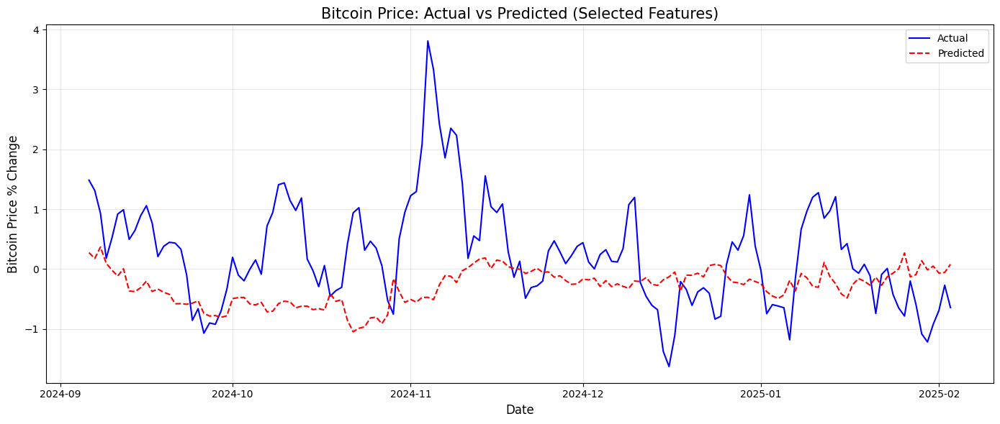

In [ ]:
# Plot actual vs predicted values on test set
y_pred = final_rfmodel.predict(X_test_selected)
plt.figure(figsize=(14, 6))
plt.title('Bitcoin Price: Actual vs Predicted (Selected Features)', fontsize=15)
plt.plot(y_test.index, y_test, label='Actual', color='blue')
plt.plot(y_test.index, y_pred, label='Predicted', color='red', linestyle='--')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Bitcoin Price % Change', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# Function to generate predictions with confidence intervals using bootstrap
def predict_with_confidence(model, X_data, n_bootstrap=1000):

    predictions = []

    # Get all individual tree predictions
    for tree in tqdm(model.estimators_, desc="Building confidence intervals"):
        predictions.append(tree.predict(X_data))

    # Convert to numpy array
    predictions = np.array(predictions)

    # Calculate mean prediction (overall prediction)
    mean_prediction = np.mean(predictions, axis=0)

    # Calculate confidence intervals
    lower_bound = np.percentile(predictions, 2.5, axis=0)
    upper_bound = np.percentile(predictions, 97.5, axis=0)

    return mean_prediction, lower_bound, upper_bound

In [ ]:
# Prediction with the model
prediction = final_rfmodel.predict(X_test_selected)[0]  #the first prediction in test set

mean_preds, lower_bounds, upper_bounds = predict_with_confidence(final_rfmodel, X_test_selected)
margin = (upper_bounds[0] - lower_bounds[0]) / 2

print(f"\nPredicted Bitcoin % change: {mean_preds[0]:.2f}% ± {margin:.2f}% based on model prediction with 95% confidence")

Building confidence intervals:   0%|          | 0/100 [00:00<?, ?it/s]


Predicted Bitcoin % change: 0.27% ± 1.54% based on model prediction with 95% confidence


#Model Performance Comparison

In [ ]:
# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    #adjr2 = adj_r2_score(predictors, target, pred)  # excluded adjr2
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            #"Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

In [ ]:
# Linear regression model - baseline
baseline_reg_perf_test = model_performance_regression(model, X_test, y_test)
baseline_reg_perf_test

,RMSE,MAE,R-squared,MAPE
0,0.5653,0.4367,0.5791,355.3042


In [ ]:
# Linear regression model - Reduced model 1 (calculated VIF)
model_reduce_vif_perf_test = model_performance_regression(model_reduce_vif, X_test[vifLess10_list], y_test)
model_reduce_vif_perf_test

,RMSE,MAE,R-squared,MAPE
0,0.8149,0.6371,0.1256,255.7304


In [ ]:
# Linear regression model - Reduced model 2 (backward elimination)
model_reduce_perf_test = model_performance_regression(model_reduce, X_test[beSelected], y_test)
model_reduce_perf_test

,RMSE,MAE,R-squared,MAPE
0,0.8499,0.6532,0.0489,204.3612


In [ ]:
# Linear regression model - Reduced model 3 (stepwise regression)
model_step_perf_test = model_performance_regression(model_step, X_test[steplist], y_test)
model_step_perf_test

,RMSE,MAE,R-squared,MAPE
0,0.8537,0.6464,0.0404,194.0169


In [ ]:
# Linear regression model - Reduced model 4 (PCA)
pca_perf_test = model_performance_regression(model_pca, pcscore_test, y_test)
pca_perf_test

,RMSE,MAE,R-squared,MAPE
0,0.9486,0.7303,-0.1850,279.9827


In [ ]:
# ANN
ann_perf_test = model_performance_regression(model_ann['best_test_model'], X_test, y_test)
ann_perf_test

,RMSE,MAE,R-squared,MAPE
0,0.8934,0.6778,-0.0509,201.5402


In [ ]:
# Random Forest
regressor_perf_test = model_performance_regression(regressor, X_test, y_test)
regressor_perf_test

,RMSE,MAE,R-squared,MAPE
0,0.8943,0.6746,-0.0531,135.6446


In [ ]:
# Tuned Random Forest Regressor
rf_tuned_regressor_perf_test = model_performance_regression(final_rfmodel, X_test_selected, y_test)
rf_tuned_regressor_perf_test

,RMSE,MAE,R-squared,MAPE
0,1.0754,0.8203,-0.5228,338.2176


In [ ]:
models_test_comp_df = pd.concat(
    [
        baseline_reg_perf_test.T,
        model_reduce_vif_perf_test.T,
        model_reduce_perf_test.T,
        model_step_perf_test.T,
        pca_perf_test.T,
        ann_perf_test.T,
        regressor_perf_test.T,
        rf_tuned_regressor_perf_test.T
    ],
    axis=1,
)

models_test_comp_df.columns = [
    "Baseline Linear Regression with all predictors",
    "Reduced model 1 (calculated VIF)",
    "Reduced model 2 (backward elimination)",
    "Reduced model 3 (stepwise regression)",
    "Reduced model 4 (PCA)",
    "ANN",
    "Random Forest regressor",
    "Tuned Random Forest Regressor"]

print("Test performance comparison:")
models_test_comp_df

Test performance comparison:


,Baseline Linear Regression with all predictors,Reduced model 1 (calculated VIF),Reduced model 2 (backward elimination),Reduced model 3 (stepwise regression),Reduced model 4 (PCA),ANN,Random Forest regressor,Tuned Random Forest Regressor
RMSE,0.5653,0.8149,0.8499,0.8537,0.9486,0.8934,0.8943,1.0754
MAE,0.4367,0.6371,0.6532,0.6464,0.7303,0.6778,0.6746,0.8203
R-squared,0.5791,0.1256,0.0489,0.0404,-0.1850,-0.0509,-0.0531,-0.5228
MAPE,355.3042,255.7304,204.3612,194.0169,279.9827,201.5402,135.6446,338.2176


#Final Model Evaluation and Backtesting

Final model selected: baseline model

## Back Transformation After prediction (for interpretation)

In [ ]:
# Recreate PowerTransformers with stored lambdas for back-transformation
power_transformer_price.lambdas_ = [lambdas['Price_lambda']]
power_transformer_change.lambdas_ = [lambdas['Change_lambda']]
power_transformer_7d_pct_change.lambdas_ = [lambdas['Pct_Change_lambda_7D']]
power_transformer_2d_pct_change.lambdas_ = [lambdas['Pct_Change_lambda_2D']]

# Step 1: De-standardize the standardized values to get Yeo-Johnson transformed values
scaled_btc_data['YeoJohnson_Price_Back'] = (
    scaled_btc_data['YeoJohnson_Price'] * transformed_stds['Price_std']
) + transformed_means['Price_mean']

scaled_btc_data['YeoJohnson_Change_Back'] = (
    scaled_btc_data['YeoJohnson_Change'] * transformed_stds['Change_std']
) + transformed_means['Change_mean']

scaled_btc_data['YeoJohnson_7D_Pct_Change_Back'] = (
    scaled_btc_data['YeoJohnson_7D_Pct_Change'] * transformed_stds['Pct_Change_std_7D']
) + transformed_means['Pct_Change_mean_7D']

scaled_btc_data['YeoJohnson_2D_Pct_Change_Back'] = (
    scaled_btc_data['YeoJohnson_2D_Pct_Change'] * transformed_stds['Pct_Change_std_2D']
) + transformed_means['Pct_Change_mean_2D']

# Step 2: Create temporary DataFrames with the exact column names used during fit
price_back_df = scaled_btc_data[['YeoJohnson_Price_Back']].rename(columns={'YeoJohnson_Price_Back': 'Price'})
change_back_df = scaled_btc_data[['YeoJohnson_Change_Back']].rename(columns={'YeoJohnson_Change_Back': 'Change'})
pct_change_7d_back_df = scaled_btc_data[['YeoJohnson_7D_Pct_Change_Back']].rename(columns={'YeoJohnson_7D_Pct_Change_Back': 'Pct_Change_7D'})
pct_change_2d_back_df = scaled_btc_data[['YeoJohnson_2D_Pct_Change_Back']].rename(columns={'YeoJohnson_2D_Pct_Change_Back': 'Pct_Change_2D'})

# Step 3: Apply the inverse transformation to recover the original values
scaled_btc_data['Original_Price'] = power_transformer_price.inverse_transform(price_back_df)
scaled_btc_data['Original_Change'] = power_transformer_change.inverse_transform(change_back_df)
scaled_btc_data['Original_7D_Pct_Change'] = power_transformer_7d_pct_change.inverse_transform(pct_change_7d_back_df)
scaled_btc_data['Original_2D_Pct_Change'] = power_transformer_2d_pct_change.inverse_transform(pct_change_2d_back_df)

# Step 4: Display the back-transformed data
print("\nBack-Transformed Data:")
print(scaled_btc_data[['Original_Price', 'Original_Change', 'Original_7D_Pct_Change', 'Original_2D_Pct_Change']].head())


Back-Transformed Data:
            Original_Price  Original_Change  Original_7D_Pct_Change  \
Date                                                                  
2022-05-09      30091.9759         -11.6455                 -0.8181   
2022-05-10      31004.7977           3.0314                 -1.8394   
2022-05-11      29064.8324          -6.2530                 -1.3237   
2022-05-12      28972.6026          -0.3202                  4.5915   
2022-05-13      29281.1031           1.0605                 -0.3618   

            Original_2D_Pct_Change  
Date                                
2022-05-09                 -3.4136  
2022-05-10                 -6.5548  
2022-05-11                  0.7440  
2022-05-12                  3.8131  
2022-05-13                  6.9157  


In [ ]:
# Recreate PowerTransformers with stored lambdas for back-transformation
power_transformer_price.lambdas_ = [lambdas['Price_lambda']]
power_transformer_change.lambdas_ = [lambdas['Change_lambda']]
power_transformer_7d_pct_change.lambdas_ = [lambdas['Pct_Change_lambda_7D']]
power_transformer_2d_pct_change.lambdas_ = [lambdas['Pct_Change_lambda_2D']]

# De-standardize the standardized values in final_df to get Yeo-Johnson transformed values
final_df['YeoJohnson_Price_Back'] = (
    final_df['YeoJohnson_Price'] * transformed_stds['Price_std']
) + transformed_means['Price_mean']

final_df['YeoJohnson_Change_Back'] = (
    final_df['YeoJohnson_Change'] * transformed_stds['Change_std']
) + transformed_means['Change_mean']

final_df['YeoJohnson_7D_Pct_Change_Back'] = (
    final_df['YeoJohnson_7D_Pct_Change'] * transformed_stds['Pct_Change_std_7D']
) + transformed_means['Pct_Change_mean_7D']

final_df['YeoJohnson_2D_Pct_Change_Back'] = (
    final_df['YeoJohnson_2D_Pct_Change'] * transformed_stds['Pct_Change_std_2D']
) + transformed_means['Pct_Change_mean_2D']

# Create temporary DataFrames with the exact column names used during fit
price_back_df = final_df[['YeoJohnson_Price_Back']].rename(columns={'YeoJohnson_Price_Back': 'Price'})
change_back_df = final_df[['YeoJohnson_Change_Back']].rename(columns={'YeoJohnson_Change_Back': 'Change'})
pct_change_7d_back_df = final_df[['YeoJohnson_7D_Pct_Change_Back']].rename(columns={'YeoJohnson_7D_Pct_Change_Back': 'Pct_Change_7D'})
pct_change_2d_back_df = final_df[['YeoJohnson_2D_Pct_Change_Back']].rename(columns={'YeoJohnson_2D_Pct_Change_Back': 'Pct_Change_2D'})

# Apply the inverse transformation to recover the original values
final_df['Original_Price'] = power_transformer_price.inverse_transform(price_back_df)
final_df['Original_Change'] = power_transformer_change.inverse_transform(change_back_df)
final_df['Original_7D_Pct_Change'] = power_transformer_7d_pct_change.inverse_transform(pct_change_7d_back_df)
final_df['Original_2D_Pct_Change'] = power_transformer_2d_pct_change.inverse_transform(pct_change_2d_back_df)

# Verify that the original data in final_df matches the original data in scaled_btc_data
if not all(final_df.index == scaled_btc_data.index):
    print("Warning: Indices don't match between final_df and scaled_btc_data")

    # Align the dataframes if needed
    common_dates = final_df.index.intersection(scaled_btc_data.index)
    print(f"Common dates count: {len(common_dates)}")

    # Create a new column in scaled_btc_data for verification
    scaled_btc_data_aligned = scaled_btc_data.loc[common_dates]
    final_df_aligned = final_df.loc[common_dates]

    # Verify values match (sample check)
    price_diff = (scaled_btc_data_aligned['Original_Price'] - final_df_aligned['Original_Price']).abs().mean()
    print(f"Average absolute difference in Original_Price between dataframes: {price_diff:.8f}")
else:
    print("Dataframe indices match perfectly")

    # Verify values match
    price_diff = (scaled_btc_data['Original_Price'] - final_df['Original_Price']).abs().mean()
    print(f"Average absolute difference in Original_Price between dataframes: {price_diff:.8f}")

# Create results DataFrame with predictions from each model
results = pd.DataFrame({
    'actual': y_test,  # actual test values
    'predicted': model.predict(X_test)  # baseline model (can change model here)
})

print(results[['actual', 'predicted']].head(10))
print(results['actual'].isna().sum(), "actual NaNs")
print(results['actual'].unique())

Dataframe indices match perfectly
Average absolute difference in Original_Price between dataframes: 0.00000000
            actual  predicted
Date                         
2024-09-06  1.4839     1.2559
2024-09-07  1.3123     1.3473
2024-09-08  0.9295     0.8129
2024-09-09  0.1779    -0.1521
2024-09-10  0.5203    -0.0935
2024-09-11  0.9180     0.2039
2024-09-12  0.9897     0.0886
2024-09-13  0.4948    -0.3827
2024-09-14  0.6439    -0.1345
2024-09-15  0.8911    -0.0473
0 actual NaNs
[ 1.48386190e+00  1.31230629e+00  9.29544981e-01  1.77859461e-01
  5.20318851e-01  9.17984320e-01  9.89706540e-01  4.94847543e-01
  6.43885235e-01  8.91084231e-01  1.05772298e+00  7.68067826e-01
  2.07861302e-01  3.78145026e-01  4.46384914e-01  4.33417114e-01
  3.31517508e-01 -9.57566287e-02 -8.57718104e-01 -6.61912255e-01
 -1.07170876e+00 -9.00512028e-01 -9.23715553e-01 -7.01503885e-01
 -3.39376705e-01  1.95520523e-01 -1.01203461e-01 -1.96842406e-01
 -5.36238973e-03  1.51669420e-01 -8.60915402e-02  7.18465837

## Backtesting and Trading Strategy

In [ ]:
# Function to clone the final model
def clone_and_predict(model, X_train, y_train, X_pred):
    """Handle different model types for prediction"""
    if isinstance(model, sm.regression.linear_model.RegressionResultsWrapper):
        if hasattr(model.model, 'formula'):
            formula = model.model.formula
            train_data = X_train.copy()
            train_data[y_train.name] = y_train
            new_model = smf.ols(formula=formula, data=train_data).fit()
            return new_model.predict(X_pred)
        else:
            X_train_with_const = sm.add_constant(X_train)
            X_pred_with_const = sm.add_constant(X_pred)
            new_model = sm.OLS(y_train, X_train_with_const).fit()
            return new_model.predict(X_pred_with_const)
    else:
        try:
            from sklearn.base import clone
            new_model = clone(model)
            new_model.fit(X_train, y_train)
            return new_model.predict(X_pred)
        except:
            try:
                model.fit(X_train, y_train)
                return model.predict(X_pred)
            except:
                print("Warning: Could not use model for prediction")
                return np.zeros(len(X_pred))

In [ ]:
# Generate predictions using walk-forward validation
def generate_predictions(model, X, target_col, test_size=0.3, step_size=0.05):

    # Extract feature columns (exclude YeoJohnson transformed and original columns)
    feature_cols = [col for col in X.columns if not any(x in col for x in ['YeoJohnson_', 'Original_'])]
    X_features = X[feature_cols].copy()
    target_series = X[target_col].copy()

    # Calculate indices for the test period
    data_size = len(X_features)
    test_start_idx = int(data_size * (1 - test_size))  # Start index for testing
    step_idx = max(1, int(data_size * step_size))      # Number of steps to move forward

    # Initialize results DataFrame for the test period
    results = pd.DataFrame(index=X_features.index[test_start_idx:])
    results['actual'] = target_series.iloc[test_start_idx:].values
    results['predicted'] = np.nan  # Will be filled during walk-forward validation

    # Add price if available
    if 'Original_Price' in X.columns:
        results['price'] = X['Original_Price'].iloc[test_start_idx:].values

    # Walk-forward validation loop
    train_end_idx = test_start_idx  # Initial training window ends at test start
    with tqdm(total=data_size - test_start_idx) as pbar:
        while train_end_idx < data_size:
            # Step 1: Define training data up to current point
            X_train = X_features.iloc[:train_end_idx]
            y_train = target_series.iloc[:train_end_idx]

            # Step 2: Define prediction window (next step_size portion of data)
            pred_end_idx = min(train_end_idx + step_idx, data_size)
            X_pred = X_features.iloc[train_end_idx:pred_end_idx]

            if len(X_pred) == 0:
                break  # No more data to predict

            # Step 3: Train model on historical data and predict next window
            predictions = clone_and_predict(model, X_train, y_train, X_pred)

            # Step 4: Store predictions
            pred_indices = X_features.index[train_end_idx:pred_end_idx]
            results.loc[pred_indices, 'predicted'] = predictions

            # Step 5: Move training window forward
            train_end_idx = pred_end_idx
            pbar.update(min(step_idx, pred_end_idx - (train_end_idx - step_idx)))

    return results

In [ ]:
def apply_trading_strategy(prediction_results, target_col,
                          initial_capital=10000, position_size=0.15,
                          stop_loss=None, take_profit=None,
                          threshold=2.0, confidence_margin=1.0,
                          min_confirmations=3,
                          buy_hold_allocation=0.7, trading_allocation=0.3):
    """Apply trading strategy to prediction results and track portfolio performance"""
    results = prediction_results.copy()

    # Normalize allocation percentages
    total_allocation = buy_hold_allocation + trading_allocation
    if total_allocation != 1.0:
        buy_hold_allocation = buy_hold_allocation / total_allocation
        trading_allocation = trading_allocation / total_allocation

    # Set up for price tracking first - this needs to happen before other calculations
    if 'price' in results.columns:
        price_col = 'price'
    else:
        # Create synthetic price if not available
        results['synth_price'] = 100

        # Initialize actual_return column if needed
        if 'actual_return' not in results.columns:
            if '7D_Pct_Change' in target_col or '2D_Pct_Change' in target_col:
                results['actual_return'] = results['actual'] / 100
            else:
                results['actual_return'] = results['actual']

        for i in range(1, len(results)):
            # Calculate synthetic price based on returns
            if i > 0 and pd.notna(results['actual_return'].iloc[i]):
                results.loc[results.index[i], 'synth_price'] = results['synth_price'].iloc[i-1] * (1 + results['actual_return'].iloc[i])

        price_col = 'synth_price'

    # Calculate prediction reliability metrics
    results['pred_error'] = results['actual'] - results['predicted']
    results['rolling_error'] = results['pred_error'].rolling(window=20, min_periods=1).mean()
    results['error_std'] = results['pred_error'].rolling(window=20, min_periods=1).std()

    # Create base directional signal
    results['raw_signal'] = np.where(results['predicted'] > threshold + confidence_margin, 1,
                           np.where(results['predicted'] < -threshold - confidence_margin, -1, 0))

    # Calculate technical indicators
    if 'price_ma5' not in results.columns:
        results['price_ma5'] = results[price_col].rolling(window=5, min_periods=1).mean()
    if 'price_ma20' not in results.columns:
        results['price_ma20'] = results[price_col].rolling(window=20, min_periods=1).mean()
    if 'price_ma50' not in results.columns and 'MA50' not in results.columns:
        results['price_ma50'] = results[price_col].rolling(window=50, min_periods=1).mean()
    if 'price_ma200' not in results.columns and 'MA200' not in results.columns:
        results['price_ma200'] = results[price_col].rolling(window=200, min_periods=1).mean()

    # Track confirmations
    has_rsi = 'RSI_6' in results.columns and 'RSI_12' in results.columns
    has_macd = 'MACD' in results.columns and 'MACD_Signal' in results.columns
    has_bb = 'BB_upper' in results.columns and 'BB_lower' in results.columns
    has_adx = 'ADX' in results.columns

    results['buy_confirmations'] = 0
    results['sell_confirmations'] = 0

    # Add confirmations
    results['trend_bullish'] = ((results[price_col] > results['price_ma20']) &
                              (results['price_ma20'] > results['price_ma50'].fillna(0)))
    results['trend_bearish'] = ((results[price_col] < results['price_ma20']) &
                              (results['price_ma20'] < results['price_ma50'].fillna(0)))

    results['buy_confirmations'] += results['trend_bullish'].astype(int)
    results['sell_confirmations'] += results['trend_bearish'].astype(int)

    if has_rsi:
        results['rsi_bullish'] = ((results['RSI_6'] > 50) & (results['RSI_6'] < 70) &
                                (results['RSI_12'] > 50) & (results['RSI_12'] < 70))
        results['rsi_bearish'] = ((results['RSI_6'] < 50) & (results['RSI_6'] > 30) &
                                (results['RSI_12'] < 50) & (results['RSI_12'] > 30))

        results['buy_confirmations'] += results['rsi_bullish'].astype(int)
        results['sell_confirmations'] += results['rsi_bearish'].astype(int)

    if has_macd:
        results['macd_bullish'] = (results['MACD'] > results['MACD_Signal']) & (results['MACD'] > 0)
        results['macd_bearish'] = (results['MACD'] < results['MACD_Signal']) & (results['MACD'] < 0)

        results['buy_confirmations'] += results['macd_bullish'].astype(int)
        results['sell_confirmations'] += results['macd_bearish'].astype(int)

    if has_bb:
        results['bb_bullish'] = (results[price_col] > results['BB_lower']) & (results[price_col] < (results['BB_lower'] * 1.02))
        results['bb_bearish'] = (results[price_col] < results['BB_upper']) & (results[price_col] > (results['BB_upper'] * 0.98))

        results['buy_confirmations'] += results['bb_bullish'].astype(int)
        results['sell_confirmations'] += results['bb_bearish'].astype(int)

    if has_adx:
        results['adx_strong'] = results['ADX'] > 25
        results['buy_confirmations'] = results['buy_confirmations'] * results['adx_strong'].astype(int)
        results['sell_confirmations'] = results['sell_confirmations'] * results['adx_strong'].astype(int)

    if 'Volume' in results.columns:
        results['vol_ma20'] = results['Volume'].rolling(window=20).mean()
        results['volume_high'] = results['Volume'] > results['vol_ma20'] * 1.2

        results['buy_confirmations'] += results['volume_high'].astype(int)
        results['sell_confirmations'] += results['volume_high'].astype(int)

    # Generate signals
    results['signal'] = np.where(
        (results['raw_signal'] == 1) & (results['buy_confirmations'] >= min_confirmations), 1,
        np.where((results['raw_signal'] == -1) & (results['sell_confirmations'] >= min_confirmations), -1, 0)
    )

    # Error filter
    error_threshold = results['error_std'].mean() * 1.5
    results['signal'] = np.where(results['error_std'] > error_threshold, 0, results['signal'])

    # Market regime filter
    results['bull_market'] = results[price_col] > results['price_ma200'].fillna(0)
    results['signal'] = np.where(
        (~results['bull_market']) & (results['signal'] == 1), 0,
        np.where((results['bull_market']) & (results['signal'] == -1), 0, results['signal'])
    )

    # Position sizing
    results['conviction'] = (np.minimum(results['buy_confirmations'], results['sell_confirmations']) /
                           max(min_confirmations, 1))
    results['position_pct'] = results['signal'] * np.minimum(results['conviction'] * 0.5, 1.0) * position_size

    # Avoid look-ahead bias
    results['signal'] = results['signal'].shift(1).fillna(0)
    results['position_pct'] = results['position_pct'].shift(1).fillna(0)

    # Calculate actual returns
    if '7D_Pct_Change' in target_col or '2D_Pct_Change' in target_col:
        results['actual_return'] = results['actual'] / 100
    else:
        if 'price' in results.columns:
            results['actual_return'] = results[price_col].pct_change()
        else:
            results['actual_return'] = results['actual']

    # Initialize portfolio tracking columns properly
    results['trading_capital'] = np.nan
    results['buyhold_capital'] = np.nan
    results['total_capital'] = np.nan
    results['position'] = 0
    results['shares'] = 0
    results['cash'] = np.nan

    # Volatility metrics
    results['daily_range'] = results[price_col].rolling(window=14).std()
    results['volatility_factor'] = 1.0 - np.minimum(results['daily_range'] / results[price_col] * 20, 0.5)

    # Initialize portfolio values for the first row
    buyhold_capital = initial_capital * buy_hold_allocation
    trading_capital = initial_capital * trading_allocation

    if len(results) > 0:
        # Set initial values
        results.loc[results.index[0], 'trading_capital'] = trading_capital
        results.loc[results.index[0], 'buyhold_capital'] = buyhold_capital
        results.loc[results.index[0], 'total_capital'] = initial_capital
        results.loc[results.index[0], 'cash'] = trading_capital

        first_price = results[price_col].iloc[0]
        if pd.notna(first_price) and first_price > 0:
            buyhold_shares = buyhold_capital / first_price
        else:
            buyhold_shares = 0
    else:
        buyhold_shares = 0

    # Trading variables
    entry_price = 0
    current_position = 0
    days_in_position = 0
    max_position_days = 10
    max_trades_open = 1
    trades_today = 0
    max_daily_trades = 1
    open_trades = 0
    trade_count = 0
    winning_trades = 0
    trailing_stop_pct = 0.02
    highest_price = 0
    lowest_price = float('inf')
    prev_cash = trading_capital
    prev_shares = 0

    # Backtesting loop
    for i in range(1, len(results)):
        if i >= len(results):
            break

        # Get current indexes
        prev_idx = results.index[i-1]
        curr_idx = results.index[i]

        # Safely access data
        try:
            prev_signal = results.loc[prev_idx, 'signal']
            prev_position_pct = results.loc[prev_idx, 'position_pct']
            volatility_factor = results.loc[prev_idx, 'volatility_factor']
            curr_price = results.loc[curr_idx, price_col]
        except KeyError as e:
            print(f"Error accessing data at index {i}: {e}")
            continue

        if pd.isna(curr_price) or curr_price <= 0:
            # Skip this iteration if price data is invalid
            continue

        # Update buy & hold value
        buyhold_value = buyhold_shares * curr_price

        # Handle position tracking and stops
        if current_position != 0:
            days_in_position += 1

            if current_position == 1:
                highest_price = max(highest_price, curr_price)
                trailing_stop = highest_price * (1 - trailing_stop_pct)
            elif current_position == -1:
                lowest_price = min(lowest_price, curr_price)
                trailing_stop = lowest_price * (1 + trailing_stop_pct)

        # Force close if in position too long
        if days_in_position > max_position_days and current_position != 0:
            if current_position == 1:  # Close long
                cash_value = prev_shares * curr_price
                prev_cash = cash_value
                if (curr_price / entry_price) - 1 > 0:
                    winning_trades += 1
                prev_shares = 0
            elif current_position == -1:  # Close short
                cash_value = prev_cash + (entry_price - curr_price) * abs(prev_shares)
                prev_cash = cash_value
                if 1 - (curr_price / entry_price) > 0:
                    winning_trades += 1
                prev_shares = 0

            current_position = 0
            entry_price = 0
            days_in_position = 0
            open_trades -= 1
            trade_count += 1

        # Dynamic stop loss/take profit
        if stop_loss is not None:
            dynamic_stop = stop_loss * (1 / max(volatility_factor, 0.5))
        else:
            dynamic_stop = 0.02

        if take_profit is not None:
            dynamic_tp = take_profit * max(volatility_factor, 0.5)
        else:
            dynamic_tp = 0.04

        # Check stops
        if current_position != 0 and entry_price > 0:
            if current_position == 1:  # Long position
                current_return = (curr_price / entry_price) - 1

                if current_return <= -dynamic_stop:
                    cash_value = prev_shares * curr_price
                    current_position = 0
                    entry_price = 0
                    prev_signal = 0
                    prev_cash = cash_value
                    prev_shares = 0
                    days_in_position = 0
                    open_trades -= 1
                    trade_count += 1

                elif curr_price < trailing_stop and highest_price > entry_price:
                    cash_value = prev_shares * curr_price
                    current_position = 0
                    entry_price = 0
                    prev_signal = 0
                    prev_cash = cash_value
                    prev_shares = 0
                    days_in_position = 0
                    open_trades -= 1
                    trade_count += 1
                    if curr_price > entry_price:
                        winning_trades += 1

                elif current_return >= dynamic_tp:
                    cash_value = prev_shares * curr_price
                    current_position = 0
                    entry_price = 0
                    prev_signal = 0
                    prev_cash = cash_value
                    prev_shares = 0
                    days_in_position = 0
                    open_trades -= 1
                    trade_count += 1
                    winning_trades += 1

            elif current_position == -1:  # Short position
                current_return = 1 - (curr_price / entry_price)

                if current_return <= -dynamic_stop:
                    cash_value = prev_cash + (entry_price - curr_price) * abs(prev_shares)
                    current_position = 0
                    entry_price = 0
                    prev_signal = 0
                    prev_cash = cash_value
                    prev_shares = 0
                    days_in_position = 0
                    open_trades -= 1
                    trade_count += 1

                elif curr_price > trailing_stop and lowest_price < entry_price:
                    cash_value = prev_cash + (entry_price - curr_price) * abs(prev_shares)
                    current_position = 0
                    entry_price = 0
                    prev_signal = 0
                    prev_cash = cash_value
                    prev_shares = 0
                    days_in_position = 0
                    open_trades -= 1
                    trade_count += 1
                    if curr_price < entry_price:
                        winning_trades += 1

                elif current_return >= dynamic_tp:
                    cash_value = prev_cash + (entry_price - curr_price) * abs(prev_shares)
                    current_position = 0
                    entry_price = 0
                    prev_signal = 0
                    prev_cash = cash_value
                    prev_shares = 0
                    days_in_position = 0
                    open_trades -= 1
                    trade_count += 1
                    winning_trades += 1

        # Reset daily trade counter
        if i > 1 and results.index[i].date() != results.index[i-1].date():
            trades_today = 0

        # Process trading signal
        if prev_signal != current_position and trades_today < max_daily_trades and open_trades < max_trades_open:
            # Close existing position
            if current_position == 1:  # Close long
                cash_value = prev_shares * curr_price
                prev_cash = cash_value
                prev_shares = 0
                current_position = 0
                entry_price = 0
                days_in_position = 0
                open_trades -= 1
                trade_count += 1
                if entry_price > 0 and (curr_price / entry_price) - 1 > 0:
                    winning_trades += 1

            elif current_position == -1:  # Close short
                cash_value = prev_cash + (entry_price - curr_price) * abs(prev_shares)
                prev_cash = cash_value
                prev_shares = 0
                current_position = 0
                entry_price = 0
                days_in_position = 0
                open_trades -= 1
                trade_count += 1
                if entry_price > 0 and 1 - (curr_price / entry_price) > 0:
                    winning_trades += 1

            # Open new position
            if prev_signal != 0:
                adjusted_position_size = abs(prev_position_pct) * volatility_factor * 0.5
                position_value = prev_cash * adjusted_position_size

                if position_value > 0:
                    if prev_signal == 1:  # Long
                        prev_shares = position_value / curr_price
                        prev_cash -= position_value
                        current_position = 1
                        entry_price = curr_price
                        days_in_position = 0
                        trades_today += 1
                        open_trades += 1
                        highest_price = curr_price

                    elif prev_signal == -1:  # Short
                        prev_shares = -position_value / curr_price
                        current_position = -1
                        entry_price = curr_price
                        days_in_position = 0
                        trades_today += 1
                        open_trades += 1
                        lowest_price = curr_price

        # Calculate capital values
        if current_position == 1:  # Long
            trading_value = prev_cash + (prev_shares * curr_price)
        elif current_position == -1:  # Short
            short_pnl = (entry_price - curr_price) * abs(prev_shares)
            trading_value = prev_cash + short_pnl
        else:  # No position
            trading_value = prev_cash

        total_capital = trading_value + buyhold_value

        # Update results - use .loc for safe assignment
        results.loc[curr_idx, 'trading_capital'] = trading_value
        results.loc[curr_idx, 'buyhold_capital'] = buyhold_value
        results.loc[curr_idx, 'total_capital'] = total_capital
        results.loc[curr_idx, 'position'] = current_position
        results.loc[curr_idx, 'shares'] = prev_shares
        results.loc[curr_idx, 'cash'] = prev_cash

    # Calculate return metrics with safety checks
    results['trading_return'] = results['trading_capital'].pct_change().fillna(0)
    results['cum_trading_return'] = (1 + results['trading_return']).cumprod() - 1

    results['buyhold_return'] = results['buyhold_capital'].pct_change().fillna(0)
    results['cum_buyhold_return'] = (1 + results['buyhold_return']).cumprod() - 1

    results['total_return'] = results['total_capital'].pct_change().fillna(0)
    results['cum_total_return'] = (1 + results['total_return']).cumprod() - 1

    results['market_return'] = results[price_col].pct_change().fillna(0)
    results['cum_market_return'] = (1 + results['market_return']).cumprod() - 1

    results['peak_total'] = results['total_capital'].cummax()
    # Avoid division by zero
    results['drawdown'] = (results['total_capital'] - results['peak_total']) / results['peak_total'].replace(0, np.nan).fillna(1)

    return results

In [ ]:
# Analyze backtest results
def analyze_backtest(results):
    """Simple performance analyzer"""
    # Find return columns
    cum_return_col = 'cum_total_return' if 'cum_total_return' in results.columns else 'cum_return'
    market_return_col = 'cum_market_return' if 'cum_market_return' in results.columns else None

    # Get final returns
    total_return = results[cum_return_col].iloc[-1] * 100 if cum_return_col in results.columns else 0
    market_return = results[market_return_col].iloc[-1] * 100 if market_return_col in results.columns else 0

    # Calculate annualized returns
    days = (results.index[-1] - results.index[0]).days
    years = days / 365
    annual_return = ((1 + total_return/100) ** (1/max(years, 0.01)) - 1) * 100
    market_annual_return = ((1 + market_return/100) ** (1/max(years, 0.01)) - 1) * 100 if market_return_col else 0

    # Calculate Sharpe
    if 'total_return' in results.columns:
        daily_returns = results['total_return'].dropna()
        sharpe_ratio = daily_returns.mean() / max(daily_returns.std(), 0.0001) * np.sqrt(252) if len(daily_returns) > 0 else 0
    else:
        sharpe_ratio = 0

    # Calculate drawdown
    max_drawdown = results['drawdown'].min() * 100 if 'drawdown' in results.columns else 0

    # Count trades (as complete round trips)
    if 'position' in results.columns:
        # First, identify all position changes
        changes = results['position'].diff().fillna(0)
        entries = changes.loc[changes != 0]

        # Count round trip trades (from 0 to non-zero and back to 0)
        round_trips = []
        in_trade = False
        entry_pos = 0

        for date, change in entries.items():
            new_pos = results.loc[date, 'position']
            if not in_trade and new_pos != 0:
                # New entry
                in_trade = True
                entry_pos = new_pos
            elif in_trade and new_pos == 0:
                # Exit
                round_trips.append((entry_pos, new_pos))
                in_trade = False

        total_trades = len(round_trips)
    else:
        total_trades = 0

    # Calculate win rate
    if 'position' in results.columns:
        trades = []
        current_position = 0
        entry_price = 0
        entry_date = None

        price_col = 'price' if 'price' in results.columns else 'synth_price'

        if price_col in results.columns:
            for date, row in results.iterrows():
                if row['position'] != current_position:
                    if current_position != 0 and entry_price > 0:
                        exit_price = row[price_col] if not pd.isna(row[price_col]) else 0

                        if current_position == 1:  # Long
                            trade_return = (exit_price / entry_price) - 1 if entry_price > 0 else 0
                        else:  # Short
                            trade_return = 1 - (exit_price / entry_price) if entry_price > 0 else 0

                        trades.append({
                            'entry_date': entry_date,
                            'exit_date': date,
                            'type': 'long' if current_position == 1 else 'short',
                            'return': trade_return
                        })

                    current_position = row['position']
                    if current_position != 0:
                        entry_price = row[price_col] if not pd.isna(row[price_col]) else 0
                        entry_date = date

        if trades:
            winning_trades = sum(1 for trade in trades if trade['return'] > 0)
            win_rate = winning_trades / len(trades) * 100
            win_count = f"{winning_trades}/{len(trades)}"
        else:
            win_rate = 0
            win_count = "0/0"
    else:
        win_rate = 0
        win_count = "0/0"

    # Print summary
    print("\nPerformance Summary:")
    print(f"Total Return: {total_return:.2f}% (Market: {market_return:.2f}%)")
    print(f"Annual Return: {annual_return:.2f}% (Market: {market_annual_return:.2f}%)")
    print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Max Drawdown: {max_drawdown:.2f}%")
    print(f"Total Trades: {total_trades}")
    print(f"Win Rate: {win_rate:.2f}% {win_count}")

    return {
        'Total Return': f"{total_return:.2f}% (Market: {market_return:.2f}%)",
        'Annual Return': f"{annual_return:.2f}% (Market: {market_annual_return:.2f}%)",
        'Sharpe Ratio': f"{sharpe_ratio:.2f}",
        'Max Drawdown': f"{max_drawdown:.2f}%",
        'Total Trades': total_trades,
        'Win Rate': f"{win_rate:.2f}% {win_count}"
    }

In [ ]:
# Visualizations
def visualize_backtest(backtest_results, target_col):
    """Create only the requested """

    # 1. Plot Actual vs Predicted 7-Day Percentage Change
    plt.figure(figsize=(12, 6))
    plt.plot(results.index, results['actual'], 'b-', label='Actual')
    plt.plot(results.index, results['predicted'], 'r-', label='Predicted')

    if '7D_Pct_Change' in target_col:
        title = '7-Day Percentage Change'
        ylabel = '7-Day % Change'
    elif '2D_Pct_Change' in target_col:
        title = '2-Day Percentage Change'
        ylabel = '2-Day % Change'
    else:
        title = 'Value'
        ylabel = 'Value'

    plt.title(f'Actual vs Predicted {title}')
    plt.xlabel('Date')
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 2. Plot Capital Growth with all components
    plt.figure(figsize=(12, 6))
    plt.plot(results.index, results['total_capital'], 'g-', label='Strategy Capital')
    plt.plot(results.index, results['buyhold_capital'], 'b-', label='Buy & Hold')
    plt.plot(results.index, results['trading_capital'], 'r-', label='Active Trading')
    plt.title('Capital Growth')
    plt.xlabel('Date')
    plt.ylabel('Capital ($)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 3. Plot Cumulative Returns
    plt.figure(figsize=(12, 6))
    plt.plot(results.index, results['cum_total_return'], 'g-', label='Strategy')
    plt.plot(results.index, results['cum_market_return'], 'b-', label='Market')
    plt.title('Cumulative Returns')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
def fixed_backtest_model(model, X, target_col, test_size=0.25, step_size=0.02,
                       initial_capital=10000, position_size=1.0,
                       stop_loss=None, take_profit=None, plot=False,
                       threshold=2.0, confidence_margin=1.0, min_confirmations=3,
                       buy_hold_allocation=0.7, trading_allocation=0.3):
    """Simplified backtesting function that only produces requested output"""
    # Check if it's a formula-based model
    is_formula_model = isinstance(model, sm.regression.linear_model.RegressionResultsWrapper) and hasattr(model.model, 'formula')

    # Add basic price column if missing
    if 'Original_Price' not in X.columns and 'price' not in X.columns:
        X['synthetic_price'] = 100.0
        for i in range(1, len(X)):
            if target_col in X.columns:
                pct_change = X[target_col].iloc[i-1] / 100.0
                X['synthetic_price'].iloc[i] = X['synthetic_price'].iloc[i-1] * (1 + pct_change)

    # Step 1: Generate predictions
    print("Step 1: Generating predictions...")

    if is_formula_model:
        print("Using formula-based model...")
        formula = model.model.formula
        print(f"Model formula: {formula}")

        # Implement walk-forward validation
        prediction_results = pd.DataFrame()
        data_size = len(X)
        test_start_idx = int(data_size * (1 - test_size))
        current_idx = test_start_idx

        if 'Original_Price' in X.columns:
            price_col = 'Original_Price'
        elif 'price' in X.columns:
            price_col = 'price'
        elif 'synthetic_price' in X.columns:
            price_col = 'synthetic_price'
        else:
            price_col = None

        while current_idx < data_size:
            train_data = X.iloc[:current_idx].copy()
            step_end = min(current_idx + max(1, int(data_size * step_size)), data_size)
            test_data = X.iloc[current_idx:step_end].copy()

            try:
                train_model = smf.ols(formula=formula, data=train_data).fit()
                test_predictions = train_model.predict(test_data)

                step_results = pd.DataFrame(index=test_data.index)
                step_results['actual'] = test_data[target_col].values
                step_results['predicted'] = test_predictions

                if price_col:
                    step_results['price'] = X[price_col].loc[test_data.index].values

                for col in test_data.columns:
                    if any(indicator in col for indicator in ['RSI_', 'MACD', 'BB_', 'ADX', 'Stochastic_', 'Volume']):
                        step_results[col] = test_data[col].values

                prediction_results = pd.concat([prediction_results, step_results])

            except Exception as e:
                print(f"Error at step {current_idx}: {e}")

            current_idx = step_end
    else:
        print("Using standard model...")
        prediction_results = generate_predictions(
            model=model, X=X, target_col=target_col,
            test_size=test_size, step_size=step_size
        )

        for col in X.columns:
            if any(indicator in col for indicator in ['RSI_', 'MACD', 'BB_', 'ADX', 'Stochastic_', 'Volume']):
                if col not in prediction_results.columns and len(X) == len(prediction_results):
                    prediction_results[col] = X[col].values

    # Initialize capital column
    prediction_results['capital'] = initial_capital

    # Step 2: Apply trading strategy with error handling
    print("\nStep 2: Applying trading strategy...")
    try:
        # Create a simpler version of the data for debugging
        if len(prediction_results) > 0:
            print(f"Prediction results shape: {prediction_results.shape}")
            #print(f"First few rows of prediction results:")
            #print(prediction_results.head(3))
        else:
            print("Warning: Empty prediction results DataFrame")
            return pd.DataFrame(), {}

        backtest_results = apply_trading_strategy(
            prediction_results=prediction_results,
            target_col=target_col,
            initial_capital=initial_capital,
            position_size=position_size,
            stop_loss=stop_loss,
            take_profit=take_profit,
            threshold=threshold,
            confidence_margin=confidence_margin,
            min_confirmations=min_confirmations,
            buy_hold_allocation=buy_hold_allocation,
            trading_allocation=trading_allocation
        )

        # Verify columns exist
        print(f"Backtest results columns: {backtest_results.columns.tolist()}")
        required_cols = ['total_capital', 'buyhold_capital', 'trading_capital']
        for col in required_cols:
            if col not in backtest_results.columns:
                print(f"Warning: '{col}' column missing from backtest results")
                backtest_results[col] = initial_capital  # Add default value

    except Exception as e:
        print(f"Error in trading strategy: {e}")
        import traceback
        traceback.print_exc()
        # Return empty results if there's an error
        return pd.DataFrame(), {}

    # Step 3: Analyze results
    print("\nStep 3: Analyzing performance...")
    try:
        performance = analyze_backtest(backtest_results)
    except Exception as e:
        print(f"Error in performance analysis: {e}")
        performance = {}

    # Step 4: Generate visualizations if requested
    if plot:
        try:
            print("\nStep 4: Generating visualizations...")
            visualize_backtest(backtest_results, target_col)
        except Exception as e:
            print(f"Error in visualization: {e}")

    return backtest_results, performance

Step 1: Generating predictions...
Using formula-based model...
Model formula: YeoJohnson_7D_Pct_Change ~ Volume + RSI_6 + RSI_12 + EMA_14 + SMA_14 + OBV + MACD + MACD_Signal + MACD_cum_buy + MACD_cum_sell + BB_upper + BB_lower + BB_cum_Buy + BB_cum_Sell + ATR + Stop_Loss_Long + Stop_Loss_Short + Fear_and_Greed_Index + Support + Resistance + Consecutive_RSI_12_Oversold + Consecutive_Extreme_Fear + Consecutive_Extreme_Greed + Consecutive_RSI_12_Overbought + ATR_Ratio + MA50 + MA200 + Price_vs_MA50 + Price_vs_MA200 + MA_Distance_Ratio + Volume_Ratio + OBV_Slope + Triangle_Completion + Triangle_Height + Triangle_Duration + Breakout_Strength + ADX + Positive_DI + Negative_DI + Consecutive_ADX_Buy + Consecutive_ADX_Sell + ADX_Strength + ADX_Trend_Duration + ADX_Trend_Direction + Stochastic_perK + Stochastic_perD + Consecutive_Stochastic_Buy + Consecutive_Stochastic_Sell + Consecutive_Hammer + Body + Upper_Shadow + Lower_Shadow + Gold_Price + Gold_Volume + US_10Y + Yield_Spread + SPY_Price + 

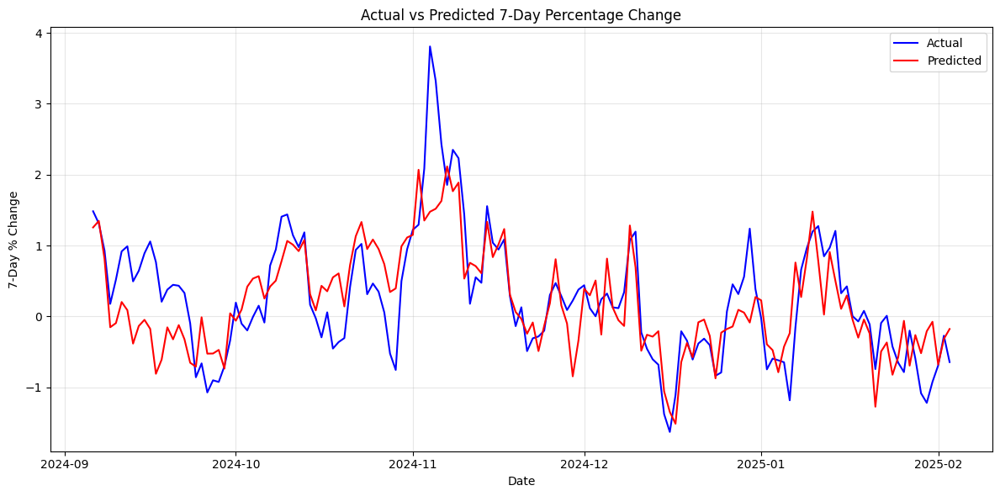

Error in visualization: 'total_capital'


<Figure size 1200x600 with 0 Axes>

In [ ]:
# Run backtest function
backtest_results_basic, performance_basic = fixed_backtest_model(
    model=model,                            # Final model used for prediction
    X=final_df,                             # Input DataFrame with features and target
    target_col='Original_7D_Pct_Change',    # Target column to predict (7-day percentage change)
    test_size=0.3,                          # Use 30% of data for backtesting
    step_size=0.05,                         # Move forward 5% of data in each walk-forward step

    # Capital allocation parameters
    initial_capital=100000,                 # Initial capital
    buy_hold_allocation=0.7,                # Allocate 70% of capital to buy & hold strategy
    trading_allocation=0.3,                 # Allocate 30% of capital to active trading

    # Risk management parameters
    position_size=0.05,                     # Use 5% of trading capital per position
    stop_loss=0.01,                         # Exit position if it loses 1%
    take_profit=0.01,                       # Exit position if it gains 1%

    # Signal generation parameters
    threshold=1,                            # Generate signal when prediction exceeds 1%
    confidence_margin=1,                    # Add 1% margin to threshold for stronger signals
    min_confirmations=0,                    # Technical confirmations, 0 = use raw signals

    # Visualization
    plot=True                               # Generate visualization plots
)

##Predicting % of Bitcoin Price Change in 7 Days

In [ ]:
def predict_future_bitcoin_change(model, current_data, confidence_level=0.95):
    """
    Predict the 7-day percentage change in Bitcoin price from today.

    Parameters:
    -----------
    model : trained model
        The trained prediction model
    current_data : DataFrame
        Contains the latest feature values
    confidence_level : float
        Confidence level for prediction intervals
    """
    # Extract only features the model was trained with
    if hasattr(model, 'feature_names_in_'):
        model_features = list(model.feature_names_in_)
    else:
        model_features = [col for col in current_data.columns
                          if not any(x in col for x in ['YeoJohnson_', 'Original_'])]

    # Get current date and price
    current_date = current_data.index[-1]
    current_price = current_data['Original_Price'].iloc[-1] if 'Original_Price' in current_data.columns else None
    target_date = current_date + pd.Timedelta(days=7)

    # Make prediction
    latest_features = current_data[model_features].iloc[-1:].copy()
    prediction = model.predict(latest_features)[0]

    # Calculate confidence interval (for RandomForest models)
    if hasattr(model, 'estimators_'):
        tree_predictions = [tree.predict(latest_features)[0] for tree in model.estimators_]
        alpha = 1 - confidence_level
        lower_bound = np.percentile(tree_predictions, (alpha/2)*100)
        upper_bound = np.percentile(tree_predictions, (1-alpha/2)*100)
        std_dev = np.std(tree_predictions)
    else:
        std_dev = abs(prediction) * 0.2
        lower_bound = prediction - 1.96 * std_dev
        upper_bound = prediction + 1.96 * std_dev

    # Determine signal
    if prediction > 2.0:
        signal = "BUY"
    elif prediction > 0:
        signal = "WEAK BUY"
    elif prediction < -2.0:
        signal = "SELL"
    elif prediction < 0:
        signal = "WEAK SELL"
    else:
        signal = "NEUTRAL"

    # Calculate price targets if price data is available
    if current_price:
        predicted_price = current_price * (1 + prediction/100)
        lower_price = current_price * (1 + lower_bound/100)
        upper_price = current_price * (1 + upper_bound/100)

        # Calculate stop loss and take profit
        if signal in ["BUY", "WEAK BUY"]:
            stop_loss = current_price * 0.95
            take_profit = current_price * (1 + max(prediction/100 * 1.5, 0.1))
        elif signal in ["SELL", "WEAK SELL"]:
            stop_loss = current_price * 1.05
            take_profit = current_price * (1 + min(prediction/100 * 1.5, -0.1))
        else:
            stop_loss = take_profit = None

    # Display results
    print(f"\n{'='*60}")
    print(f"BITCOIN 7-DAY PRICE PREDICTION ({confidence_level*100:.0f}% CONFIDENCE)")
    print(f"{'='*60}")
    print(f"Current Date: {current_date.strftime('%Y-%m-%d')}")
    print(f"Target Date:  {target_date.strftime('%Y-%m-%d')}")

    if current_price:
        print(f"\nCurrent Price: ${current_price:,.2f}")
        print(f"Predicted Price: ${predicted_price:,.2f}")
        print(f"Price Range: ${lower_price:,.2f} to ${upper_price:,.2f}")

    print(f"\nPredicted 7-Day Change: {prediction:.2f}%")
    print(f"Range: {lower_bound:.2f}% to {upper_bound:.2f}%")
    print(f"\nSIGNAL: {signal}")

    # Show trading advice
    print("\nTrading Advice:", end=" ")
    if signal == "BUY":
        print("Strong buying opportunity.")
        if current_price:
            print(f"Stop Loss: ${stop_loss:,.2f} (-5.00%)")
            print(f"Take Profit: ${take_profit:,.2f} (+{(take_profit/current_price-1)*100:.2f}%)")
    elif signal == "WEAK BUY":
        print("Mild bullish signal.")
    elif signal == "SELL":
        print("Strong selling opportunity.")
        if current_price:
            print(f"Stop Loss: ${stop_loss:,.2f} (+5.00%)")
            print(f"Take Profit: ${take_profit:,.2f} ({(take_profit/current_price-1)*100:.2f}%)")
    elif signal == "WEAK SELL":
        print("Mild bearish signal.")
    else:
        print("Hold current positions or stay out of the market.")

    print(f"{'='*60}")

    # Visualize prediction
    plt.figure(figsize=(10, 6))
    if current_price:
        dates = [current_date, target_date]
        plt.scatter([current_date], [current_price], color='blue', s=100, label='Current Price')
        plt.scatter([target_date], [predicted_price], color='red', s=100, label='Predicted Price')
        plt.plot(dates, [current_price, predicted_price], 'r--')

        # Show confidence interval
        plt.fill_between(
            [target_date-pd.Timedelta(days=0.5), target_date+pd.Timedelta(days=0.5)],
            [lower_price, lower_price],
            [upper_price, upper_price],
            color='red', alpha=0.2
        )
        plt.title(f'Bitcoin 7-Day Price Prediction: {prediction:.2f}%')
        plt.ylabel('Price ($)')
    else:
        # Just show percentage change
        plt.bar(['Predicted Change'], [prediction], color='red')
        plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
        plt.title(f'Predicted 7-Day Change: {prediction:.2f}%')
        plt.ylabel('Percent Change (%)')

    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return {
        'current_date': current_date,
        'target_date': target_date,
        'prediction_percent': prediction,
        'lower_bound': lower_bound,
        'upper_bound': upper_bound,
        'signal': signal,
        'current_price': current_price if current_price else None,
        'predicted_price': predicted_price if current_price else None
    }


BITCOIN 7-DAY PRICE PREDICTION (95% CONFIDENCE)
Current Date: 2025-02-03
Target Date:  2025-02-10

Current Price: $101,391.21
Predicted Price: $101,212.29
Price Range: $101,142.15 to $101,282.42

Predicted 7-Day Change: -0.18%
Range: -0.25% to -0.11%

SIGNAL: WEAK SELL

Trading Advice: Mild bearish signal.


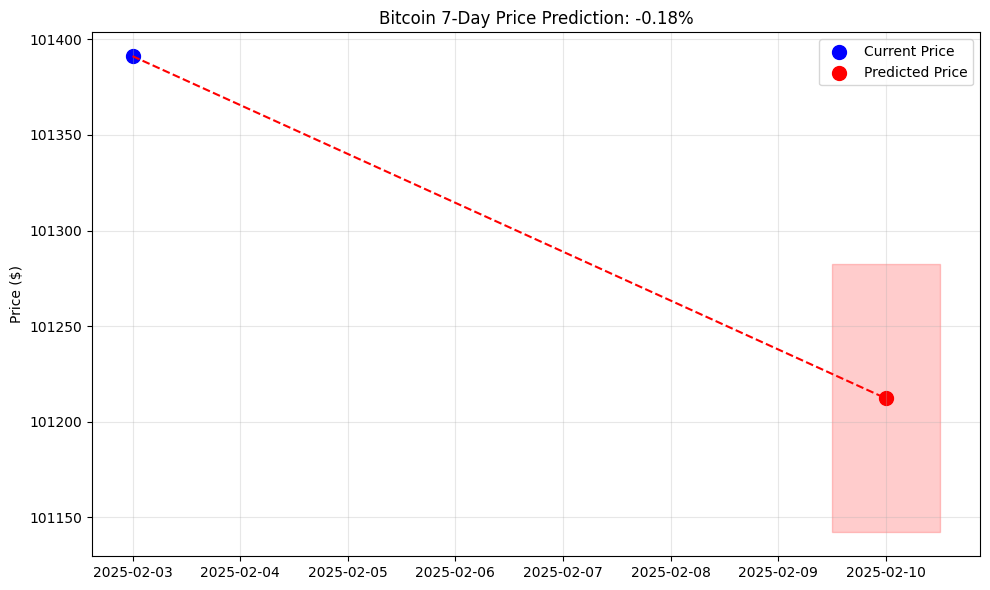

In [ ]:
# Predict % of bitcoin price change in 7 days (assuming the dataset is up-to-date)
prediction = predict_future_bitcoin_change(
    model=model,
    current_data=final_df,
    confidence_level=0.95
)